#About Delhivery

Delhivery is the largest and fastest-growing fully integrated player in India by revenue in Fiscal 2021. They aim to build the operating system for commerce, through a combination of world-class infrastructure, logistics operations of the highest quality, and cutting-edge engineering and technology capabilities.

The Data team builds intelligence and capabilities using this data that helps them to widen the gap between the quality, efficiency, and profitability of their business versus their competitors.

---

##How can you help here?

The company wants to understand and process the data coming out of data engineering pipelines:

• Clean, sanitize and manipulate data to get useful features out of raw fields

• Make sense out of the raw data and help the data science team to build forecasting models on it

#Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Load Dataset
---

Dataset Link: [delhivery_data.csv](https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/551/original/delhivery_data.csv?1642751181)

In [2]:
df = pd.read_csv("https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/551/original/delhivery_data.csv")

df_bak = df.copy(deep=True)

np.shares_memory(df, df_bak)

False

In [3]:
pd.set_option('display.max_columns', None)

#Column Profiling:

- data - tells whether the data is testing or training data
- trip_creation_time – Timestamp of trip creation
- route_schedule_uuid – Unique Id for a particular route schedule
- route_type – Transportation type
- FTL – Full Truck Load: FTL shipments get to the destination sooner, as the truck is making no other pickups or drop-offs along the way
- Carting: Handling system consisting of small vehicles (carts)
- trip_uuid - Unique ID given to a particular trip (A trip may include different source and destination centers)
- source_center - Source ID of trip origin
- source_name - Source Name of trip origin
- destination_cente – Destination ID
- destination_name – Destination Name
- od_start_time – Trip start time
- od_end_time – Trip end time
- start_scan_to_end_scan – Time taken to deliver from source to destination
- is_cutoff – Unknown field
- cutoff_factor – Unknown field
- cutoff_timestamp – Unknown field
- actual_distance_to_destination – Distance in Kms between source and destination warehouse
- actual_time – Actual time taken to complete the delivery (Cumulative)
- osrm_time – An open-source routing engine time calculator which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) and gives the time (Cumulative)
- osrm_distance – An open-source routing engine which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) (Cumulative)
- factor – Unknown field
- segment_actual_time – This is a segment time. Time taken by the subset of the package delivery
- segment_osrm_time – This is the OSRM segment time. Time taken by the subset of the package delivery
- segment_osrm_distance – This is the OSRM distance. Distance covered by subset of the package delivery
- segment_factor – Unknown field

#Utility Functions

In [4]:

def numerical_columns_distribution_with_stats(df):
    cols=df.select_dtypes(exclude=['object', 'category', 'datetime']).columns
    for col in cols:

      data = df[col].dropna()

      # Calculate statistics
      mean_val = data.mean()
      median_val = data.median()
      std_val = data.std()
      min_val = data.min()
      max_val = data.max()

      # Print statistics
      print(f"Statistics for {col}:")
      print(f"  Mean   : {mean_val:.2f}")
      print(f"  Median : {median_val:.2f}")
      print(f"  Std Dev: {std_val:.2f}")
      print(f"  Min    : {min_val:.2f}")
      print(f"  Max    : {max_val:.2f}")

      plt.figure(figsize=(15, 5))

      # Histogram
      plt.subplot(1, 3, 1)
      #plt.hist(data, bins=30, color='skyblue', edgecolor='black')
      sns.histplot(
        data=df,             # your DataFrame
        x=data,        # column to plot
        bins=30,             # number of bins
        kde=True,            # add kernel density estimate
        color='royalblue',   # bar color
        edgecolor='black',   # edge of bars
        stat='density'       # normalize histogram to density (optional)
        )
      plt.axvline(mean_val, color='red', linestyle='--', label=f"Mean: {mean_val:.0f}")
      plt.axvline(median_val, color='green', linestyle='--', label=f"Median: {median_val:.0f}")
      plt.title(f"Histogram of {col}")
      plt.xlabel(f"{col} Amount")
      plt.ylabel("Frequency")
      plt.legend()

      # Boxplot
      plt.subplot(1, 3, 2)
      sns.boxplot(x=data, color='orange')
      plt.title(f"Boxplot of {col}")
      plt.xlabel(f"{col} Amount")
      plt.text(mean_val, 0.02, f"Mean: {mean_val:.0f}", ha='center', color='red')
      plt.text(median_val, -0.05, f"Median: {median_val:.0f}", ha='center', color='green')

      # Density plot
      plt.subplot(1, 3, 3)
      sns.kdeplot(data, fill=True, color='green')
      plt.axvline(mean_val, color='red', linestyle='--', label=f"Mean: {mean_val:.0f}")
      plt.axvline(median_val, color='blue', linestyle='--', label=f"Median: {median_val:.0f}")
      plt.title(f"Density Plot of {col}")
      plt.xlabel(f"{col} Amount")
      plt.legend()

      plt.tight_layout()
      plt.show()


##Outlier Detection Functions

In [5]:

def iqr_outliers_boxplot(df):
    """
    Detects outliers in numeric columns using the IQR method

    """
    sns.set_palette("deep")  # Deep solid color theme
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower) | (df[col] > upper)][col]

        print(f"\nColumn: {col}")
        print(f"Number of outliers (IQR method): {len(outliers)}")

        # Boxplot
        plt.figure(figsize=(6,4))
        sns.boxplot(x=df[col], color='royalblue')
        plt.title(f'Boxplot of {col}')
        plt.show()


#Analysis

In [6]:
df.shape

(144867, 24)

In [7]:
df.sample(3)

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,is_cutoff,cutoff_factor,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
64474,training,2018-09-19 02:02:10.665926,thanos::sroute:828f0a4b-da11-4921-88df-5316ddb...,FTL,trip-153732253066566963,IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),IND821115AAB,Sasaram_Central_I_2 (Bihar),2018-09-19 02:02:10.665926,2018-09-20 03:50:05.808121,1547.0,True,88,2018-09-20 00:24:08,88.777623,192.0,69.0,94.2150,2.782609,36.0,15.0,21.3482,2.400000
140165,training,2018-09-24 14:12:52.552337,thanos::sroute:a9af5fc9-2972-4795-b7a7-9fd3cc0...,FTL,trip-153779837255206160,IND160002AAC,Chandigarh_Mehmdpur_H (Punjab),IND142001AAB,Moga_DPC (Punjab),2018-09-24 14:12:52.552337,2018-09-24 20:26:44.784092,373.0,True,110,2018-09-24 17:42:33,110.498140,163.0,87.0,120.2394,1.873563,31.0,17.0,24.2649,1.823529
76314,test,2018-09-30 01:00:34.183402,thanos::sroute:f01c8bbd-655d-42ea-9abf-60d5040...,FTL,trip-153826923418313854,IND209304AAA,Kanpur_Central_H_6 (Uttar Pradesh),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-10-01 06:10:30.659138,2018-10-02 00:27:15.361416,1096.0,True,154,2018-10-01 19:53:30,154.045763,221.0,143.0,185.7572,1.545455,27.0,17.0,23.5087,1.588235


In [8]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            144867 non-null  object 
 1   trip_creation_time              144867 non-null  object 
 2   route_schedule_uuid             144867 non-null  object 
 3   route_type                      144867 non-null  object 
 4   trip_uuid                       144867 non-null  object 
 5   source_center                   144867 non-null  object 
 6   source_name                     144574 non-null  object 
 7   destination_center              144867 non-null  object 
 8   destination_name                144606 non-null  object 
 9   od_start_time                   144867 non-null  object 
 10  od_end_time                     144867 non-null  object 
 11  start_scan_to_end_scan          144867 non-null  float64
 12  is_cutoff       

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
start_scan_to_end_scan,144867.0,961.262986,1037.012769,20.000000,161.000000,449.000000,1634.000000,7898.000000
cutoff_factor,144867.0,232.926567,344.755577,9.000000,22.000000,66.000000,286.000000,1927.000000
actual_distance_to_destination,144867.0,234.073372,344.990009,9.000045,23.355874,66.126571,286.708875,1927.447705
actual_time,144867.0,416.927527,598.103621,9.000000,51.000000,132.000000,513.000000,4532.000000
osrm_time,144867.0,213.868272,308.011085,6.000000,27.000000,64.000000,257.000000,1686.000000
osrm_distance,144867.0,284.771297,421.119294,9.008200,29.914700,78.525800,343.193250,2326.199100
factor,144867.0,2.120107,1.715421,0.144000,1.604264,1.857143,2.213483,77.387097
segment_actual_time,144867.0,36.196111,53.571158,-244.000000,20.000000,29.000000,40.000000,3051.000000
segment_osrm_time,144867.0,18.507548,14.775960,0.000000,11.000000,17.000000,22.000000,1611.000000
segment_osrm_distance,144867.0,22.829020,17.860660,0.000000,12.070100,23.513000,27.813250,2191.403700


In [11]:
unknown_columns = ['is_cutoff','cutoff_factor','cutoff_timestamp','factor','segment_factor']
df = df.drop(unknown_columns, axis=1)

In [12]:
df["trip_creation_time"] = pd.to_datetime(df["trip_creation_time"], format='mixed')
df["od_start_time"] = pd.to_datetime(df["od_start_time"], format='mixed')
df["od_end_time"] = pd.to_datetime(df["od_end_time"], format='mixed')

In [13]:
df['trip_creation_time'].min(),df['trip_creation_time'].max()

(Timestamp('2018-09-12 00:00:16.535741'),
 Timestamp('2018-10-03 23:59:42.701692'))

In [14]:
df['trip_creation_time'].max()-df['trip_creation_time'].min()

Timedelta('21 days 23:59:26.165951')

Data Only from 2018-09-12 mid-night to 2018-10-03 mid-night i.e. only of 22 days

In [15]:
for i in df.columns:
  print(i," : ",df[i].nunique())

data  :  2
trip_creation_time  :  14817
route_schedule_uuid  :  1504
route_type  :  2
trip_uuid  :  14817
source_center  :  1508
source_name  :  1498
destination_center  :  1481
destination_name  :  1468
od_start_time  :  26369
od_end_time  :  26369
start_scan_to_end_scan  :  1915
actual_distance_to_destination  :  144515
actual_time  :  3182
osrm_time  :  1531
osrm_distance  :  138046
segment_actual_time  :  747
segment_osrm_time  :  214
segment_osrm_distance  :  113799


In [16]:
df['data']=df['data'].astype('category')
df['route_type']=df['route_type'].astype('category')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144867 non-null  category      
 1   trip_creation_time              144867 non-null  datetime64[ns]
 2   route_schedule_uuid             144867 non-null  object        
 3   route_type                      144867 non-null  category      
 4   trip_uuid                       144867 non-null  object        
 5   source_center                   144867 non-null  object        
 6   source_name                     144574 non-null  object        
 7   destination_center              144867 non-null  object        
 8   destination_name                144606 non-null  object        
 9   od_start_time                   144867 non-null  datetime64[ns]
 10  od_end_time                     144867 non-null  datetim

In [18]:
df.isna().sum()

,0
data,0
trip_creation_time,0
route_schedule_uuid,0
route_type,0
trip_uuid,0
source_center,0
source_name,293
destination_center,0
destination_name,261
od_start_time,0


>destination_name & source_name have some missing values

#Handling Missing Values

In [19]:
missing_name_source_center = df[df['source_name'].isna()]['source_center'].unique()
missing_name_source_center

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND509103AAC', 'IND126116AAA', 'IND331022A1B',
       'IND505326AAB', 'IND852118A1B'], dtype=object)

In [20]:
df[df['source_center'].isin(missing_name_source_center)]['source_name'].shape

(293,)

In [21]:
df[df['source_center'].isin(missing_name_source_center)]['source_name'].isna().sum()

np.int64(293)

In [22]:
missing_name_destination_center = df[df['destination_name'].isna()]['destination_center'].unique()
missing_name_destination_center

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND505326AAB', 'IND852118A1B', 'IND126116AAA',
       'IND509103AAC', 'IND221005A1A', 'IND250002AAC', 'IND331001A1C',
       'IND122015AAC'], dtype=object)

In [23]:
df[df['destination_center'].isin(missing_name_destination_center)]['destination_name'].shape

(261,)

In [24]:
df[df['destination_center'].isin(missing_name_destination_center)]['destination_name'].isna().sum()

np.int64(261)

In [25]:
df["source_name"] = df["source_name"].fillna(df["source_center"])
df["destination_name"] = df["destination_name"].fillna(df["destination_center"])

In [26]:
df.isna().sum()

,0
data,0
trip_creation_time,0
route_schedule_uuid,0
route_type,0
trip_uuid,0
source_center,0
source_name,0
destination_center,0
destination_name,0
od_start_time,0


In [27]:
for i in df.columns:
  print(df[i].value_counts(normalize=True)*100)
  print()
  print("="*15)
  print(df[i].value_counts())
  print("="*15)
  print()

data
training    72.382254
test        27.617746
Name: proportion, dtype: float64

data
training    104858
test         40009
Name: count, dtype: int64

trip_creation_time
2018-09-22 04:55:04.835022    0.069719
2018-09-17 04:43:09.467353    0.069719
2018-09-25 04:21:12.551117    0.069719
2018-09-19 04:07:34.091798    0.069719
2018-09-28 05:23:15.359220    0.069719
                                ...   
2018-09-18 16:45:14.545872    0.000690
2018-09-19 06:09:03.938546    0.000690
2018-09-25 14:29:24.418575    0.000690
2018-09-13 05:21:26.007488    0.000690
2018-09-29 00:39:33.272457    0.000690
Name: proportion, Length: 14817, dtype: float64

trip_creation_time
2018-09-22 04:55:04.835022    101
2018-09-17 04:43:09.467353    101
2018-09-25 04:21:12.551117    101
2018-09-19 04:07:34.091798    101
2018-09-28 05:23:15.359220    101
                             ... 
2018-09-18 16:45:14.545872      1
2018-09-19 06:09:03.938546      1
2018-09-25 14:29:24.418575      1
2018-09-13 05:21:26.00748

In [28]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
trip_creation_time,144867,2018-09-22 13:34:23.659819264,2018-09-12 00:00:16.535741,2018-09-17 03:20:51.775845888,2018-09-22 04:24:27.932764928,2018-09-27 17:57:56.350054912,2018-10-03 23:59:42.701692,NaN
od_start_time,144867,2018-09-22 18:02:45.855230720,2018-09-12 00:00:16.535741,2018-09-17 08:05:40.886155008,2018-09-22 08:53:00.116656128,2018-09-27 22:41:50.285857024,2018-10-06 04:27:23.392375,NaN
od_end_time,144867,2018-09-23 10:04:31.395393024,2018-09-12 00:50:10.814399,2018-09-18 01:48:06.410121984,2018-09-23 03:13:03.520212992,2018-09-28 12:49:06.054018048,2018-10-08 03:00:24.353479,NaN
start_scan_to_end_scan,144867.0,961.262986,20.0,161.0,449.0,1634.0,7898.0,1037.012769
actual_distance_to_destination,144867.0,234.073372,9.000045,23.355874,66.126571,286.708875,1927.447705,344.990009
actual_time,144867.0,416.927527,9.0,51.0,132.0,513.0,4532.0,598.103621
osrm_time,144867.0,213.868272,6.0,27.0,64.0,257.0,1686.0,308.011085
osrm_distance,144867.0,284.771297,9.0082,29.9147,78.5258,343.19325,2326.1991,421.119294
segment_actual_time,144867.0,36.196111,-244.0,20.0,29.0,40.0,3051.0,53.571158
segment_osrm_time,144867.0,18.507548,0.0,11.0,17.0,22.0,1611.0,14.77596


In [29]:
df.describe(include=object).T

,count,unique,top,freq
route_schedule_uuid,144867,1504,thanos::sroute:4029a8a2-6c74-4b7e-a6d8-f9e069f...,1812
trip_uuid,144867,14817,trip-153759210483476123,101
source_center,144867,1508,IND000000ACB,23347
source_name,144867,1508,Gurgaon_Bilaspur_HB (Haryana),23347
destination_center,144867,1481,IND000000ACB,15192
destination_name,144867,1481,Gurgaon_Bilaspur_HB (Haryana),15192


#Feature Engineering

In [30]:
df['segment_key'] = df['trip_uuid'] +'_'+ df['source_center'] +'_'+ df['destination_center']

df.insert(0, "segment_key", df.pop("segment_key"))

df.sample(3)

,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
69622,trip-153782527641032431_IND321001AAA_IND321401AAB,training,2018-09-24 21:41:16.410737,thanos::sroute:bca9677c-ee8d-43c6-a4ca-0de0eb0...,FTL,trip-153782527641032431,IND321001AAA,Bharatpur_DC (Rajasthan),IND321401AAB,Bayana_LalBagh_D (Rajasthan),2018-09-25 02:04:58.210806,2018-09-25 02:59:52.590919,54.0,38.519233,51.0,37.0,40.8079,19.0,14.0,15.3380
26605,trip-153690390108127007_IND144001AAB_IND144401AAB,training,2018-09-14 05:45:01.081508,thanos::sroute:6b1aa241-516a-497b-9a46-37fa1b8...,Carting,trip-153690390108127007,IND144001AAB,Jalandhar_DPC (Punjab),IND144401AAB,Phagwara_Lovely_D (Punjab),2018-09-14 05:45:01.081508,2018-09-14 06:17:38.177445,32.0,11.552141,26.0,12.0,13.7710,14.0,5.0,4.1086
9987,trip-153789829649995554_IND712311AAA_IND834002AAB,training,2018-09-25 17:58:16.500192,thanos::sroute:fa83fd49-3327-4503-8e80-bf58ed6...,FTL,trip-153789829649995554,IND712311AAA,Kolkata_Dankuni_HB (West Bengal),IND834002AAB,Ranchi_Hub (Jharkhand),2018-09-25 17:58:16.500192,2018-09-26 11:28:14.512038,1049.0,177.102418,420.0,176.0,240.1062,34.0,23.0,32.6979


In [31]:
print("Unique segments:", df["segment_key"].nunique())

Unique segments: 26368


In [32]:
df['segment_actual_time_sum']=df.groupby('segment_key')['segment_actual_time'].transform(lambda x:x.cumsum())

df['segment_osrm_time_sum']=df.groupby('segment_key')['segment_osrm_time'].transform(lambda x:x.cumsum())

df['segment_osrm_distance_sum']=df.groupby('segment_key')['segment_osrm_distance'].transform(lambda x:x.cumsum())

In [33]:
df['od_time_diff_hour'] = (df['od_end_time'] - df['od_start_time']).dt.total_seconds()/3600

In [34]:
def get_state_name_source(x):
  if x not in missing_name_source_center:
    return x.split(' (')[1].split(')')[0]
  else:
    return x

def get_state_name_destination(x):
  if x not in missing_name_destination_center:
    return x.split(' (')[1].split(')')[0]
  else:
    return x

##########################3

def get_city_name_source(x):
  if x not in missing_name_source_center:
    if '_' in x:
      return x.split('_')[0]
    elif ' ' in x:
      return x.split(' ')[0]
  else:
    return x

def get_city_name_destination(x):
  if x not in missing_name_destination_center:
    if '_' in x:
      return x.split('_')[0]
    elif ' ' in x:
      return x.split(' ')[0]
  else:
    return x

#########################

def get_place_name_source(x):
  if x not in missing_name_source_center:
    if '_' in x:
      return x.split('_')[1]
    elif ' ' in x:
      return x.split(' ')[0]
  else:
    return x

def get_place_name_destination(x):
  if x not in missing_name_destination_center:
    if '_' in x:
      return x.split('_')[1]
    elif ' ' in x:
      return x.split(' ')[0]
  else:
    return x

#################

In [35]:
df['source_state_name'] = df['source_name'].apply(get_state_name_source)
df['destination_state_name'] = df['destination_name'].apply(get_state_name_destination)

df["source_city_name"] = df["source_name"].apply(get_city_name_source)
df["destination_city_name"] = df["destination_name"].apply(get_city_name_destination)

df['source_place_name'] = df['source_name'].apply(get_place_name_source)
df['destination_place_name'] = df['destination_name'].apply(get_place_name_destination)

df['trip_creation_year']=df['trip_creation_time'].dt.year
df['trip_creation_month']=df['trip_creation_time'].dt.month
df['trip_creation_day']=df['trip_creation_time'].dt.day
df['trip_creation_hour']=df['trip_creation_time'].dt.hour
df['trip_creation_week']=df['trip_creation_time'].dt.isocalendar().week

In [36]:
df['trip_creation_day_name'] = df['trip_creation_time'].dt.day_name()

In [37]:
create_segment_dict = {
    "data": "first",
    "trip_uuid": "first",
    "trip_creation_time": "first",
    "route_schedule_uuid": "first",
    "route_type": "first",
    "source_center": "first",
    "source_name": "first",
    "destination_name": "first",
    "destination_center": "first",
    "od_start_time": "first",
    "od_end_time": "last",
    "od_time_diff_hour": "last",
    "start_scan_to_end_scan": "mean",
    "actual_distance_to_destination": "max",
    "actual_time": "last",# it mentioned cumulative in the profiling
    "osrm_time": "last",
    "osrm_distance": "last",
    "segment_actual_time_sum": "last",
    "segment_osrm_time_sum": "last",
    "segment_osrm_distance_sum": "last",
    "source_state_name": "first",
    "destination_state_name": "first",
    "source_city_name": "first",
    "destination_city_name": "first",
    "source_place_name": "first",
    "destination_place_name": "first",
    "trip_creation_year": "first",
    "trip_creation_month": "first",
    "trip_creation_day": "first",
    "trip_creation_hour": "first",
    "trip_creation_week": "first",
    "trip_creation_day_name": "first"
}

In [38]:
df_segment = df.groupby("segment_key", as_index=False, sort=False).agg(create_segment_dict)
df_segment.sample(3)

,segment_key,data,trip_uuid,trip_creation_time,route_schedule_uuid,route_type,source_center,source_name,destination_name,destination_center,od_start_time,od_end_time,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_state_name,destination_state_name,source_city_name,destination_city_name,source_place_name,destination_place_name,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_hour,trip_creation_week,trip_creation_day_name
8781,trip-153722925711568695_IND302014AAB_IND302026AAA,training,trip-153722925711568695,2018-09-18 00:07:37.115902,thanos::sroute:b62ab3ed-c60b-47d2-8c91-fe62135...,Carting,IND302014AAB,Jaipur_Central_I_7 (Rajasthan),Jaipur_Bhankrot_DC (Rajasthan),IND302026AAA,2018-09-18 00:07:37.115902,2018-09-18 02:23:36.156917,2.266400,135.0,14.586940,90.0,18.0,19.2342,89.0,19.0,19.9245,Rajasthan,Rajasthan,Jaipur,Jaipur,Central,Bhankrot,2018,9,18,0,38,Tuesday
9517,trip-153793408432667900_IND335703AAA_IND335701AAA,training,trip-153793408432667900,2018-09-26 03:54:44.327050,thanos::sroute:147ddb06-42e6-4598-ae86-6cb0862...,Carting,IND335703AAA,Srivijaynagar_BhwanDPP_D (Rajasthan),Anupgarh_PrmNrDPP_D (Rajasthan),IND335701AAA,2018-09-26 07:09:31.743359,2018-09-26 07:56:53.623743,0.789411,47.0,30.937145,37.0,32.0,35.0660,36.0,31.0,35.0660,Rajasthan,Rajasthan,Srivijaynagar,Anupgarh,BhwanDPP,PrmNrDPP,2018,9,26,3,39,Wednesday
13487,trip-153850919332008449_IND852113AAA_IND852139AAB,test,trip-153850919332008449,2018-10-02 19:39:53.320333,thanos::sroute:55f92e5f-4e98-4f2c-944d-98aceb6...,FTL,IND852113AAA,Madhepura_Krishnpr_D (Bihar),Triveninganj_Central_D_1 (Bihar),IND852139AAB,2018-10-03 05:16:16.274975,2018-10-03 07:00:22.445899,1.735047,104.0,22.162897,57.0,23.0,33.9629,57.0,23.0,33.9629,Bihar,Bihar,Madhepura,Triveninganj,Krishnpr,Central,2018,10,2,19,40,Tuesday


In [39]:
create_trip_dict = {
    "source_name": "first",
    "destination_name": "last",
    "source_center": "first",
    "destination_center": "last",
    "data": "first",
    "trip_creation_time": "first",
    "route_schedule_uuid": "first",
    "route_type": "first",
    "od_start_time": "first",
    "od_end_time": "last",
    "od_time_diff_hour": "sum",
    "start_scan_to_end_scan": "sum",
    "actual_distance_to_destination": "sum",
    "actual_time": "sum",
    "osrm_time": "sum",
    "osrm_distance": "sum",
    "segment_actual_time_sum": "sum",
    "segment_osrm_time_sum": "sum",
    "segment_osrm_distance_sum": "sum",
    "source_state_name": "first",
    "destination_state_name": "last",
    "source_city_name": "first",
    "destination_city_name": "last",
    "source_place_name": "first",
    "destination_place_name": "last",
    "trip_creation_year": "first",
    "trip_creation_month": "first",
    "trip_creation_day": "first",
    "trip_creation_hour": "first",
    "trip_creation_week": "first",
    "trip_creation_day_name": "first"
}

In [40]:
df_trip = df_segment.groupby("trip_uuid", as_index=False, sort=False).agg(create_trip_dict)
df_trip.sample(3)

,trip_uuid,source_name,destination_name,source_center,destination_center,data,trip_creation_time,route_schedule_uuid,route_type,od_start_time,od_end_time,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_state_name,destination_state_name,source_city_name,destination_city_name,source_place_name,destination_place_name,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_hour,trip_creation_week,trip_creation_day_name
8101,trip-153736520647689024,Del_Okhla_PC (Delhi),Sonipat_Kundli_H (Haryana),IND110044AAB,IND131028AAB,training,2018-09-19 13:53:26.477209,thanos::sroute:a5551235-c46a-4e2c-9e91-b214717...,Carting,2018-09-19 13:53:26.477209,2018-09-19 16:36:12.090494,2.712670,162.0,41.549308,114.0,54.0,44.2435,113.0,57.0,52.2824,Delhi,Haryana,Del,Sonipat,Okhla,Kundli,2018,9,19,13,38,Wednesday
12256,trip-153697021378327398,Bhiwandi_Mankoli_HB (Maharashtra),Mumbai_MiraRoad_M (Maharashtra),IND421302AAG,IND401104AAB,training,2018-09-15 00:10:13.783634,thanos::sroute:8650d5af-3211-4485-a9d8-b6c24ca...,Carting,2018-09-15 00:10:13.783634,2018-09-15 04:40:08.614664,4.498564,269.0,16.882499,61.0,25.0,28.8110,61.0,25.0,28.8110,Maharashtra,Maharashtra,Bhiwandi,Mumbai,Mankoli,MiraRoad,2018,9,15,0,37,Saturday
8393,trip-153821812635719446,Bhiwandi_Mankoli_HB (Maharashtra),Bhiwandi_Mankoli_HB (Maharashtra),IND421302AAG,IND421302AAG,test,2018-09-29 10:48:46.357451,thanos::sroute:0007affd-fd01-4cf0-8a4f-90419df...,Carting,2018-09-29 10:48:46.357451,2018-09-29 22:37:40.550023,10.270369,616.0,32.747912,168.0,53.0,59.1549,168.0,54.0,61.3297,Maharashtra,Maharashtra,Bhiwandi,Bhiwandi,Mankoli,Mankoli,2018,9,29,10,39,Saturday


#Temp Check

In [41]:
df[df['trip_uuid']=="trip-153741093647649320"]

,segment_key,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_time_diff_hour,source_state_name,destination_state_name,source_city_name,destination_city_name,source_place_name,destination_place_name,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_hour,trip_creation_week,trip_creation_day_name
0,trip-153741093647649320_IND388121AAA_IND388620AAB,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,10.435660,14.0,11.0,11.9653,14.0,11.0,11.9653,14.0,11.0,11.9653,1.436894,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
1,trip-153741093647649320_IND388121AAA_IND388620AAB,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,18.936842,24.0,20.0,21.7243,10.0,9.0,9.7590,24.0,20.0,21.7243,1.436894,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
2,trip-153741093647649320_IND388121AAA_IND388620AAB,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,27.637279,40.0,28.0,32.5395,16.0,7.0,10.8152,40.0,27.0,32.5395,1.436894,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
3,trip-153741093647649320_IND388121AAA_IND388620AAB,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,36.118028,62.0,40.0,45.5620,21.0,12.0,13.0224,61.0,39.0,45.5619,1.436894,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
4,trip-153741093647649320_IND388121AAA_IND388620AAB,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,86.0,39.386040,68.0,44.0,54.2181,6.0,5.0,3.9153,67.0,44.0,49.4772,1.436894,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
5,trip-153741093647649320_IND388620AAB_IND388320AAA,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),2018-09-20 04:47:45.236797,2018-09-20 06:36:55.627764,109.0,10.403038,15.0,11.0,12.1171,15.0,11.0,12.1171,15.0,11.0,12.1171,1.819553,Gujarat,Gujarat,Khambhat,Anand,MotvdDPP,Vaghasi,2018,9,20,2,38,Thursday
6,trip-153741093647649320_IND388620AAB_IND388320AAA,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),IND388320AAA,Anand_Vaghasi_IP (Gujarat),2018-09-20 04:47:45.236797,2018-09-20 06:36:55.627764,109.0,18.045481,44.0,17.0,21.2890,28.0,6.0,9.1719,43.0,17.0,21.2890,1.819553,Gujarat,Gujarat,Khambhat,Anand,MotvdDPP,Vaghasi,2018,9,20,2,38,Thursday
7,trip-153741093647649320_IND388620AAB_IND388320AAA,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-15374109364

In [42]:
df_segment[df_segment['trip_uuid']=="trip-153741093647649320"]

,segment_key,data,trip_uuid,trip_creation_time,route_schedule_uuid,route_type,source_center,source_name,destination_name,destination_center,od_start_time,od_end_time,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_state_name,destination_state_name,source_city_name,destination_city_name,source_place_name,destination_place_name,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_hour,trip_creation_week,trip_creation_day_name
0,trip-153741093647649320_IND388121AAA_IND388620AAB,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,IND388121AAA,Anand_VUNagar_DC (Gujarat),Khambhat_MotvdDPP_D (Gujarat),IND388620AAB,2018-09-20 03:21:32.418600,2018-09-20 04:47:45.236797,1.436894,86.0,39.386040,68.0,44.0,54.2181,67.0,44.0,49.4772,Gujarat,Gujarat,Anand,Khambhat,VUNagar,MotvdDPP,2018,9,20,2,38,Thursday
1,trip-153741093647649320_IND388620AAB_IND388320AAA,training,trip-153741093647649320,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),Anand_Vaghasi_IP (Gujarat),IND388320AAA,2018-09-20 04:47:45.236797,2018-09-20 06:36:55.627764,1.819553,109.0,43.595802,102.0,45.0,53.2334,100.0,44.0,53.2334,Gujarat,Gujarat,Khambhat,Anand,MotvdDPP,Vaghasi,2018,9,20,2,38,Thursday


In [43]:
df_trip[df_trip['trip_uuid']=="trip-153741093647649320"]

,trip_uuid,source_name,destination_name,source_center,destination_center,data,trip_creation_time,route_schedule_uuid,route_type,od_start_time,od_end_time,od_time_diff_hour,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,source_state_name,destination_state_name,source_city_name,destination_city_name,source_place_name,destination_place_name,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_hour,trip_creation_week,trip_creation_day_name
0,trip-153741093647649320,Anand_VUNagar_DC (Gujarat),Anand_Vaghasi_IP (Gujarat),IND388121AAA,IND388320AAA,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,2018-09-20 03:21:32.418600,2018-09-20 06:36:55.627764,3.256447,195.0,82.981842,170.0,89.0,107.4515,167.0,88.0,102.7106,Gujarat,Gujarat,Anand,Anand,VUNagar,Vaghasi,2018,9,20,2,38,Thursday


#Analysis

In [44]:
df_segment.nunique()

,0
segment_key,26368
data,2
trip_uuid,14817
trip_creation_time,14817
route_schedule_uuid,1504
route_type,2
source_center,1508
source_name,1508
destination_name,1481
destination_center,1481


In [45]:
df_trip.nunique()

,0
trip_uuid,14817
source_name,868
destination_name,956
source_center,868
destination_center,956
data,2
trip_creation_time,14817
route_schedule_uuid,1504
route_type,2
od_start_time,14817


In [46]:
df_trip['route_type'].value_counts(normalize=True)*100

,proportion
route_type,
Carting,60.120132
FTL,39.879868


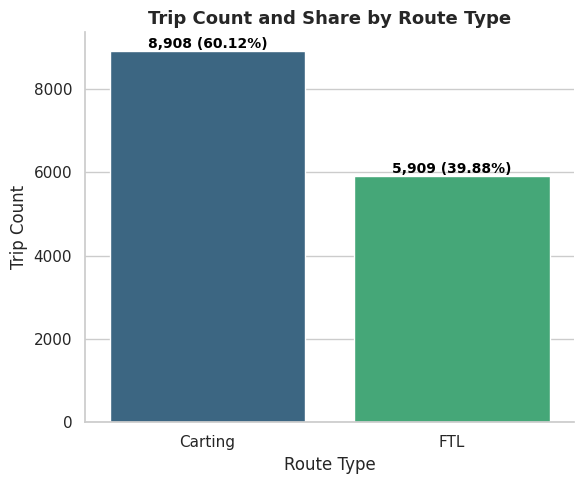

In [48]:


sns.set_theme(style="whitegrid", palette="viridis")

plt.figure(figsize=(6,5))

ax = sns.countplot(
    data=df_trip,
    x='route_type',
    hue='route_type',
    palette='viridis',
    legend=False
)


total = len(df_trip)

for p in ax.patches:
    count = int(p.get_height())
    pct = 100 * count / total
    label = f'{count:,} ({pct:.2f}%)'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(label, (x, y), ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

plt.title("Trip Count and Share by Route Type", fontsize=13, fontweight='bold')
plt.xlabel("Route Type")
plt.ylabel("Trip Count")
sns.despine()
plt.tight_layout()
plt.show()


In [49]:
import matplotlib.cm as cm

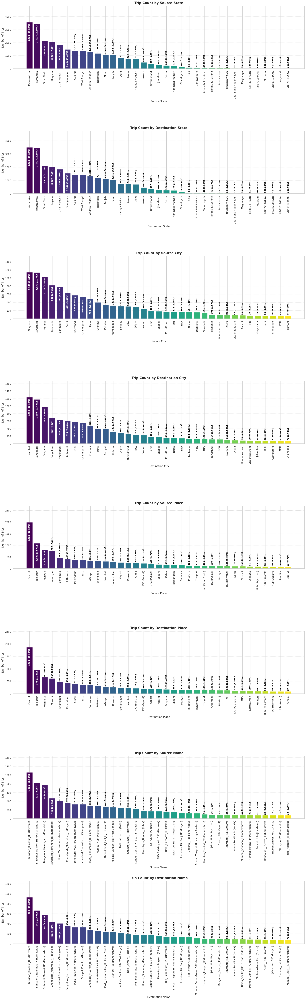

In [50]:

features = [
    ("source_state_name", "Source State"),
    ("destination_state_name", "Destination State"),
    ("source_city_name", "Source City"),
    ("destination_city_name", "Destination City"),
    ("source_place_name", "Source Place"),
    ("destination_place_name", "Destination Place"),
    ("source_name", "Source Name"),
    ("destination_name", "Destination Name")
]


fig, axes = plt.subplots(nrows=len(features), ncols=1, figsize=(20, 65))

for ax, (col, title) in zip(axes, features):
    counts = df_segment[col].value_counts().head(35)
    total = counts.sum()
    max_val = counts.max()
    my_color = [cm.viridis(x) for x in np.linspace(0, 1, len(counts))]
    bars = ax.bar(counts.index, counts.values, color=my_color)

    for bar, value in zip(bars, counts.values):
        pct = 100 * value / total
        label = f"{int(value):,} ({pct:.2f}%)"
        bar_height = bar.get_height()
        x = bar.get_x() + bar.get_width() / 2

        # Position logic: inside for tall bars, above for short ones
        if bar_height > max_val * 0.40:
            y = bar_height - max_val * 0.03
            va, color = "top", "white"
        else:
            y = bar_height + max_val * 0.015
            va, color = "bottom", "black"

        ax.text(
            x, y, label,
            ha="center", va=va,
            fontsize=9.5, fontweight="bold", color=color,
            rotation=90 if len(counts) > 25 else 0,
            clip_on=False
        )


    ax.set_title(f"Trip Count by {title}", fontsize=15, weight="bold", pad=10)
    ax.set_xlabel(title, fontsize=12)
    ax.set_ylabel("Number of Trips", fontsize=12)
    ax.tick_params(axis="x", rotation=90)
    ax.grid(axis="y", linestyle="--", alpha=0.6)
    ax.set_ylim(0, max_val * 1.35)

plt.tight_layout(h_pad=3)
plt.show()


- Insights:

  - Source State contributors:<br>

      Maharashtra, Karnataka ,Tamil Nadu, Haryana, and Uttar Pradesh are the top contributors where maximum bookings are recorded .

  - Source City contributors:<br>

      Cities like Bengaluru, Gurgaon, Mumbai, Bhiwandi, Delhi, Hyderabad where the major no.of booking are recorded.

  - Destination State:<br>

      States like Karnataka, Maharashtra, Tamil Nadu, Haryana, and Uttar Pradesh where maximum packages are received in this month indicating significant engagement.

  - Destination City: <br>

      Cities like Bengaluru, Mumbai, Gurgaon, Bhiwandi, Hyderabad, Delhi where the major no.of booking are received.

In [51]:
segment_corridor_counts = (
    df_segment.groupby(["source_name", "destination_name"])
    .size()
    .reset_index(name="trip_count")
    .sort_values("trip_count", ascending=False)
)

segment_corridor_counts['corridor'] = segment_corridor_counts['source_name'] + ' <<--------->> ' + segment_corridor_counts['destination_name']

segment_corridor_counts

,source_name,destination_name,trip_count,corridor
215,Bangalore_Nelmngla_H (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),151,Bangalore_Nelmngla_H (Karnataka) <<--------->>...
213,Bangalore_Nelmngla_H (Karnataka),Bengaluru_Bomsndra_HB (Karnataka),127,Bangalore_Nelmngla_H (Karnataka) <<--------->>...
307,Bengaluru_Bomsndra_HB (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),121,Bengaluru_Bomsndra_HB (Karnataka) <<--------->...
321,Bengaluru_KGAirprt_HB (Karnataka),Bangalore_Nelmngla_H (Karnataka),108,Bengaluru_KGAirprt_HB (Karnataka) <<--------->...
2197,Pune_Tathawde_H (Maharashtra),Bhiwandi_Mankoli_HB (Maharashtra),107,Pune_Tathawde_H (Maharashtra) <<--------->> Bh...
...,...,...,...,...
12,AhmedNagar_DC (Maharashtra),Parner_Hindcwk_D (Maharashtra),1,AhmedNagar_DC (Maharashtra) <<--------->> Parn...
13,AhmedNagar_DC (Maharashtra),Pune_Tathawde_H (Maharashtra),1,AhmedNagar_DC (Maharashtra) <<--------->> Pune...
2752,Visakhapatnam_Gajuwaka_IP (Andhra Pradesh),Koraput_GhtimDPP_D (Orissa),1,Visakhapatnam_Gajuwaka_IP (Andhra Pradesh) <<-...
2740,Vikarabad_Central_DPP_2 (Telangana),Hyderabad_Shamshbd_H (Telangana),1,Vikarabad_Central_DPP_2 (Telangana) <<--------...


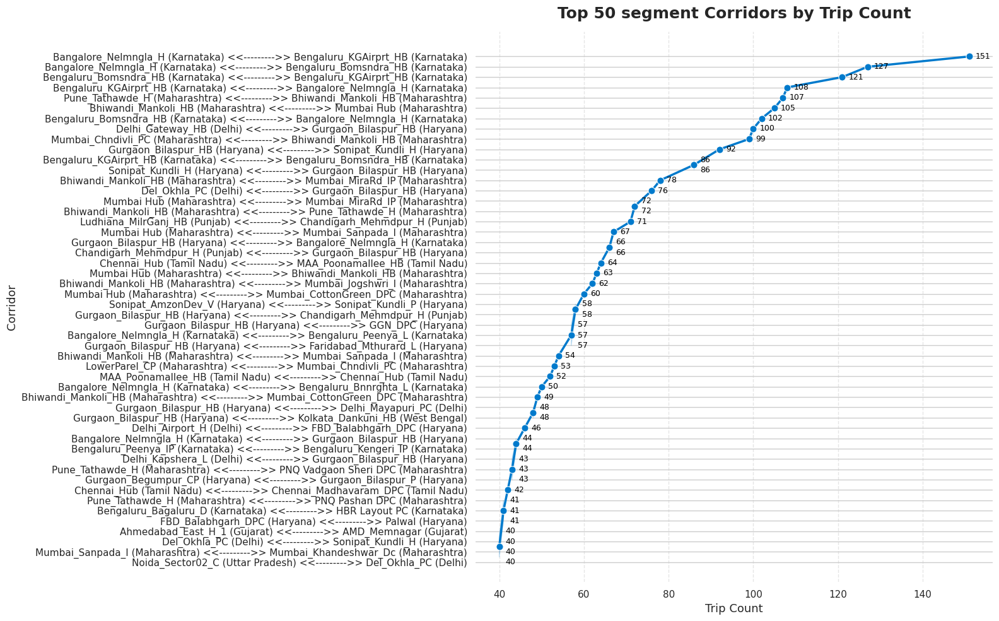

In [52]:
corridor_counts = segment_corridor_counts['trip_count'][:50]
corridor_names = segment_corridor_counts['corridor'][:50]

plt.figure(figsize=(16, 10))

sns.lineplot(
    y=corridor_names,
    x=corridor_counts,
    marker='o',
    markersize=8,
    linewidth=2.5,
    color="#007acc",
)

for x, y in zip(corridor_counts, corridor_names):
    plt.text(
        x + 0.01 * max(corridor_counts),
        y,
        f"{x:,}",
        va='center',
        fontsize=9,
        fontweight='medium',
        color='black'
    )

plt.title("Top 50 segment Corridors by Trip Count", fontsize=18, fontweight="bold", pad=15)
plt.xlabel("Trip Count", fontsize=13)
plt.ylabel("Corridor", fontsize=13)
plt.grid(axis='x', linestyle='--', alpha=0.5)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()


**Insights**:**Busiest Segment Corridor**<br>
- **Bangalore_Nelmngla_H (Karnataka)** - **Bengaluru_KGAirprt_HB (Karnataka)** : 151 segment trip
- **Bangalore_Nelmngla_H (Karnataka)** - **Bengaluru_Bomsndra_HB (Karnataka)** : 127 segment trips
- **Bengaluru_Bomsndra_HB (Karnataka)** - **Bengaluru_KGAirprt_HB (Karnataka)** : 121 segment trips


In [53]:
trip_corridor_counts = (
    df_trip.groupby(["source_name", "destination_name"])
    .size()
    .reset_index(name="trip_count")
    .sort_values("trip_count", ascending=False)
)
trip_corridor_counts['corridor'] = trip_corridor_counts['source_name'] + ' <<--------->> ' + trip_corridor_counts['destination_name']

trip_corridor_counts

,source_name,destination_name,trip_count,corridor
447,Chandigarh_Mehmdpur_H (Punjab),Chandigarh_Mehmdpur_H (Punjab),175,Chandigarh_Mehmdpur_H (Punjab) <<--------->> C...
177,Bangalore_Nelmngla_H (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),151,Bangalore_Nelmngla_H (Karnataka) <<--------->>...
1520,Muzaffrpur_Bbganj_I (Bihar),Muzaffrpur_Bbganj_I (Bihar),130,Muzaffrpur_Bbganj_I (Bihar) <<--------->> Muza...
247,Bengaluru_Bomsndra_HB (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),121,Bengaluru_Bomsndra_HB (Karnataka) <<--------->...
327,Bhiwandi_Mankoli_HB (Maharashtra),Bhiwandi_Mankoli_HB (Maharashtra),113,Bhiwandi_Mankoli_HB (Maharashtra) <<--------->...
...,...,...,...,...
928,Hooghly_DC (West Bengal),Kolkata_North_I_4 (West Bengal),1,Hooghly_DC (West Bengal) <<--------->> Kolkata...
929,Hoskote_DC (Karnataka),Bengaluru_Hoodi_IP (Karnataka),1,Hoskote_DC (Karnataka) <<--------->> Bengaluru...
21,Ahmedabad_East_H_1 (Gujarat),Lunawada_VrdhriRD_D (Gujarat),1,Ahmedabad_East_H_1 (Gujarat) <<--------->> Lun...
26,Ahmedabad_East_H_1 (Gujarat),Udaipur_Mangri_I (Rajasthan),1,Ahmedabad_East_H_1 (Gujarat) <<--------->> Uda...


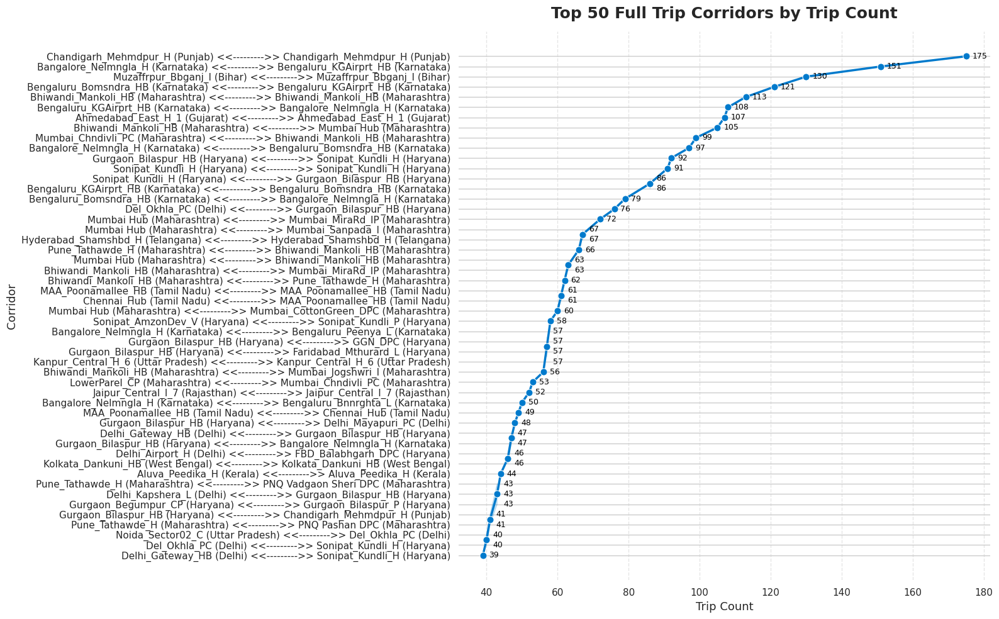

In [54]:
corridor_counts = trip_corridor_counts['trip_count'][:50]
corridor_names = trip_corridor_counts['corridor'][:50]

plt.figure(figsize=(16, 10))

sns.lineplot(
    y=corridor_names,
    x=corridor_counts,
    marker='o',
    markersize=8,
    linewidth=2.5,
    color="#007acc",
)

for x, y in zip(corridor_counts, corridor_names):
    plt.text(
        x + 0.01 * max(corridor_counts),
        y,
        f"{x:,}",
        va='center',
        fontsize=9,
        fontweight='medium',
        color='black'
    )

plt.title("Top 50 Full Trip Corridors by Trip Count", fontsize=18, fontweight="bold", pad=15)
plt.xlabel("Trip Count", fontsize=13)
plt.ylabel("Corridor", fontsize=13)
plt.grid(axis='x', linestyle='--', alpha=0.5)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

**Insight**: **Busiest Trip Corridor**
<br>
- **Chandigarh_Mehmdpur_H (Punjab)**	-- **Chandigarh_Mehmdpur_H (Punjab)** :	175

- **Bangalore_Nelmngla_H (Karnataka)** -- **Bengaluru_KGAirprt_HB (Karnataka)** :	151

- **Muzaffrpur_Bbganj_I (Bihar)** -- **Muzaffrpur_Bbganj_I (Bihar)** : 130

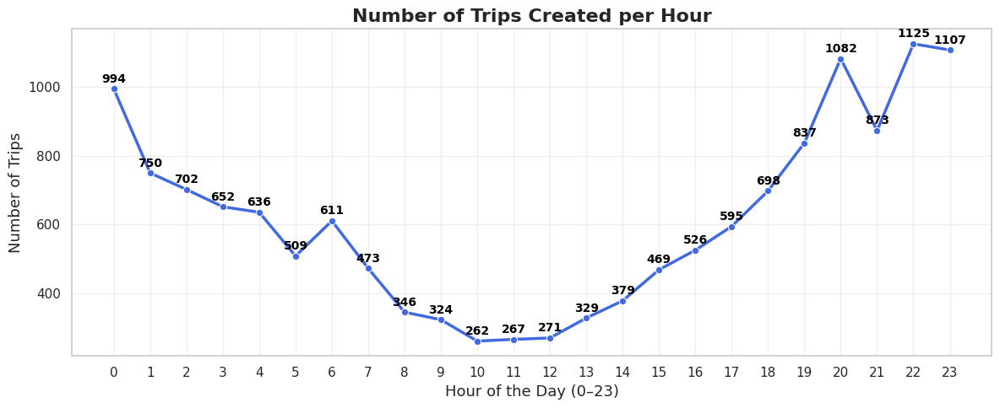

In [55]:
trip_per_hour = df_trip["trip_creation_hour"].value_counts().sort_index()

plt.figure(figsize=(12,5))
sns.lineplot(x=trip_per_hour.index, y=trip_per_hour.values, marker='o', linewidth=2.5, color='royalblue')

for x, y in zip(trip_per_hour.index, trip_per_hour.values):
    plt.text(x, y + max(trip_per_hour.values)*0.01,
             str(int(y)), ha='center', va='bottom', fontsize=10, fontweight='bold', color='black')

plt.title("Number of Trips Created per Hour", fontsize=16, weight='bold')
plt.xlabel("Hour of the Day (0–23)", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.xticks(np.arange(0, 24, 1))
plt.tight_layout()
plt.show()

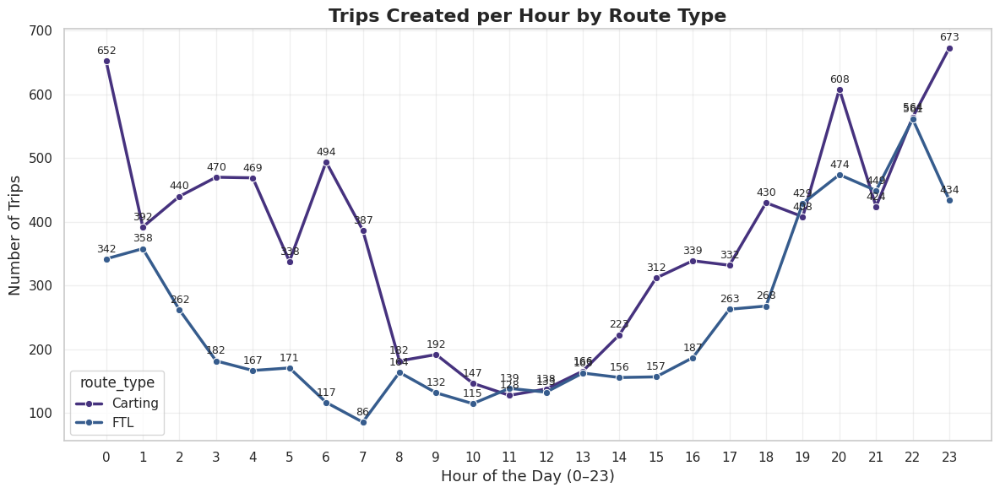

In [56]:
trip_hour_route = (
    df_trip.groupby(["trip_creation_hour", "route_type"],observed=True)
    .size()
    .reset_index(name="trip_count")
)


plt.figure(figsize=(12,6))
sns.lineplot(
    data=trip_hour_route,
    x="trip_creation_hour",
    y="trip_count",
    hue="route_type",
    marker='o',
    linewidth=2.5
)

for route in trip_hour_route["route_type"].unique():
    subset = trip_hour_route[trip_hour_route["route_type"] == route]
    for x, y in zip(subset["trip_creation_hour"], subset["trip_count"]):
        plt.text(x, y + max(trip_hour_route["trip_count"])*0.01,
                 str(int(y)), ha='center', va='bottom', fontsize=9)

plt.title("Trips Created per Hour by Route Type", fontsize=16, weight='bold')
plt.xlabel("Hour of the Day (0–23)", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.xticks(np.arange(0, 24, 1))
plt.tight_layout()
plt.show()


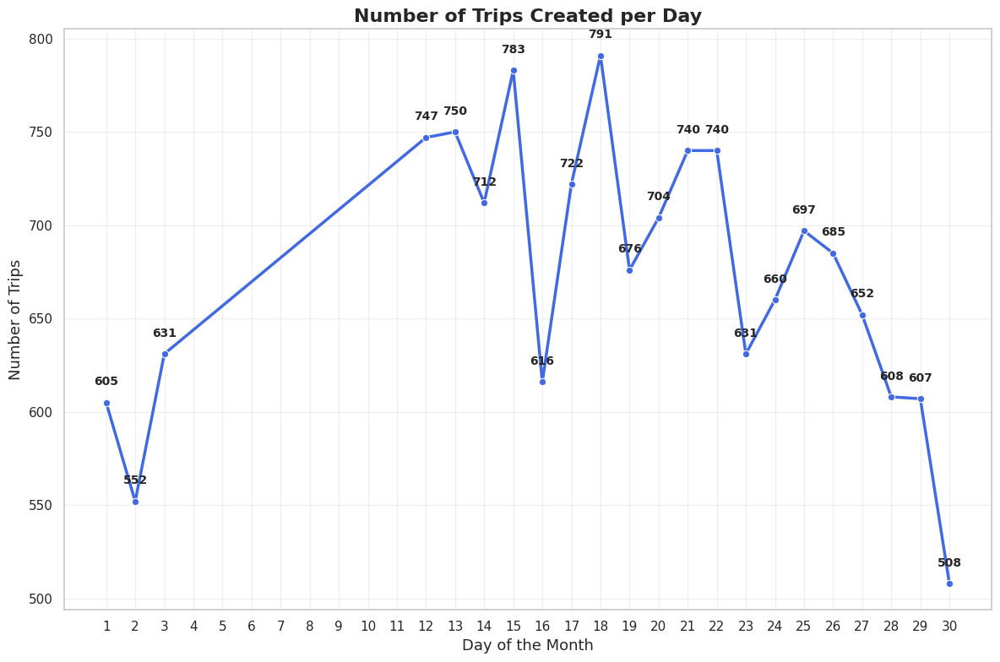

In [57]:
trip_per_day = df_trip["trip_creation_day"].value_counts().sort_index()

plt.figure(figsize=(12,8))
sns.lineplot(x=trip_per_day.index, y=trip_per_day.values, marker='o', linewidth=2.5, color='royalblue')

for x, y in zip(trip_per_day.index, trip_per_day.values):
    plt.text(x, y + max(trip_per_day.values)*0.01, str(int(y)), ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title("Number of Trips Created per Day", fontsize=16, weight='bold')
plt.xlabel("Day of the Month", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.xticks(np.arange(min(trip_per_day.index), max(trip_per_day.index)+1))
plt.tight_layout()
plt.show()


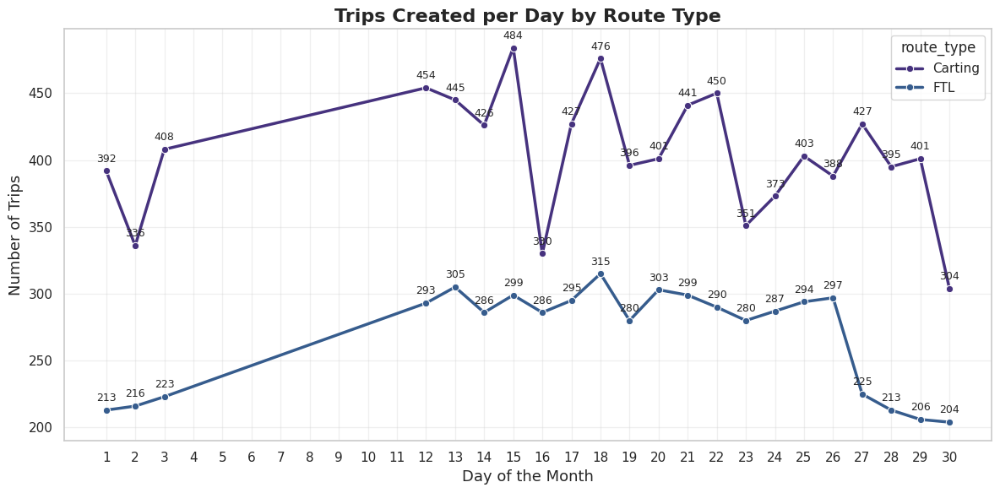

In [58]:
trip_day_route = (
    df_trip.groupby(["trip_creation_day", "route_type"], observed=True)
    .size()
    .reset_index(name="trip_count")
)

plt.figure(figsize=(12,6))
sns.lineplot(
    data=trip_day_route,
    x="trip_creation_day",
    y="trip_count",
    hue="route_type",
    marker='o',
    linewidth=2.5
)

for route in trip_day_route["route_type"].unique():
    subset = trip_day_route[trip_day_route["route_type"] == route]
    for x, y in zip(subset["trip_creation_day"], subset["trip_count"]):
        plt.text(x, y + max(trip_day_route["trip_count"])*0.01,
                 str(int(y)), ha='center', va='bottom', fontsize=9)

plt.title("Trips Created per Day by Route Type", fontsize=16, weight='bold')
plt.xlabel("Day of the Month", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.xticks(np.arange(min(df_trip["trip_creation_day"]), max(df_trip["trip_creation_day"])+1))
plt.tight_layout()
plt.show()


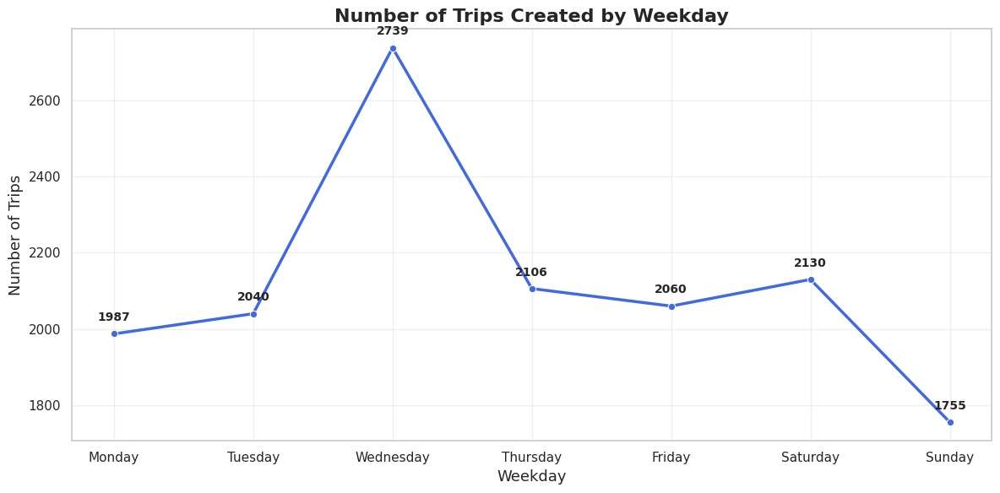

In [59]:

weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

trip_per_weekday = (
    df_trip["trip_creation_day_name"]
    .value_counts()
    .reindex(weekday_order)
    .fillna(0)
)

plt.figure(figsize=(12,6))
sns.lineplot(x=trip_per_weekday.index, y=trip_per_weekday.values, marker='o', linewidth=2.5, color='royalblue')

for x, y in zip(trip_per_weekday.index, trip_per_weekday.values):
    plt.text(x, y + max(trip_per_weekday.values)*0.01, str(int(y)),
             ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title("Number of Trips Created by Weekday", fontsize=16, weight='bold')
plt.xlabel("Weekday", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


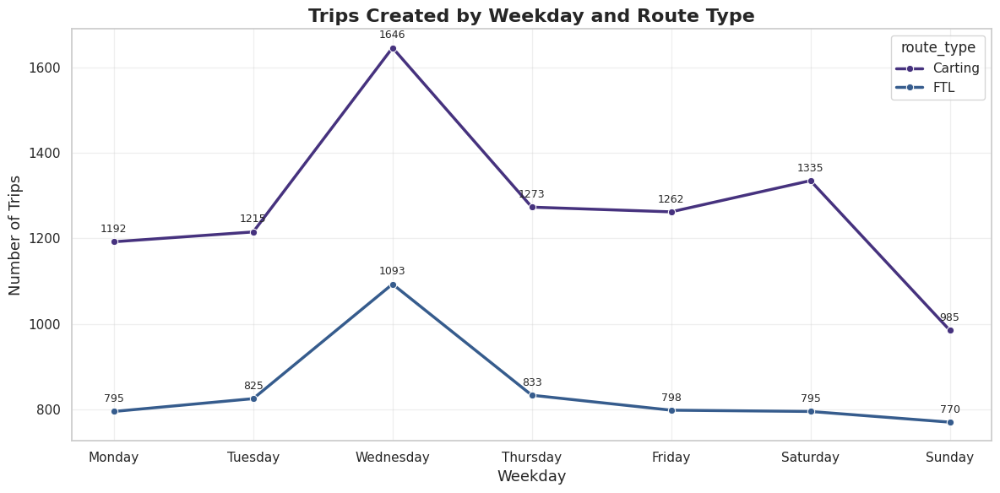

In [60]:
trip_weekday_route = (
    df_trip.groupby(["trip_creation_day_name", "route_type"], observed=True)
    .size()
    .reset_index(name="trip_count")
)

trip_weekday_route["trip_creation_day_name"] = pd.Categorical(
    trip_weekday_route["trip_creation_day_name"],
    categories=weekday_order,
    ordered=True
)

plt.figure(figsize=(12,6))
sns.lineplot(
    data=trip_weekday_route,
    x="trip_creation_day_name",
    y="trip_count",
    hue="route_type",
    marker='o',
    linewidth=2.5
)

for route in trip_weekday_route["route_type"].unique():
    subset = trip_weekday_route[trip_weekday_route["route_type"] == route]
    for x, y in zip(subset["trip_creation_day_name"], subset["trip_count"]):
        plt.text(x, y + max(trip_weekday_route["trip_count"])*0.01,
                 str(int(y)), ha='center', va='bottom', fontsize=9)

plt.title("Trips Created by Weekday and Route Type", fontsize=16, weight='bold')
plt.xlabel("Weekday", fontsize=13)
plt.ylabel("Number of Trips", fontsize=13)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [61]:

print("\nTop 10 Source States:")
print(df_trip.groupby('source_state_name')['trip_uuid'].count().sort_values(ascending=False).head(10))

print("\nTop 10 Destination States:")
print(df_trip.groupby('destination_state_name')['trip_uuid'].count().sort_values(ascending=False).head(10))

print("\nTop 10 Source Cities:")
print(df_trip.groupby('source_city_name')['trip_uuid'].count().sort_values(ascending=False).head(10))

print("\nTop 10 Destination Cities:")
print(df_trip.groupby('destination_city_name')['trip_uuid'].count().sort_values(ascending=False).head(10))


Top 10 Source States:
source_state_name
Maharashtra      2682
Karnataka        2229
Haryana          1684
Tamil Nadu       1085
Delhi             793
Telangana         780
Gujarat           746
Uttar Pradesh     713
West Bengal       677
Punjab            630
Name: trip_uuid, dtype: int64

Top 10 Destination States:
destination_state_name
Maharashtra      2591
Karnataka        2275
Haryana          1667
Tamil Nadu       1072
Telangana         838
Gujarat           746
Uttar Pradesh     728
West Bengal       708
Punjab            693
Delhi             675
Name: trip_uuid, dtype: int64

Top 10 Source Cities:
source_city_name
Gurgaon       1024
Bengaluru     1015
Mumbai         893
Bhiwandi       811
Bangalore      755
Delhi          620
Hyderabad      562
Pune           445
Chandigarh     418
Kolkata        339
Name: trip_uuid, dtype: int64

Top 10 Destination Cities:
destination_city_name
Mumbai        1127
Bengaluru     1056
Gurgaon        869
Bangalore      646
Hyderabad      630
Bhi

In [62]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', 2000)
pd.set_option('display.expand_frame_repr', False)

In [63]:

df_trip['corridor'] = df_trip['source_name'] + "<<------>>" + df_trip['destination_name']

corridor_stats = (
    df_trip.groupby('corridor')
    .agg({
        'trip_uuid': 'count',
        'actual_distance_to_destination': 'mean',
        'osrm_distance': 'mean',
        'start_scan_to_end_scan': 'mean',
        'actual_time': 'mean',
        'osrm_time': 'mean',
    })
    .rename(columns={'trip_uuid': 'trip_count'})
    .sort_values('trip_count', ascending=False)
    .head(15)
)

print("\nTop 15 Busiest Trip Corridors with Avg Distance & Time:")
print(corridor_stats.round(2))


Top 15 Busiest Trip Corridors with Avg Distance & Time:
                                                                              trip_count  actual_distance_to_destination  osrm_distance  start_scan_to_end_scan  actual_time  osrm_time
corridor                                                                                                                                                                               
Chandigarh_Mehmdpur_H (Punjab)<<------>>Chandigarh_Mehmdpur_H (Punjab)               175                          229.28         282.75                  831.90       518.78     234.30
Bangalore_Nelmngla_H (Karnataka)<<------>>Bengaluru_KGAirprt_HB (Karnataka)          151                           28.03          38.08                  183.03        87.87      48.05
Muzaffrpur_Bbganj_I (Bihar)<<------>>Muzaffrpur_Bbganj_I (Bihar)                     130                          183.91         230.75                 1025.70       723.33     173.73
Bengaluru_Bomsndra_HB (

In [64]:

df_segment['corridor'] = df_segment['source_name'] + "<<------>>" + df_segment['destination_name']

corridor_stats = (
    df_segment.groupby('corridor')
    .agg({
        'segment_key': 'count',
        'actual_distance_to_destination': 'mean',
        'osrm_distance': 'mean',
        'start_scan_to_end_scan': 'mean',
        'actual_time': 'mean',
        'osrm_time': 'mean',
    })
    .rename(columns={'segment_key': 'trip_count'})
    .sort_values('trip_count', ascending=False)
    .head(15)
)

print("\nTop 15 Busiest Segment Corridors with Avg Distance & Time:")
print(corridor_stats.round(2))


Top 15 Busiest Segment Corridors with Avg Distance & Time:
                                                                              trip_count  actual_distance_to_destination  osrm_distance  start_scan_to_end_scan  actual_time  osrm_time
corridor                                                                                                                                                                               
Bangalore_Nelmngla_H (Karnataka)<<------>>Bengaluru_KGAirprt_HB (Karnataka)          151                           28.03          38.08                  183.03        87.87      48.05
Bangalore_Nelmngla_H (Karnataka)<<------>>Bengaluru_Bomsndra_HB (Karnataka)          127                           39.49          50.57                  278.90        91.85      50.54
Bengaluru_Bomsndra_HB (Karnataka)<<------>>Bengaluru_KGAirprt_HB (Karnataka)         121                           41.73          53.13                  198.31       114.66      56.74
Bengaluru_KGAirprt_H

In [65]:

df_trip['delay_ratio'] = df_trip['actual_time'] / df_trip['osrm_time']
df_trip['distance_efficiency'] = df_trip['actual_distance_to_destination'] / df_trip['osrm_distance']

print("\nRoute Efficiency Summary:")
print(df_trip[['delay_ratio', 'distance_efficiency']].describe())

print("\nAvg Delay Ratio by Route Type:")
print(df_trip.groupby('route_type', observed=True)['delay_ratio'].mean())

print("\nAvg Delay Ratio by Source State:")
print(df_trip.groupby('source_state_name')['delay_ratio'].mean().sort_values(ascending=False).head(10))



Route Efficiency Summary:
        delay_ratio  distance_efficiency
count  14817.000000         14817.000000
mean       2.664211             0.788141
std        2.363017             0.098158
min        0.485714             0.146464
25%        1.750000             0.739368
50%        2.101227             0.803737
75%        2.765625             0.850866
max       77.387097             1.349766

Avg Delay Ratio by Route Type:
route_type
Carting    2.899370
FTL        2.309701
Name: delay_ratio, dtype: float64

Avg Delay Ratio by Source State:
source_state_name
Arunachal Pradesh         9.489732
Nagaland                  6.941779
Mizoram                   6.226979
Himachal Pradesh          3.954494
Uttar Pradesh             3.774391
Bihar                     3.552429
Dadra and Nagar Haveli    3.552381
Jammu & Kashmir           3.528734
West Bengal               3.510932
Assam                     3.307023
Name: delay_ratio, dtype: float64


In [66]:
hourly_trips = df_trip.groupby('trip_creation_hour')['trip_uuid'].count()
weekday_trips = df_trip.groupby('trip_creation_day_name')['trip_uuid'].count()
weekly_trips = df_trip.groupby('trip_creation_week')['trip_uuid'].count()

print("\nTrip Distribution by Hour of Day:")
print(hourly_trips)
print("\nTrip Distribution by Day of Week:")
print(weekday_trips)
print("\nTrip Distribution by Week Number:")
print(weekly_trips)


Trip Distribution by Hour of Day:
trip_creation_hour
0      994
1      750
2      702
3      652
4      636
5      509
6      611
7      473
8      346
9      324
10     262
11     267
12     271
13     329
14     379
15     469
16     526
17     595
18     698
19     837
20    1082
21     873
22    1125
23    1107
Name: trip_uuid, dtype: int64

Trip Distribution by Day of Week:
trip_creation_day_name
Friday       2060
Monday       1987
Saturday     2130
Sunday       1755
Thursday     2106
Tuesday      2040
Wednesday    2739
Name: trip_uuid, dtype: int64

Trip Distribution by Week Number:
trip_creation_week
37    3608
38    5004
39    4417
40    1788
Name: trip_uuid, dtype: int64


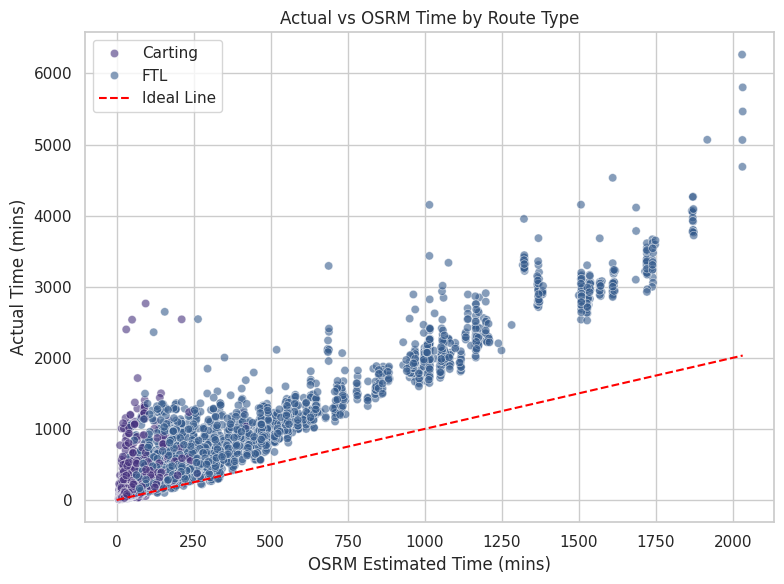

In [67]:

plt.figure(figsize=(8,6))
sns.scatterplot(x='osrm_time', y='actual_time', data=df_trip, hue='route_type', alpha=0.6)
plt.plot(
    [0, df_trip['osrm_time'].max()],
    [0, df_trip['osrm_time'].max()],
    'r--',
    label="Ideal Line"
)
plt.title("Actual vs OSRM Time by Route Type")
plt.xlabel("OSRM Estimated Time (mins)")
plt.ylabel("Actual Time (mins)")
plt.legend()
plt.tight_layout()
plt.show()

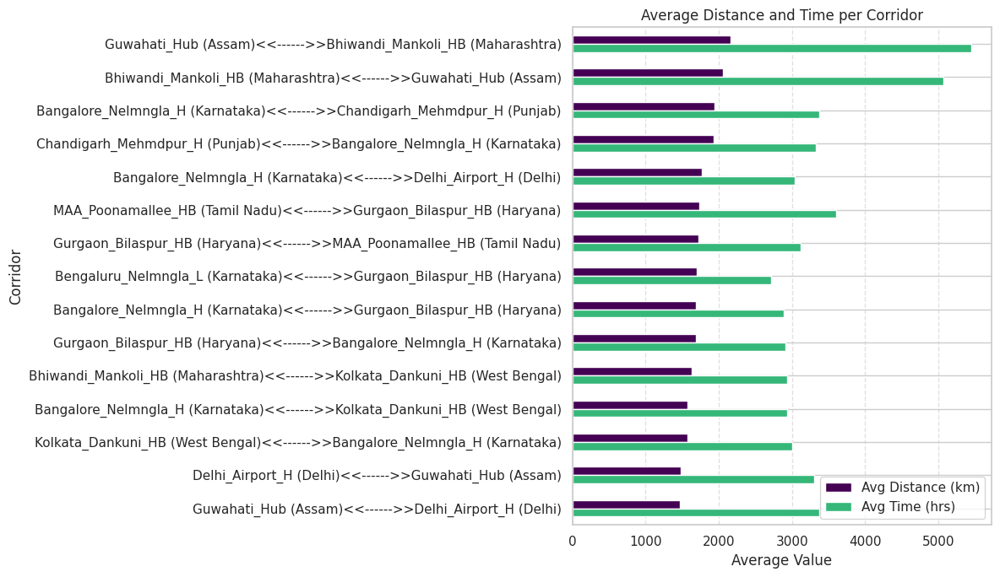

In [68]:

corridor_summary = (
    df_trip.groupby('corridor')[['actual_distance_to_destination', 'actual_time']]
    .mean()
    .sort_values('actual_distance_to_destination', ascending=False)
    .head(15)
    .reset_index()
)

ax = corridor_summary.plot(
    y=['actual_distance_to_destination', 'actual_time'],
    x='corridor',
    kind='barh',
    figsize=(12, 7),
    title="Average Distance and Time per Corridor",
    color=['#440154', '#35b779']
)


ax.set_xlabel("Average Value")
ax.set_ylabel("Corridor")
ax.invert_yaxis()
ax.legend(["Avg Distance (km)", "Avg Time (hrs)"], loc='best')
ax.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


In [69]:
# Delay ratio and efficiency per route type
trip_efficiency = (
    df_trip.groupby('route_type', observed=True)[['delay_ratio', 'distance_efficiency']]
    .mean()
    .sort_values('delay_ratio', ascending=False)
)

print("Route Type Performance Summary:")
print(trip_efficiency.round(3))

# Delay ratio per state pair (corridor)
state_delay = (
    df_trip.groupby('corridor', observed=True)['delay_ratio']
    .mean()
    .sort_values(ascending=False)
    .head(15)
)
print("\nCorridors with Highest Avg Delay Ratio:")
print(state_delay)


Route Type Performance Summary:
            delay_ratio  distance_efficiency
route_type                                  
Carting           2.899                0.777
FTL               2.310                0.804

Corridors with Highest Avg Delay Ratio:
corridor
Gonda_KotwaliN_D (Uttar Pradesh)<<------>>Balrampur_PBRDDPP_D (Uttar Pradesh)           77.387097
Surat_Varachha_DC (Gujarat)<<------>>Surat_Central_I_4 (Gujarat)                        70.000000
Gonda_KotwaliN_D (Uttar Pradesh)<<------>>Tulsipur_Central_DPP_1 (Uttar Pradesh)        50.720000
Allahabad_Central_D_3 (Uttar Pradesh)<<------>>Allahabad_Central_H_1 (Uttar Pradesh)    35.750000
Mariani_Mainroad_D (Assam)<<------>>Jorhat_RicMilRd_D (Assam)                           32.937500
Jairampur_Mdiclcly_D (Arunachal Pradesh)<<------>>Margherita_CivilHPL_D (Assam)         28.903226
Malvan_BllvMarg_D (Maharashtra)<<------>>Sawantwadi_LaxmiNgr_D (Maharashtra)            26.902273
Guna_HnumnDPP_D (Madhya Pradesh)<<------>>Guna_Ragho

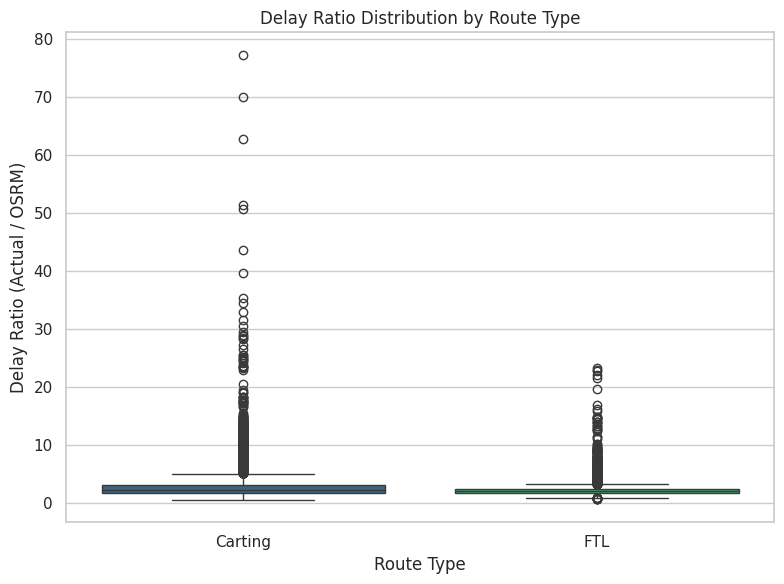

In [70]:
plt.figure(figsize=(8,6))
sns.boxplot(data=df_trip, x='route_type',hue='route_type', y='delay_ratio', palette='viridis')
plt.title("Delay Ratio Distribution by Route Type")
plt.xlabel("Route Type")
plt.ylabel("Delay Ratio (Actual / OSRM)")
plt.tight_layout()
plt.show()

Insights: "Carting" route type consistently exceeds OSRM estimates.

In [71]:
# Average delay ratio by hour of trip creation
hourly_delay = df_trip.groupby('trip_creation_hour')['delay_ratio'].mean()
print("\nAvg Delay Ratio by Hour:")
print(hourly_delay)

# Weekly pattern
weekday_delay = df_trip.groupby('trip_creation_day_name')['delay_ratio'].mean()
print("\nAvg Delay Ratio by Day of Week:")
print(weekday_delay)



Avg Delay Ratio by Hour:
trip_creation_hour
0     2.865241
1     2.665397
2     2.718464
3     3.046233
4     2.902999
5     3.152360
6     3.326524
7     2.681654
8     2.578075
9     3.032136
10    3.099429
11    3.359934
12    2.892690
13    2.863525
14    2.840244
15    2.542214
16    2.494992
17    2.335581
18    2.385985
19    2.154750
20    2.252197
21    2.298247
22    2.533514
23    2.655323
Name: delay_ratio, dtype: float64

Avg Delay Ratio by Day of Week:
trip_creation_day_name
Friday       2.683448
Monday       2.688491
Saturday     2.749586
Sunday       2.514409
Thursday     2.651021
Tuesday      2.629951
Wednesday    2.697378
Name: delay_ratio, dtype: float64


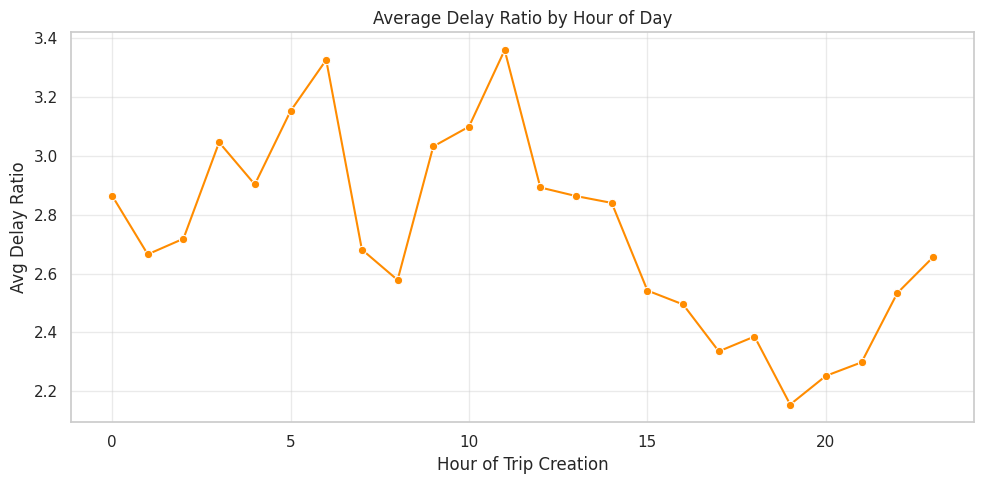

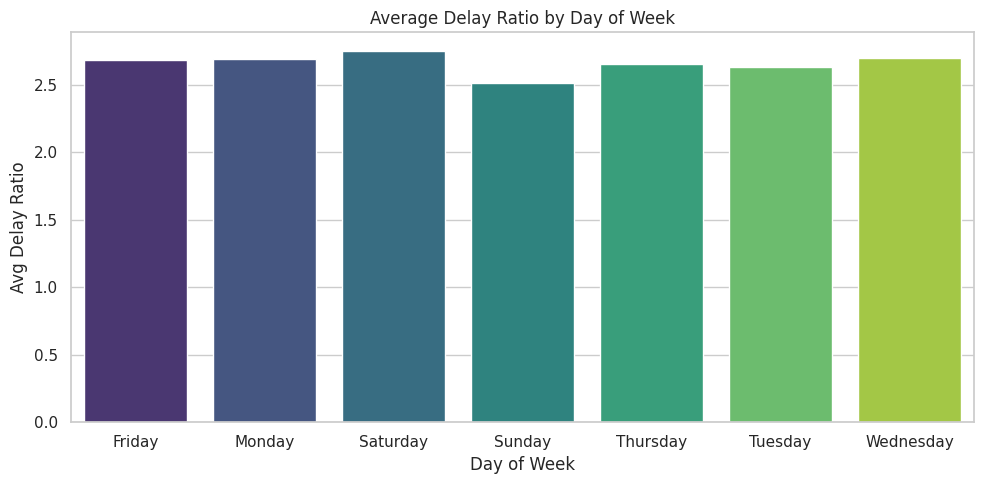

In [72]:
plt.figure(figsize=(10,5))
sns.lineplot(x=hourly_delay.index, y=hourly_delay.values, marker='o', color='darkorange')
plt.title("Average Delay Ratio by Hour of Day")
plt.xlabel("Hour of Trip Creation")
plt.ylabel("Avg Delay Ratio")
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
sns.barplot(x=weekday_delay.index, hue=weekday_delay.index, y=weekday_delay.values, palette='viridis')
plt.title("Average Delay Ratio by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Avg Delay Ratio")
plt.tight_layout()
plt.show()


Insights: Time windows 4AM to 6AM and 9AM to 11AM cause higher operational delays.

In [73]:
# Corridor performance with trip count and delay metrics
corridor_performance = (
    df_trip.groupby('corridor')
    .agg({
        'trip_uuid': 'count',
        'actual_distance_to_destination': 'mean',
        'osrm_distance' : 'mean',
        'actual_time': 'mean',
        'osrm_time' : 'mean',
        'delay_ratio': 'mean',

    })
    .rename(columns={'trip_uuid': 'trip_count'})
    .sort_values('delay_ratio', ascending=False)
)

print("\n Corridor Reliability Summary (Top 10 by Delay):")
print(corridor_performance.head(10).round(2))



 Corridor Reliability Summary (Top 10 by Delay):
                                                                                      trip_count  actual_distance_to_destination  osrm_distance  actual_time  osrm_time  delay_ratio
corridor                                                                                                                                                                            
Gonda_KotwaliN_D (Uttar Pradesh)<<------>>Balrampur_PBRDDPP_D (Uttar Pradesh)                  1                           36.05          42.00      2399.00       31.0        77.39
Surat_Varachha_DC (Gujarat)<<------>>Surat_Central_I_4 (Gujarat)                               1                            9.23          11.19       770.00       11.0        70.00
Gonda_KotwaliN_D (Uttar Pradesh)<<------>>Tulsipur_Central_DPP_1 (Uttar Pradesh)               1                           61.24          70.69      2536.00       50.0        50.72
Allahabad_Central_D_3 (Uttar Pradesh)<<------

Insights: These are chronically delayed corridors. We should take steps for optimization.

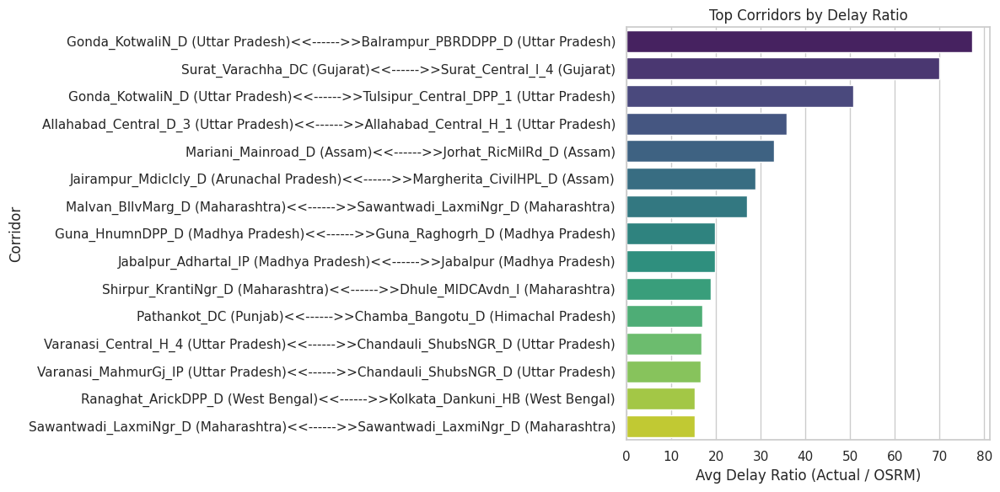

In [74]:
top_corridors = corridor_performance.head(15).reset_index()
plt.figure(figsize=(12,6))
sns.barplot(y='corridor',hue='corridor', x='delay_ratio', data=top_corridors, palette='viridis')
plt.title("Top Corridors by Delay Ratio")
plt.xlabel("Avg Delay Ratio (Actual / OSRM)")
plt.ylabel("Corridor")
plt.tight_layout()
plt.show()

In [75]:
# Compare time and distance performance
ftl_vs_carting = (
    df_trip.groupby('route_type', observed=True)
    .agg({
        'actual_distance_to_destination': 'mean',
        'actual_time': 'mean',
        'delay_ratio': 'mean',
        'trip_uuid': 'count'
    })
    .rename(columns={'trip_uuid': 'trip_count'})
)
print("\nFTL vs Carting Route Comparison:")
print(ftl_vs_carting.round(2))



FTL vs Carting Route Comparison:
            actual_distance_to_destination  actual_time  delay_ratio  trip_count
route_type                                                                      
Carting                              40.45        125.8         2.90        8908
FTL                                 351.97        705.9         2.31        5909


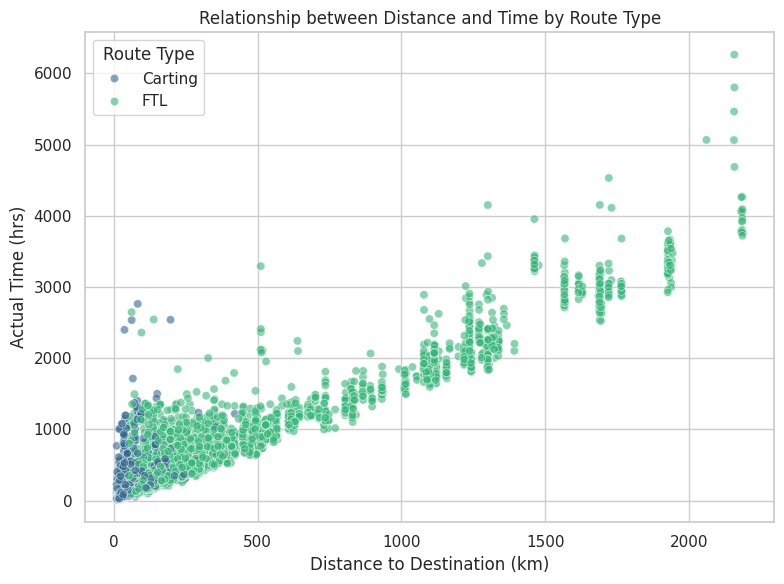

In [76]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_trip,
    x='actual_distance_to_destination',
    y='actual_time',
    hue='route_type',
    alpha=0.6,
    palette='viridis',
)
plt.title("Relationship between Distance and Time by Route Type")
plt.xlabel("Distance to Destination (km)")
plt.ylabel("Actual Time (hrs)")
plt.legend(title='Route Type')
plt.tight_layout()
plt.show()


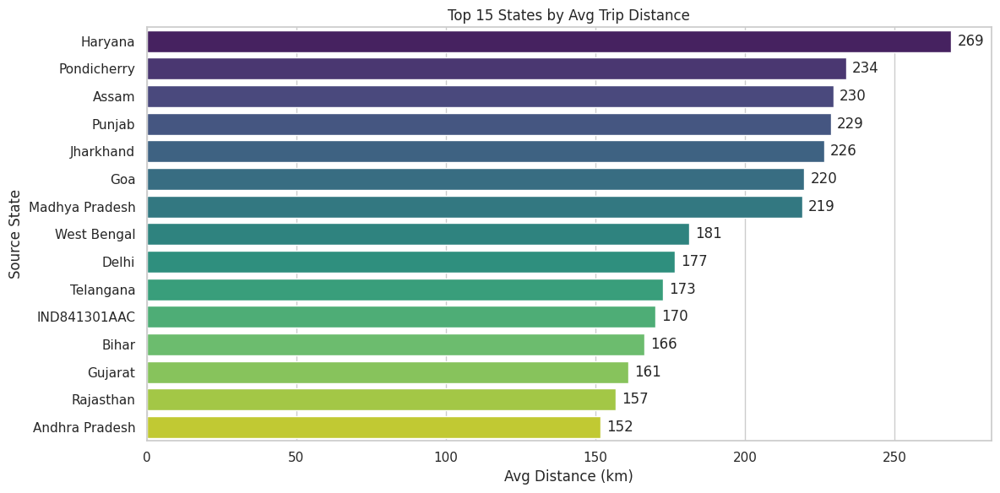

In [77]:
state_summary = (
    df_trip.groupby('source_state_name')[['actual_distance_to_destination','actual_time']]
    .mean()
    .sort_values('actual_distance_to_destination', ascending=False)
    .head(15)
    .reset_index()
)

fig, ax1 = plt.subplots(figsize=(12,6))
sns.barplot(data=state_summary, y='source_state_name',hue= 'source_state_name',x='actual_distance_to_destination', ax=ax1, palette='viridis')
ax1.set_xlabel("Avg Distance (km)")
ax1.set_ylabel("Source State")
ax1.set_title("Top 15 States by Avg Trip Distance")

for i, v in enumerate(state_summary['actual_distance_to_destination']):
    ax1.text(v + 2, i, f"{v:.0f}", va='center')

plt.tight_layout()
plt.show()


Insights: source states Haryana, Pondicherry, Assam, Punjab & Jharkhand involve long-distance trips — useful for fleet and cost optimization.

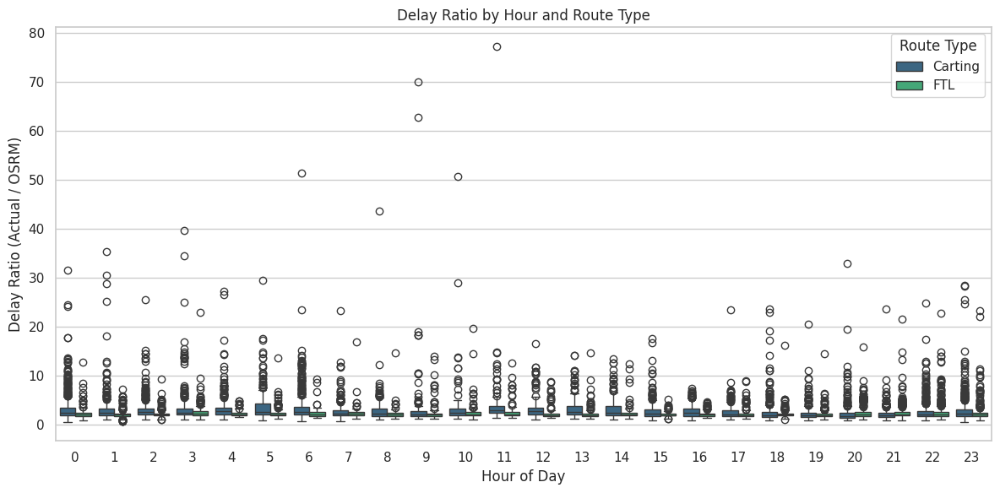

In [78]:
plt.figure(figsize=(12,6))
sns.boxplot(x='trip_creation_hour', y='delay_ratio', data=df_trip, hue='route_type', palette='viridis')
plt.title("Delay Ratio by Hour and Route Type")
plt.xlabel("Hour of Day")
plt.ylabel("Delay Ratio (Actual / OSRM)")
plt.legend(title="Route Type")
plt.tight_layout()
plt.show()


Insights : Carting Generally have higher delay

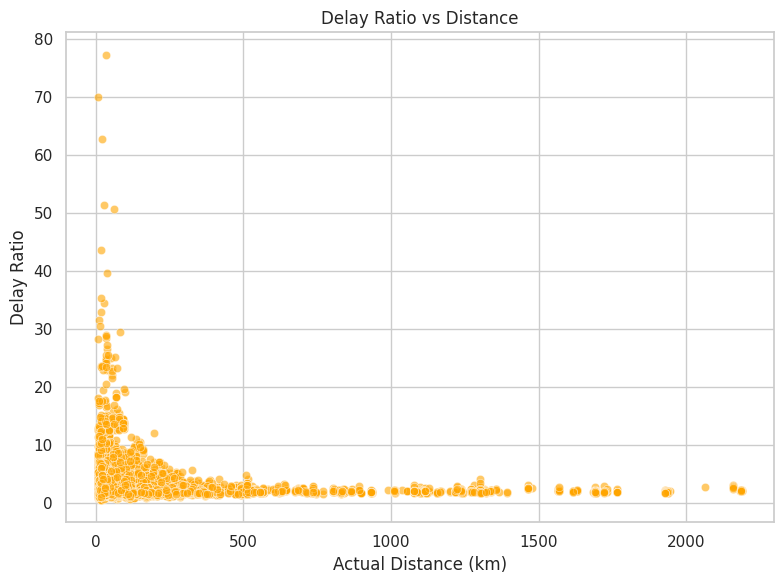

In [79]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='actual_distance_to_destination', y='delay_ratio', data=df_trip, alpha=0.6, color='orange')
plt.title("Delay Ratio vs Distance")
plt.xlabel("Actual Distance (km)")
plt.ylabel("Delay Ratio")
plt.tight_layout()
plt.show()


Insights: Low Distance orders have higher delay maybe because of lots of orders and traffic issue.

In [80]:
kpi_summary = {
    "Total Trips": len(df_trip),
    "Unique Corridors": df_trip['corridor'].nunique(),
    "Avg Delay Ratio": df_trip['delay_ratio'].mean(),
    "Avg Distance (km)": df_trip['actual_distance_to_destination'].mean(),
    "Avg Time (hrs)": df_trip['actual_time'].mean(),
    "Top Source State": df_trip['source_state_name'].value_counts().idxmax(),
    "Top Destination State": df_trip['destination_state_name'].value_counts().idxmax(),
}
print("\nKey Performance Indicators:")
for k, v in kpi_summary.items():
    print(f"{k:<25}: {v:.2f}" if isinstance(v, (float, int)) else f"{k:<25}: {v}")



Key Performance Indicators:
Total Trips              : 14817.00
Unique Corridors         : 2049.00
Avg Delay Ratio          : 2.66
Avg Distance (km)        : 164.68
Avg Time (hrs)           : 357.14
Top Source State         : Maharashtra
Top Destination State    : Maharashtra


#Outlier Analysis

In [81]:
columns_plot = [
    'start_scan_to_end_scan',
    'actual_distance_to_destination',
    'actual_time',
    'osrm_time',
    'segment_actual_time_sum',
    'segment_osrm_time_sum',
    'segment_osrm_distance_sum',
    'od_time_diff_hour'
]

Statistics for start_scan_to_end_scan:
  Mean   : 961.26
  Median : 449.00
  Std Dev: 1037.01
  Min    : 20.00
  Max    : 7898.00


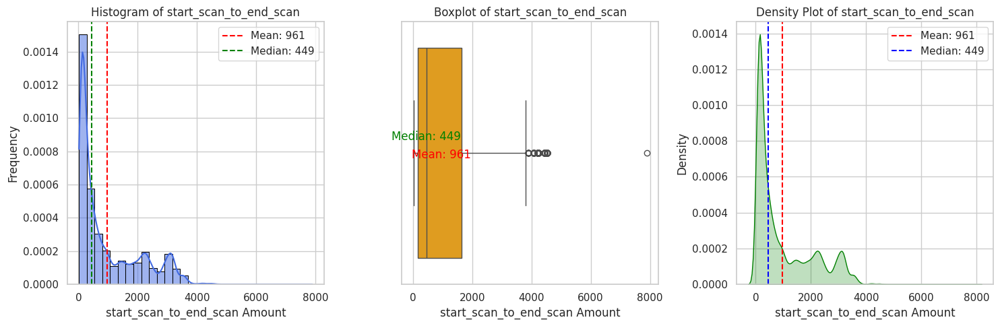

Statistics for actual_distance_to_destination:
  Mean   : 234.07
  Median : 66.13
  Std Dev: 344.99
  Min    : 9.00
  Max    : 1927.45


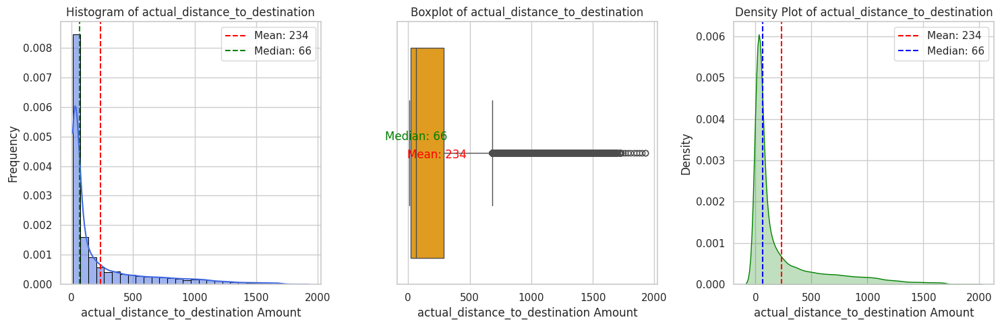

Statistics for actual_time:
  Mean   : 416.93
  Median : 132.00
  Std Dev: 598.10
  Min    : 9.00
  Max    : 4532.00


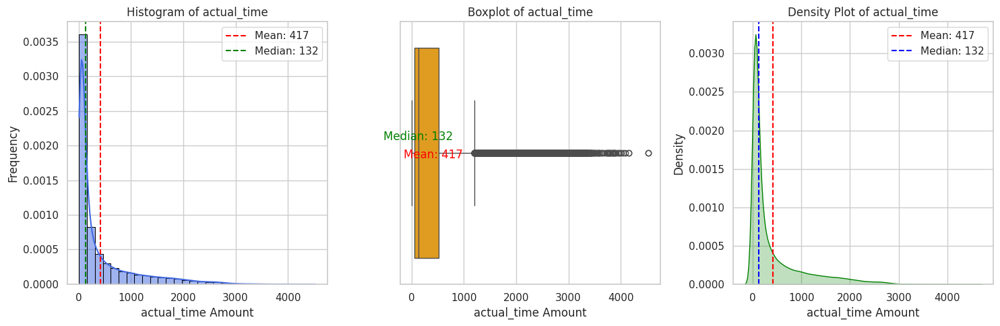

Statistics for osrm_time:
  Mean   : 213.87
  Median : 64.00
  Std Dev: 308.01
  Min    : 6.00
  Max    : 1686.00


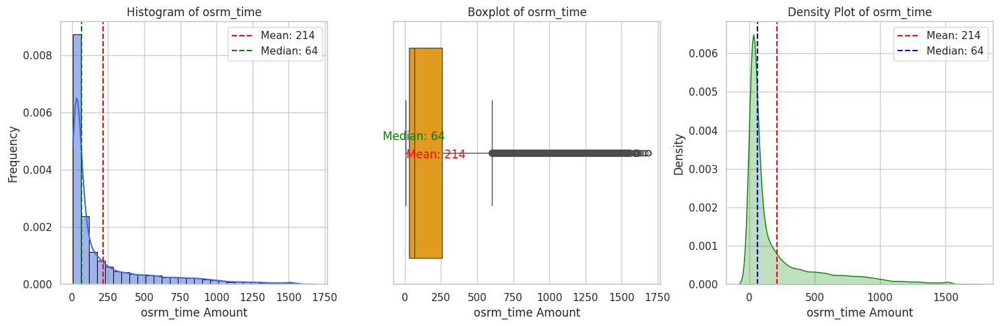

Statistics for segment_actual_time_sum:
  Mean   : 412.78
  Median : 130.00
  Std Dev: 592.00
  Min    : 9.00
  Max    : 4504.00


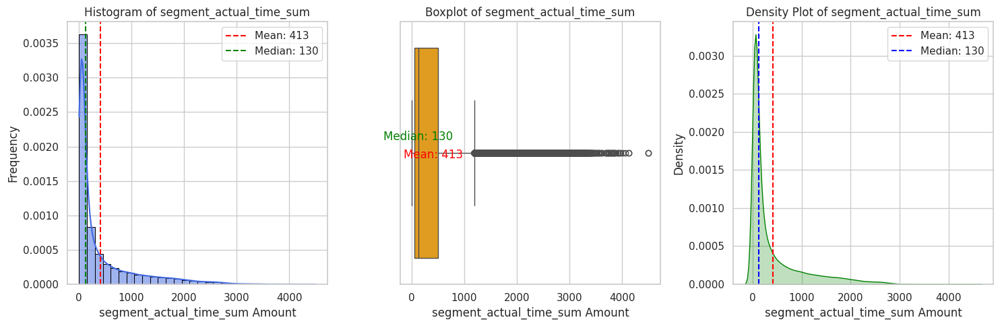

Statistics for segment_osrm_time_sum:
  Mean   : 242.70
  Median : 69.00
  Std Dev: 357.57
  Min    : 6.00
  Max    : 1938.00


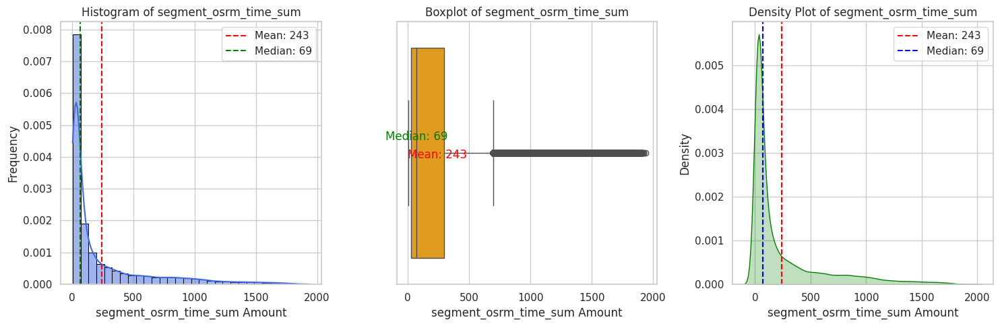

Statistics for segment_osrm_distance_sum:
  Mean   : 316.18
  Median : 81.76
  Std Dev: 476.32
  Min    : 9.01
  Max    : 2640.92


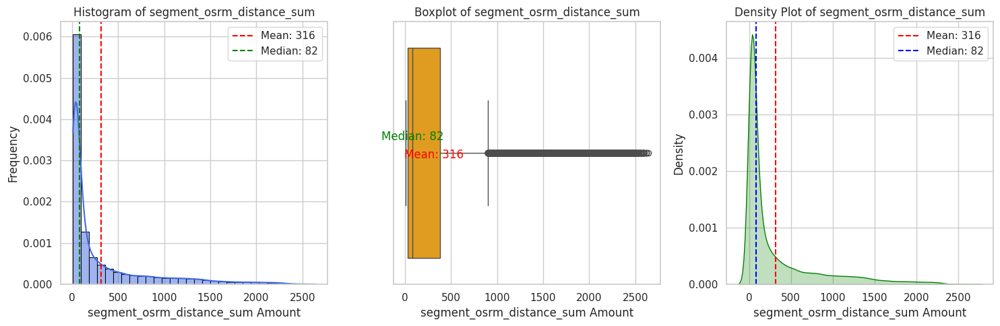

Statistics for od_time_diff_hour:
  Mean   : 16.03
  Median : 7.49
  Std Dev: 17.28
  Min    : 0.35
  Max    : 131.64


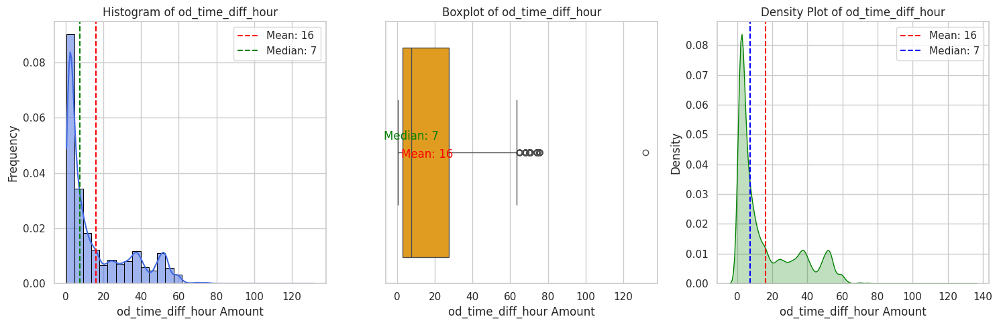

In [82]:
numerical_columns_distribution_with_stats(df[columns_plot])

Statistics for start_scan_to_end_scan:
  Mean   : 298.27
  Median : 152.00
  Std Dev: 440.56
  Min    : 20.00
  Max    : 7898.00


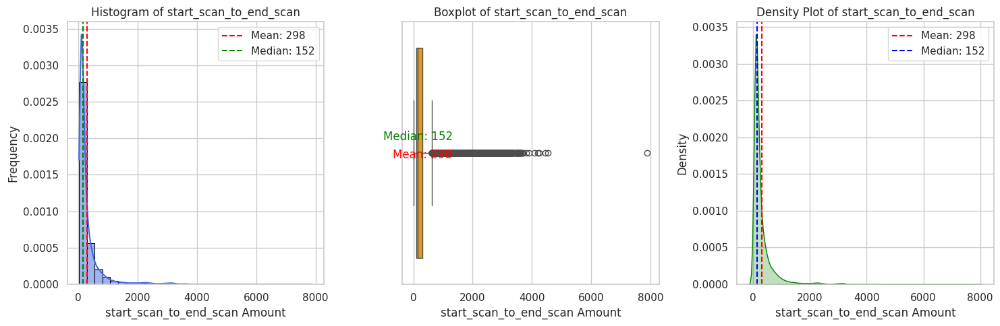

Statistics for actual_distance_to_destination:
  Mean   : 92.54
  Median : 35.24
  Std Dev: 209.48
  Min    : 9.00
  Max    : 1927.45


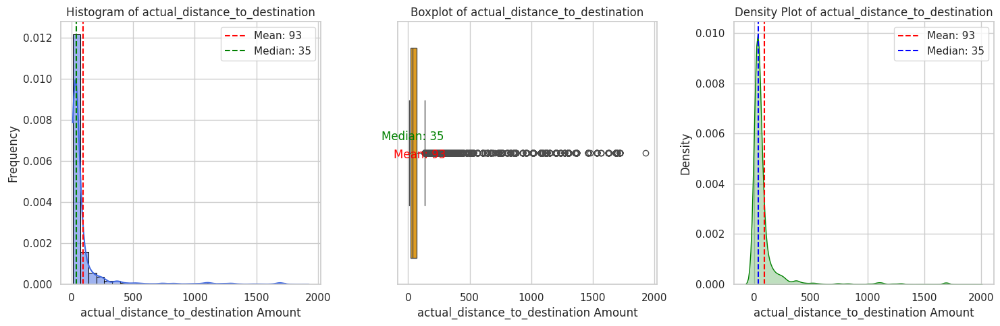

Statistics for actual_time:
  Mean   : 200.69
  Median : 84.00
  Std Dev: 384.85
  Min    : 9.00
  Max    : 4532.00


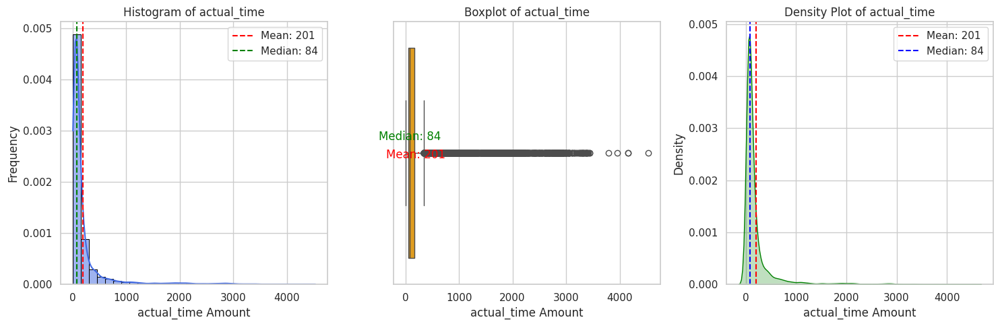

Statistics for osrm_time:
  Mean   : 90.69
  Median : 39.00
  Std Dev: 185.08
  Min    : 6.00
  Max    : 1686.00


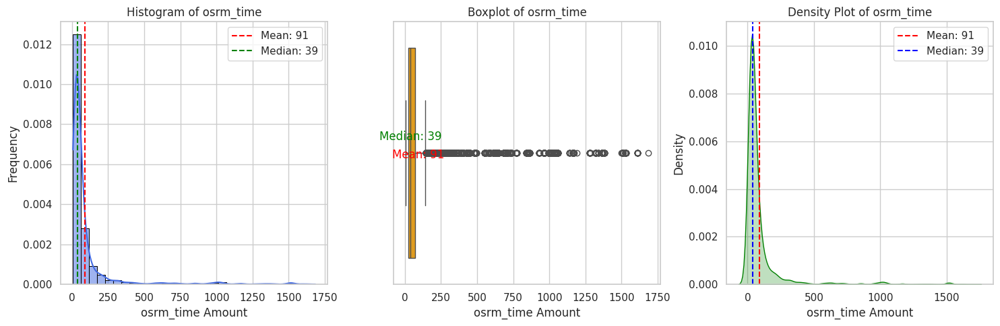

Statistics for segment_actual_time_sum:
  Mean   : 198.86
  Median : 83.00
  Std Dev: 381.28
  Min    : 9.00
  Max    : 4504.00


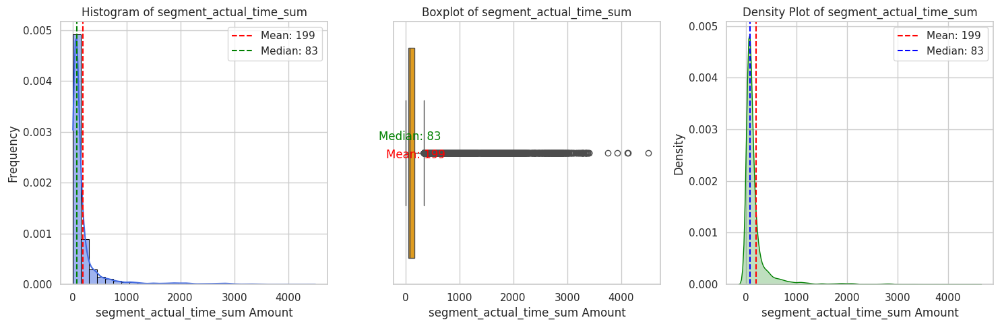

Statistics for segment_osrm_time_sum:
  Mean   : 101.68
  Median : 42.00
  Std Dev: 215.65
  Min    : 6.00
  Max    : 1938.00


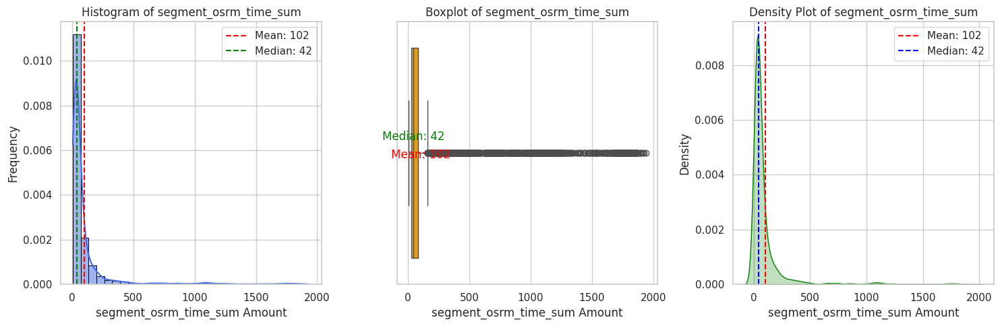

Statistics for segment_osrm_distance_sum:
  Mean   : 125.42
  Median : 45.94
  Std Dev: 285.93
  Min    : 9.07
  Max    : 2640.92


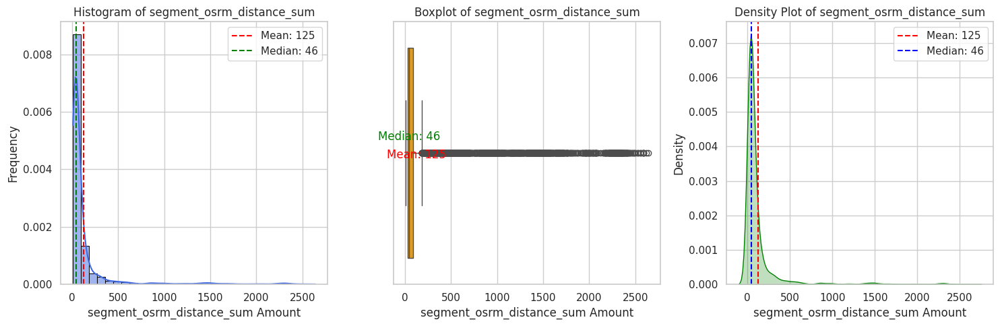

Statistics for od_time_diff_hour:
  Mean   : 4.98
  Median : 2.54
  Std Dev: 7.34
  Min    : 0.35
  Max    : 131.64


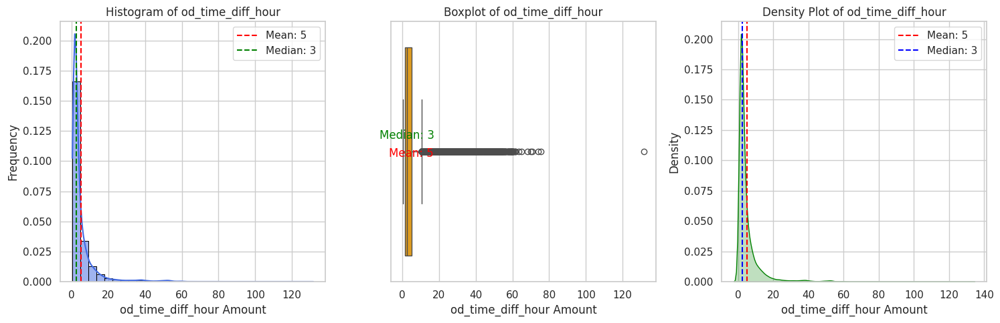

In [83]:
numerical_columns_distribution_with_stats(df_segment[columns_plot])

Statistics for start_scan_to_end_scan:
  Mean   : 530.80
  Median : 280.00
  Std Dev: 658.68
  Min    : 23.00
  Max    : 7898.00


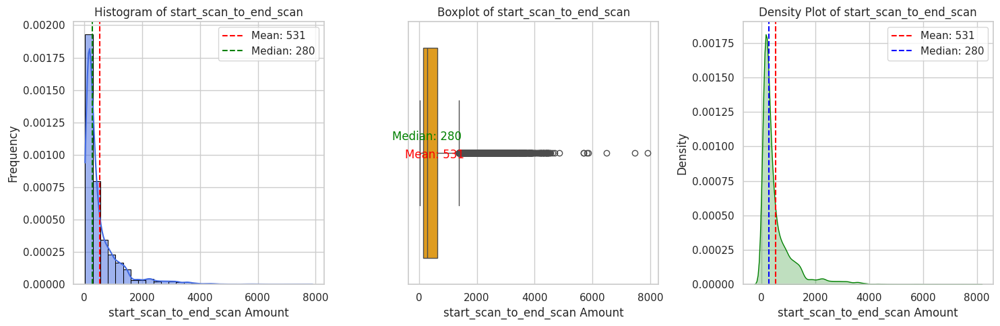

Statistics for actual_distance_to_destination:
  Mean   : 164.68
  Median : 48.50
  Std Dev: 305.56
  Min    : 9.00
  Max    : 2187.48


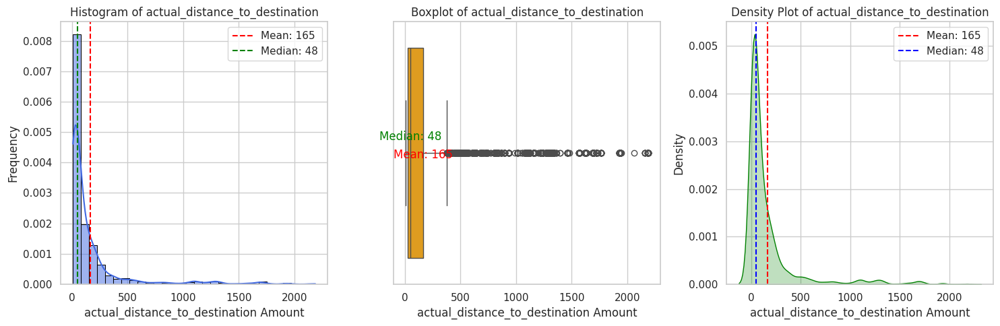

Statistics for actual_time:
  Mean   : 357.14
  Median : 149.00
  Std Dev: 561.40
  Min    : 9.00
  Max    : 6265.00


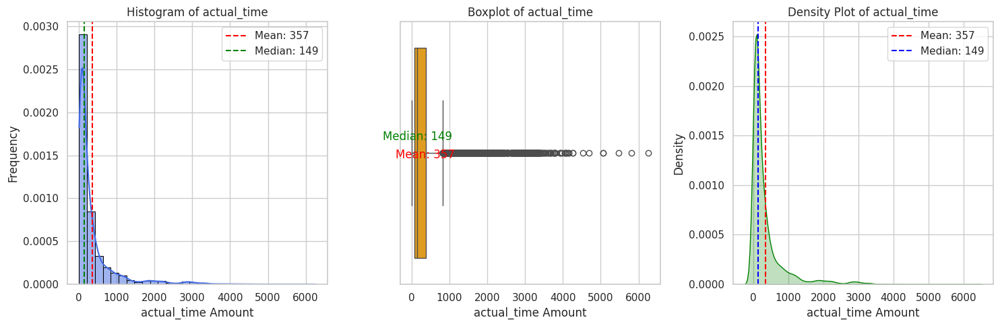

Statistics for osrm_time:
  Mean   : 161.38
  Median : 60.00
  Std Dev: 271.36
  Min    : 6.00
  Max    : 2032.00


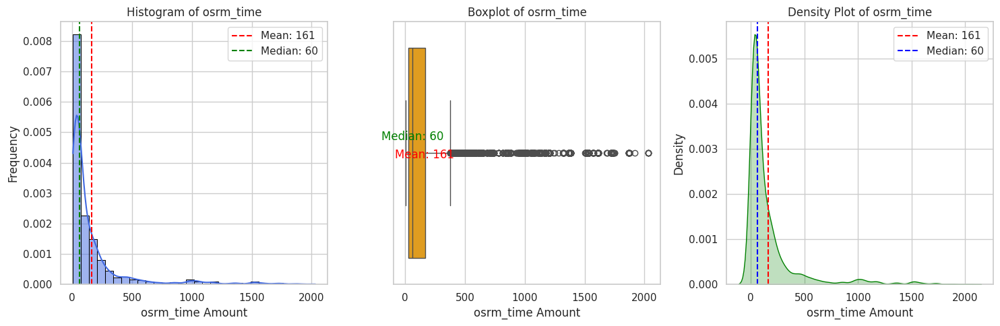

Statistics for segment_actual_time_sum:
  Mean   : 353.89
  Median : 147.00
  Std Dev: 556.25
  Min    : 9.00
  Max    : 6230.00


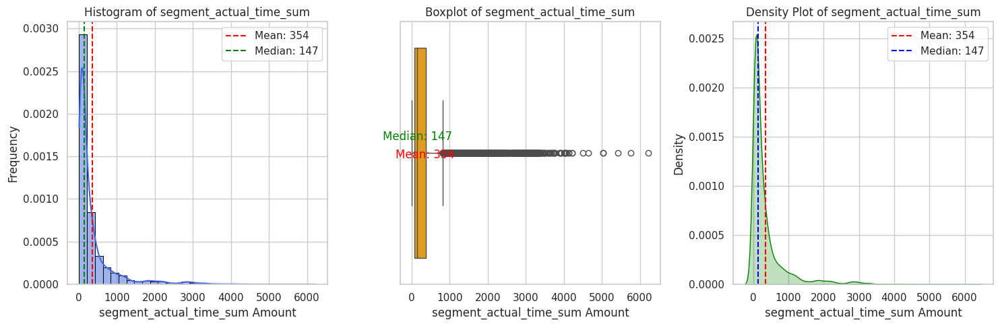

Statistics for segment_osrm_time_sum:
  Mean   : 180.95
  Median : 65.00
  Std Dev: 314.54
  Min    : 6.00
  Max    : 2564.00


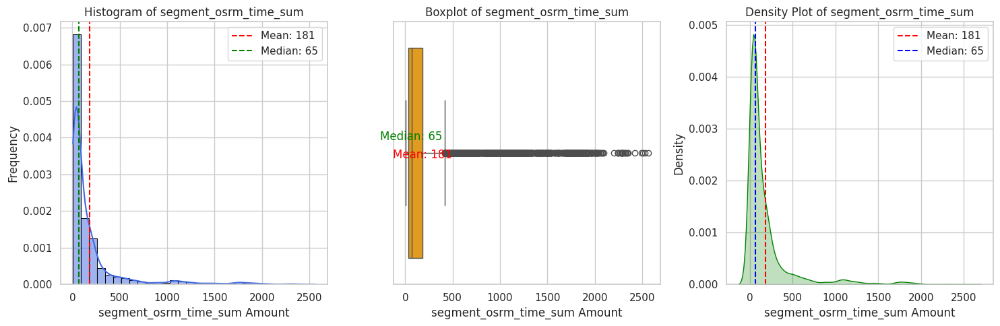

Statistics for segment_osrm_distance_sum:
  Mean   : 223.20
  Median : 70.15
  Std Dev: 416.63
  Min    : 9.07
  Max    : 3523.63


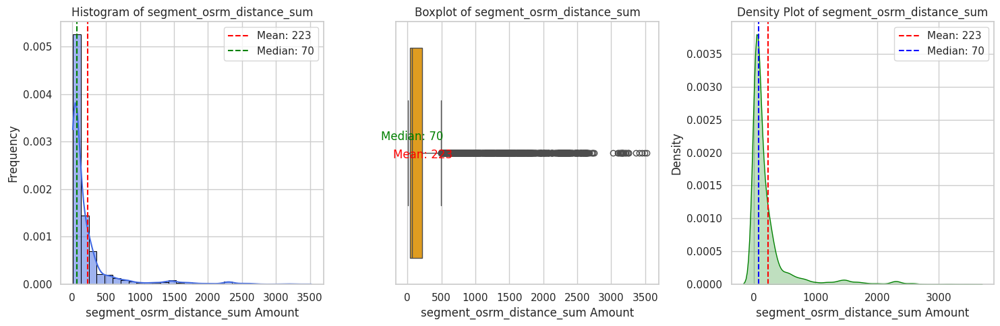

Statistics for od_time_diff_hour:
  Mean   : 8.86
  Median : 4.68
  Std Dev: 10.98
  Min    : 0.39
  Max    : 131.64


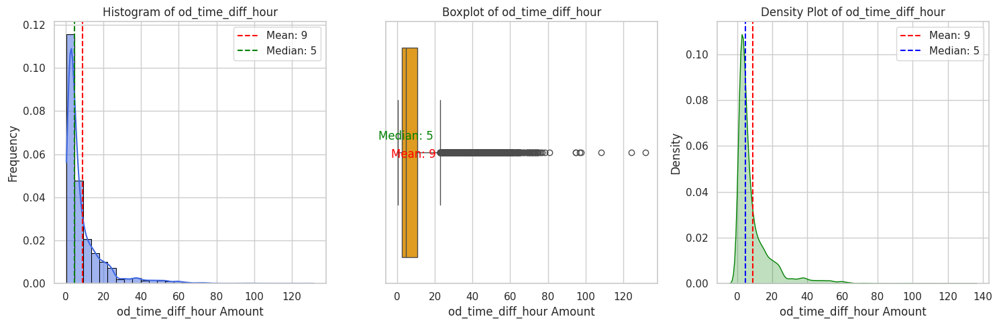

In [84]:
numerical_columns_distribution_with_stats(df_trip[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 373


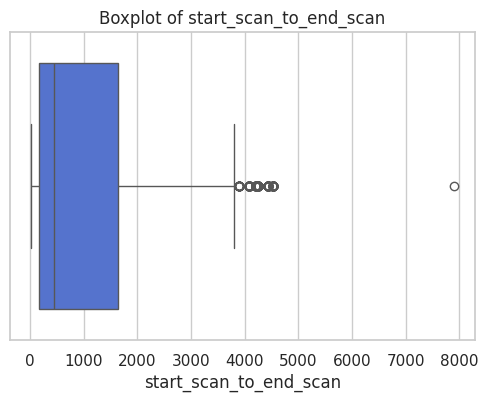


Column: actual_distance_to_destination
Number of outliers (IQR method): 17992


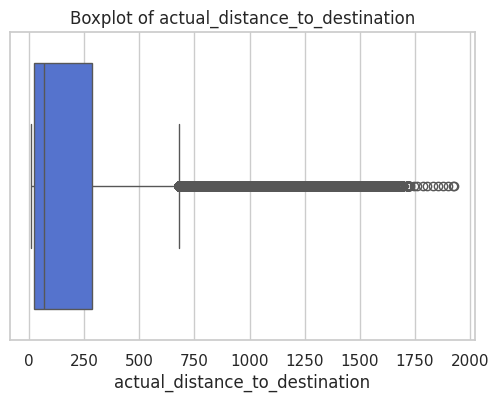


Column: actual_time
Number of outliers (IQR method): 16633


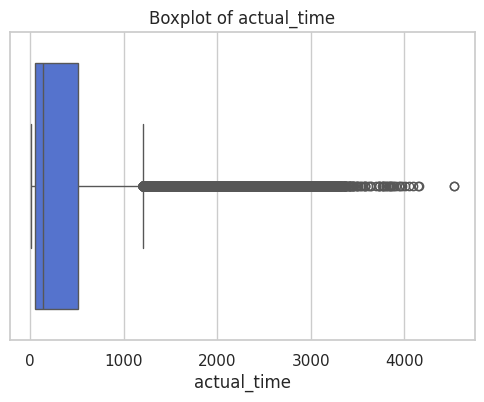


Column: osrm_time
Number of outliers (IQR method): 17603


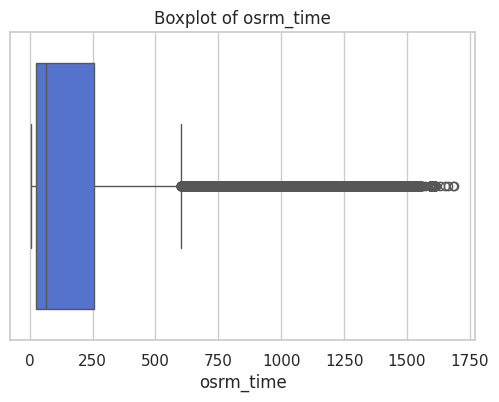


Column: segment_actual_time_sum
Number of outliers (IQR method): 16649


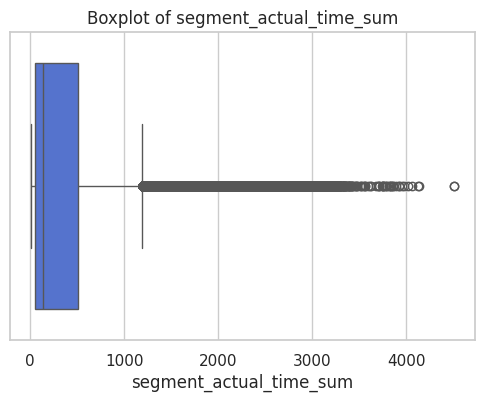


Column: segment_osrm_time_sum
Number of outliers (IQR method): 17678


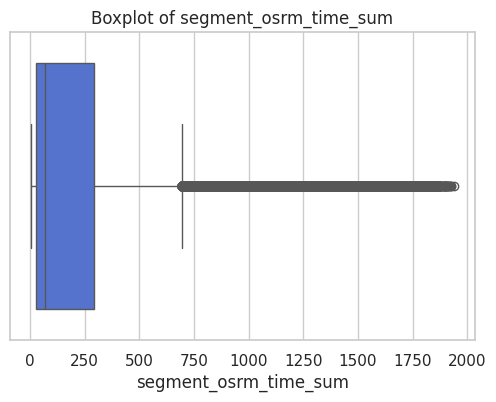


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 17879


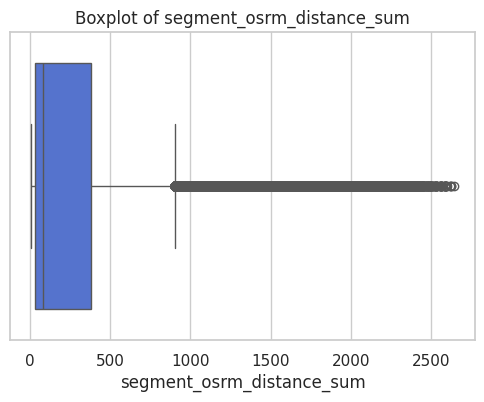


Column: od_time_diff_hour
Number of outliers (IQR method): 373


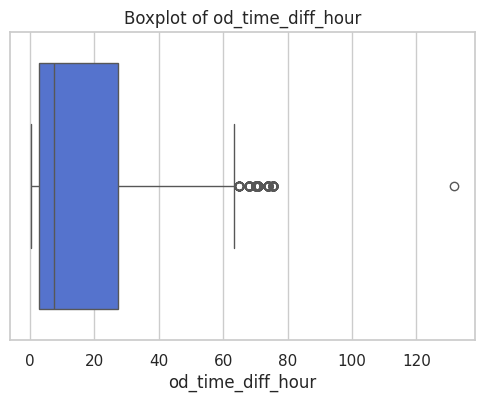

In [85]:
iqr_outliers_boxplot(df[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 2720


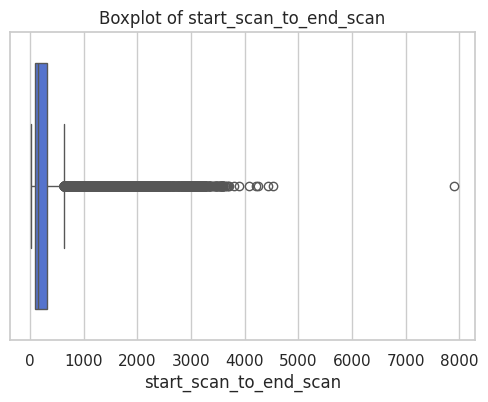


Column: actual_distance_to_destination
Number of outliers (IQR method): 3282


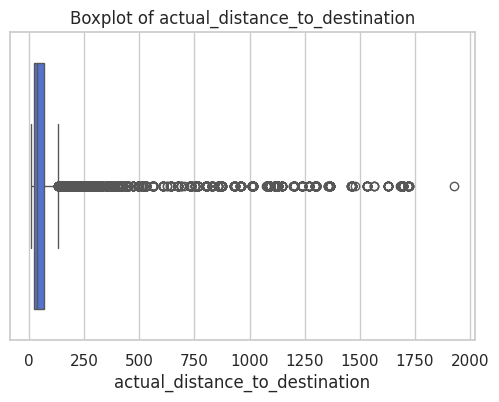


Column: actual_time
Number of outliers (IQR method): 3152


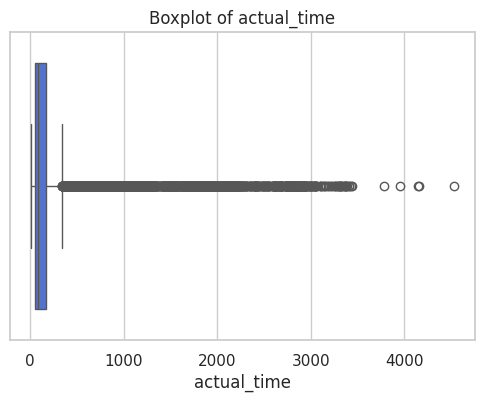


Column: osrm_time
Number of outliers (IQR method): 2919


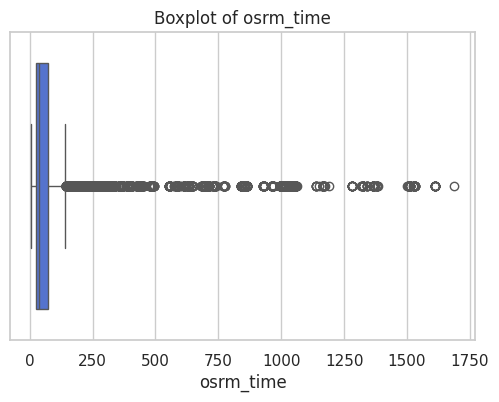


Column: segment_actual_time_sum
Number of outliers (IQR method): 3155


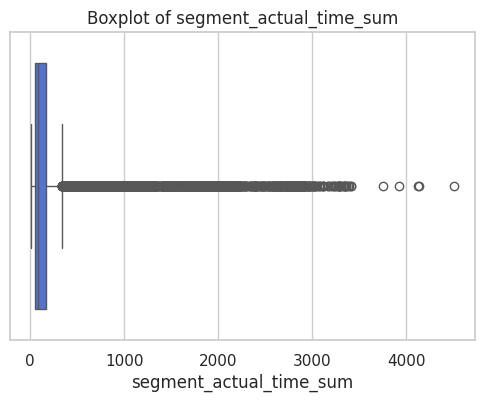


Column: segment_osrm_time_sum
Number of outliers (IQR method): 3153


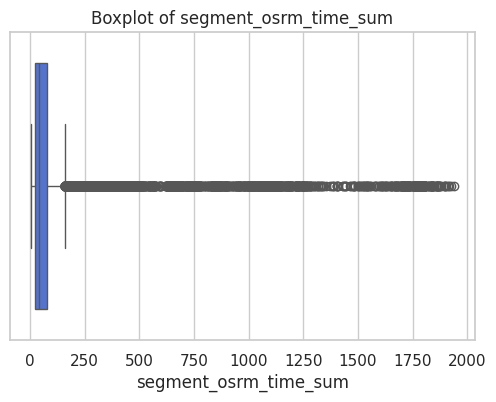


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 3106


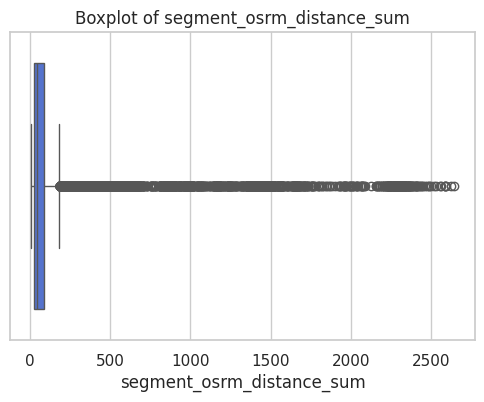


Column: od_time_diff_hour
Number of outliers (IQR method): 2726


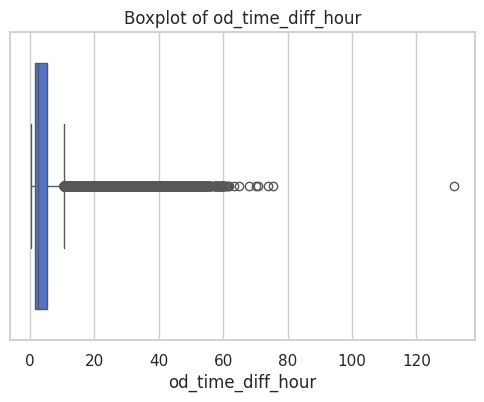

In [86]:
iqr_outliers_boxplot(df_segment[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 1267


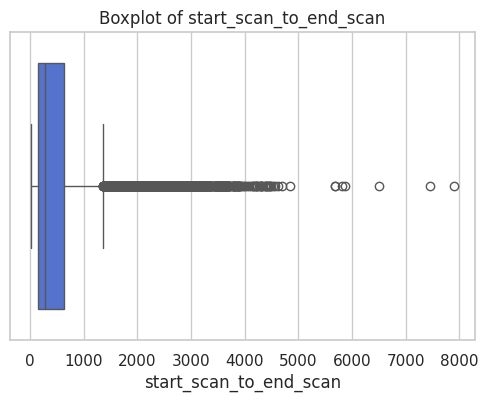


Column: actual_distance_to_destination
Number of outliers (IQR method): 1449


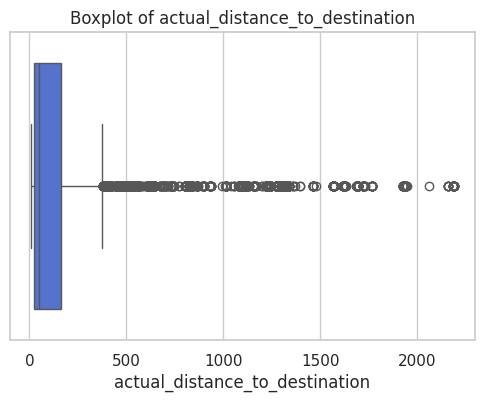


Column: actual_time
Number of outliers (IQR method): 1643


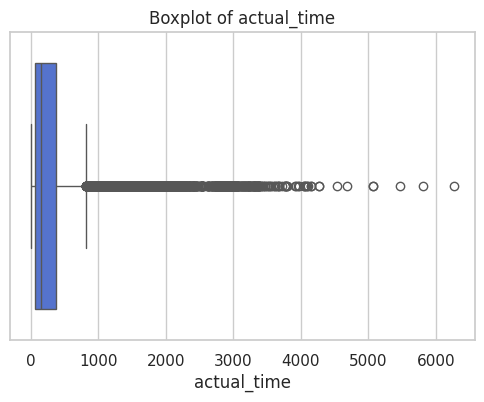


Column: osrm_time
Number of outliers (IQR method): 1517


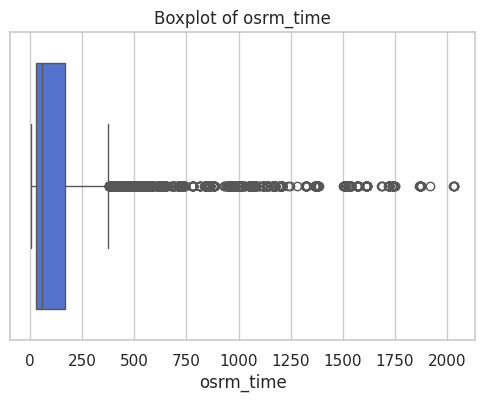


Column: segment_actual_time_sum
Number of outliers (IQR method): 1643


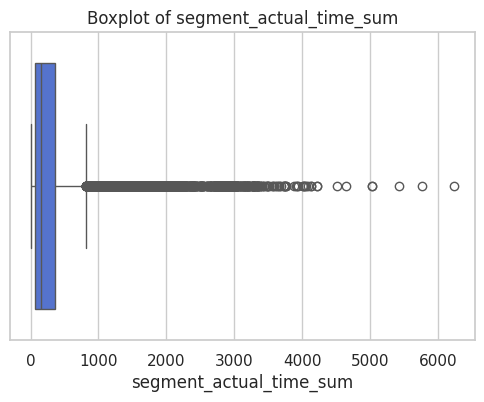


Column: segment_osrm_time_sum
Number of outliers (IQR method): 1492


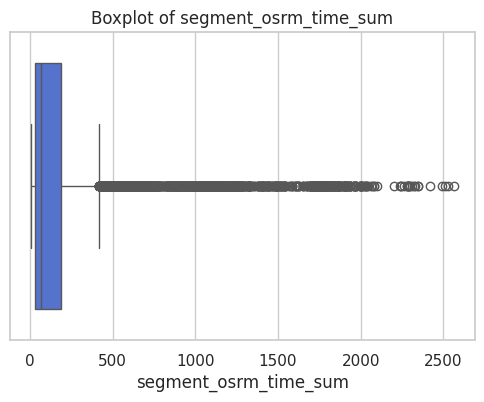


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 1548


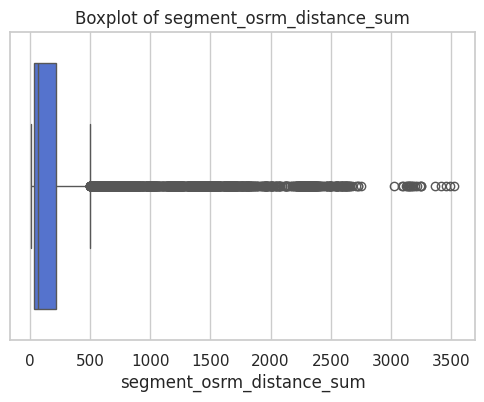


Column: od_time_diff_hour
Number of outliers (IQR method): 1266


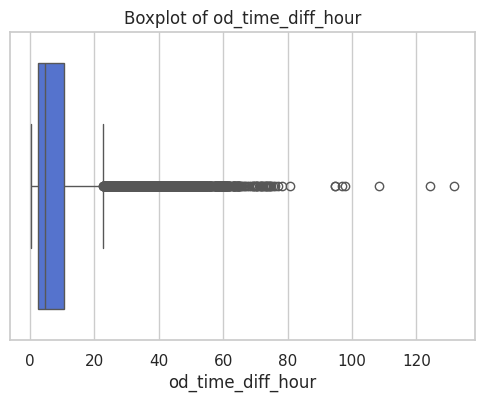

In [87]:
iqr_outliers_boxplot(df_trip[columns_plot])

In [88]:
df[columns_plot].skew(), df_segment[columns_plot].skew(), df_trip[columns_plot].skew()

(start_scan_to_end_scan            1.110624
 actual_distance_to_destination    1.991105
 actual_time                       2.068065
 osrm_time                         2.045166
 segment_actual_time_sum           2.069095
 segment_osrm_time_sum             2.065670
 segment_osrm_distance_sum         2.070555
 od_time_diff_hour                 1.110630
 dtype: float64,
 start_scan_to_end_scan            4.214274
 actual_distance_to_destination    5.161389
 actual_time                       4.775808
 osrm_time                         5.115344
 segment_actual_time_sum           4.771217
 segment_osrm_time_sum             5.231527
 segment_osrm_distance_sum         5.286599
 od_time_diff_hour                 4.214363
 dtype: float64,
 start_scan_to_end_scan            2.886484
 actual_distance_to_destination    3.558776
 actual_time                       3.369090
 osrm_time                         3.449522
 segment_actual_time_sum           3.365921
 segment_osrm_time_sum             3.59782

#Outlier Treatment (IQR Method)

In [89]:
df_iqr_clipped = df.copy(deep=True)
df_segment_iqr_clipped = df_segment.copy(deep=True)
df_trip_iqr_clipped = df_trip.copy(deep=True)

In [90]:

def clip_iqr(series, factor=1.5):
    Q1, Q3 = series.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower, upper = Q1 - factor * IQR, Q3 + factor * IQR
    return series.clip(lower, upper)


for i in [df_iqr_clipped, df_segment_iqr_clipped, df_trip_iqr_clipped]:

  i["start_scan_to_end_scan"] = clip_iqr(i["start_scan_to_end_scan"])

  i["actual_distance_to_destination"] = clip_iqr(i["actual_distance_to_destination"])

  i["actual_time"] = clip_iqr(i["actual_time"])

  i["segment_actual_time_sum"] = clip_iqr(i["segment_actual_time_sum"])

  i["osrm_time"] = clip_iqr(i["osrm_time"])

  i["segment_osrm_time_sum"] = clip_iqr(i["segment_osrm_time_sum"])
  i["osrm_distance"] = clip_iqr(i["osrm_distance"])

  i["segment_osrm_distance_sum"] = clip_iqr(i["segment_osrm_distance_sum"])
  i["od_time_diff_hour"] = clip_iqr(i["od_time_diff_hour"])

  #i["factor"] = i["factor"].clip(lower=0.5, upper=3)
  #i["segment_factor"] = i["segment_factor"].clip(lower=0.5, upper=3)
  #i["cutoff_factor"] = clip_iqr(i["cutoff_factor"])



In [91]:
df_iqr_clipped[columns_plot].skew(), df_segment_iqr_clipped[columns_plot].skew(), df_trip_iqr_clipped[columns_plot].skew()

(start_scan_to_end_scan            1.093299
 actual_distance_to_destination    1.221558
 actual_time                       1.218199
 osrm_time                         1.204012
 segment_actual_time_sum           1.217751
 segment_osrm_time_sum             1.225434
 segment_osrm_distance_sum         1.220784
 od_time_diff_hour                 1.093335
 dtype: float64,
 start_scan_to_end_scan            1.149702
 actual_distance_to_destination    1.129037
 actual_time                       1.154173
 osrm_time                         1.105606
 segment_actual_time_sum           1.152148
 segment_osrm_time_sum             1.114724
 segment_osrm_distance_sum         1.136201
 od_time_diff_hour                 1.149151
 dtype: float64,
 start_scan_to_end_scan            1.169123
 actual_distance_to_destination    1.280021
 actual_time                       1.173533
 osrm_time                         1.237223
 segment_actual_time_sum           1.174965
 segment_osrm_time_sum             1.23791

Statistics for start_scan_to_end_scan:
  Mean   : 960.11
  Median : 449.00
  Std Dev: 1033.48
  Min    : 20.00
  Max    : 3843.50


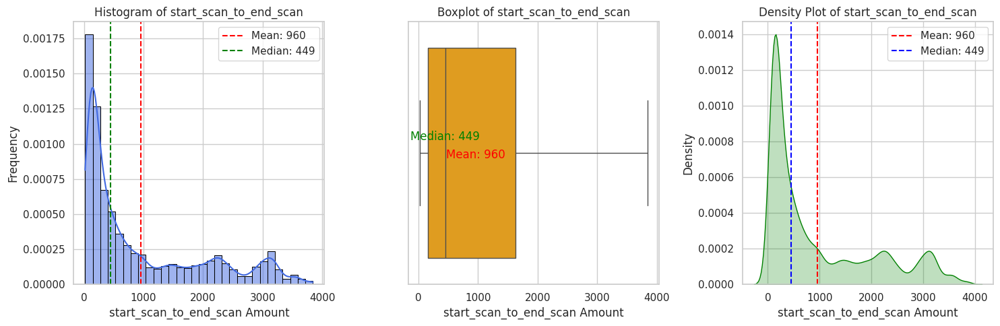

Statistics for actual_distance_to_destination:
  Mean   : 191.21
  Median : 66.13
  Std Dev: 235.28
  Min    : 9.00
  Max    : 681.74


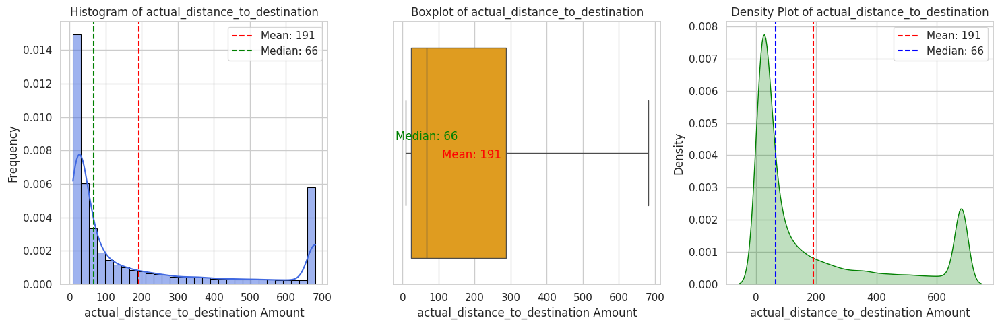

Statistics for actual_time:
  Mean   : 344.45
  Median : 132.00
  Std Dev: 407.29
  Min    : 9.00
  Max    : 1206.00


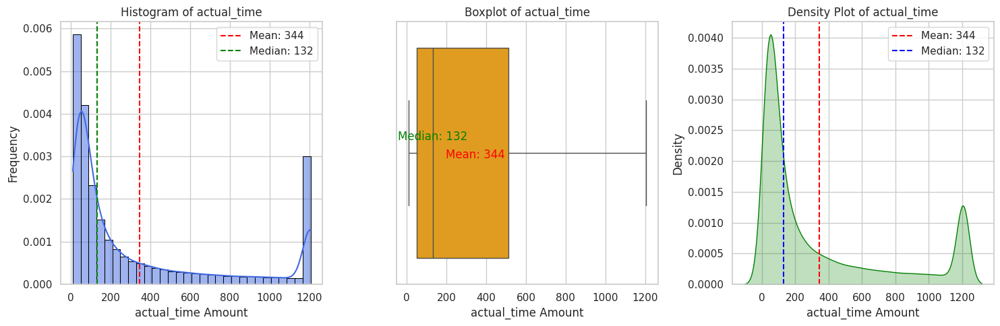

Statistics for osrm_time:
  Mean   : 174.41
  Median : 64.00
  Std Dev: 206.00
  Min    : 6.00
  Max    : 602.00


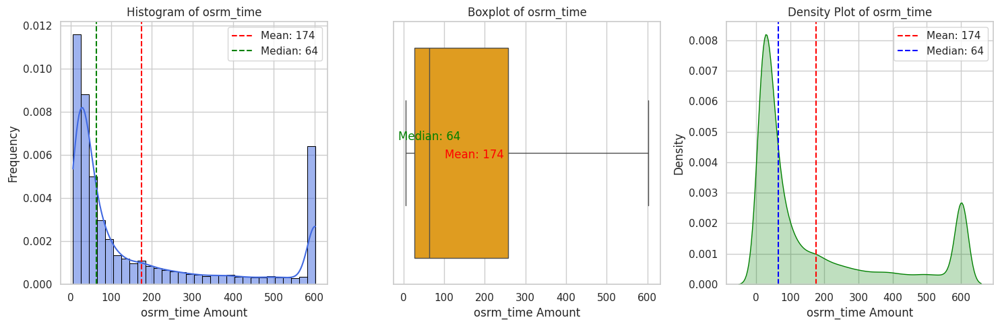

Statistics for segment_actual_time_sum:
  Mean   : 341.03
  Median : 130.00
  Std Dev: 403.06
  Min    : 9.00
  Max    : 1193.50


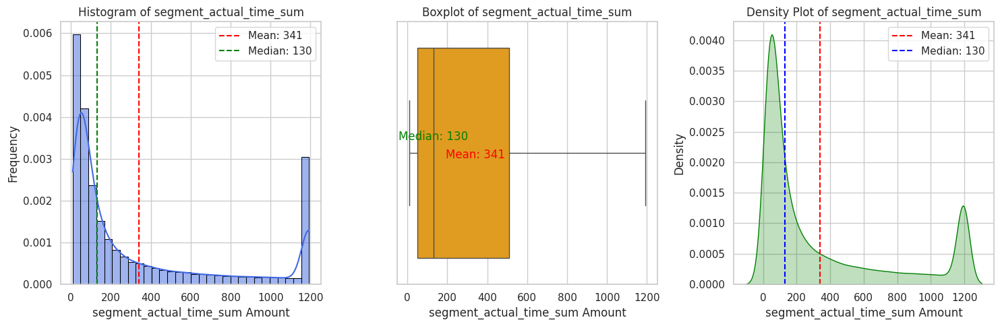

Statistics for segment_osrm_time_sum:
  Mean   : 196.65
  Median : 69.00
  Std Dev: 237.90
  Min    : 6.00
  Max    : 694.50


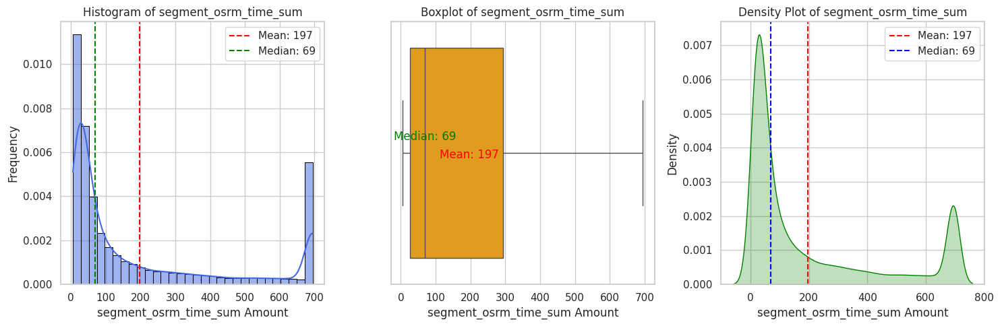

Statistics for segment_osrm_distance_sum:
  Mean   : 252.79
  Median : 81.76
  Std Dev: 312.36
  Min    : 9.01
  Max    : 902.77


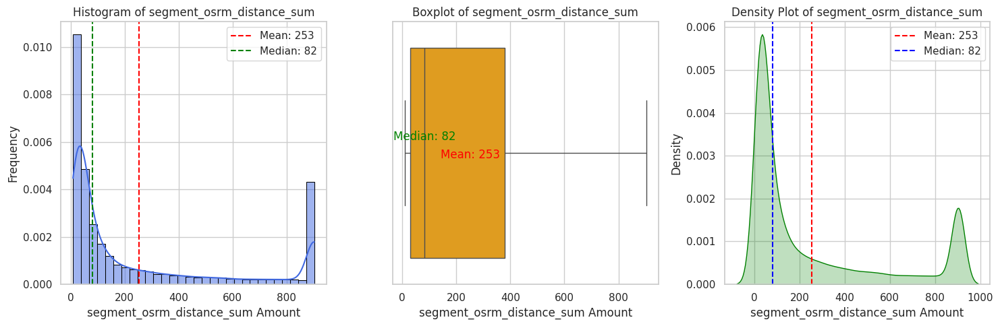

Statistics for od_time_diff_hour:
  Mean   : 16.01
  Median : 7.49
  Std Dev: 17.22
  Min    : 0.35
  Max    : 64.09


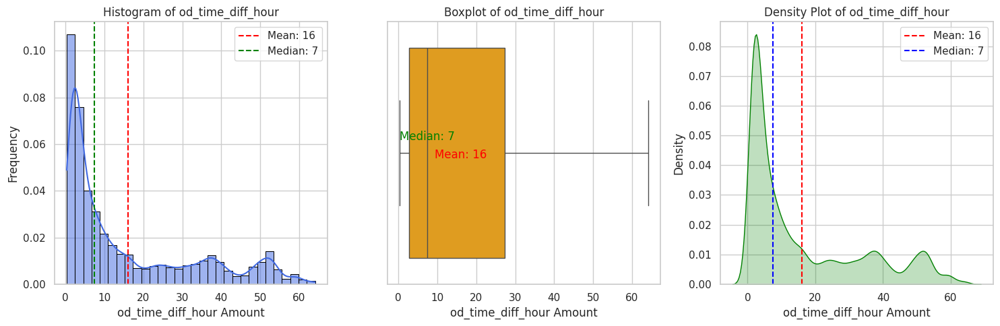

In [92]:
numerical_columns_distribution_with_stats(df_iqr_clipped[columns_plot])

Statistics for start_scan_to_end_scan:
  Mean   : 228.28
  Median : 152.00
  Std Dev: 185.33
  Min    : 20.00
  Max    : 631.00


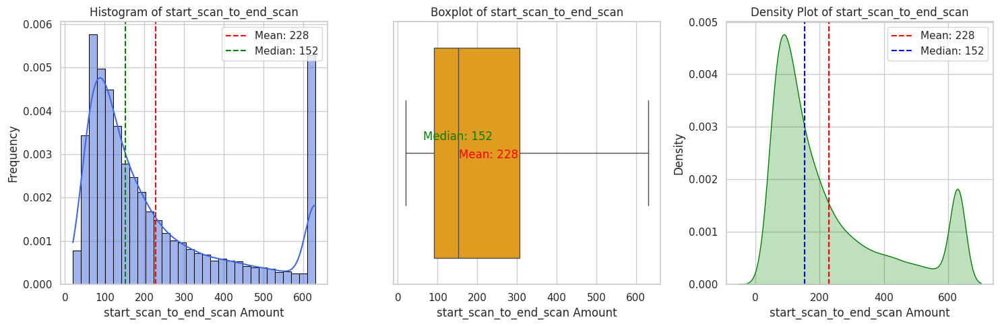

Statistics for actual_distance_to_destination:
  Mean   : 50.43
  Median : 35.24
  Std Dev: 39.11
  Min    : 9.00
  Max    : 132.52


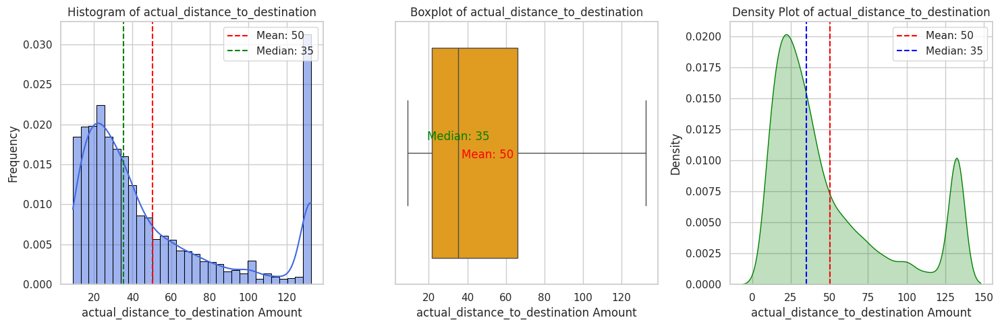

Statistics for actual_time:
  Mean   : 126.10
  Median : 84.00
  Std Dev: 102.25
  Min    : 9.00
  Max    : 343.50


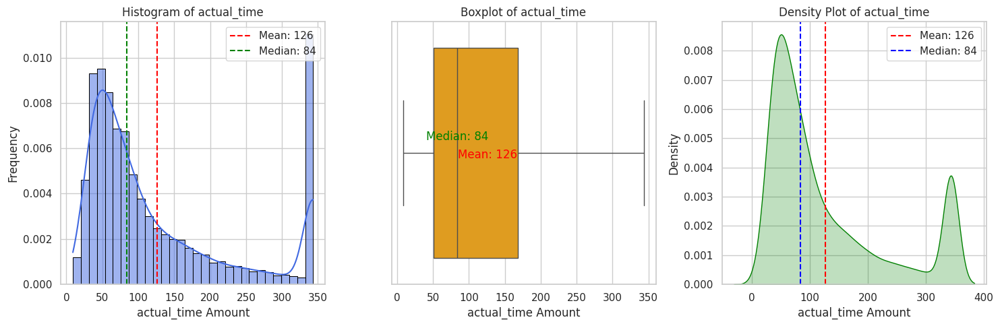

Statistics for osrm_time:
  Mean   : 55.13
  Median : 39.00
  Std Dev: 41.05
  Min    : 6.00
  Max    : 142.50


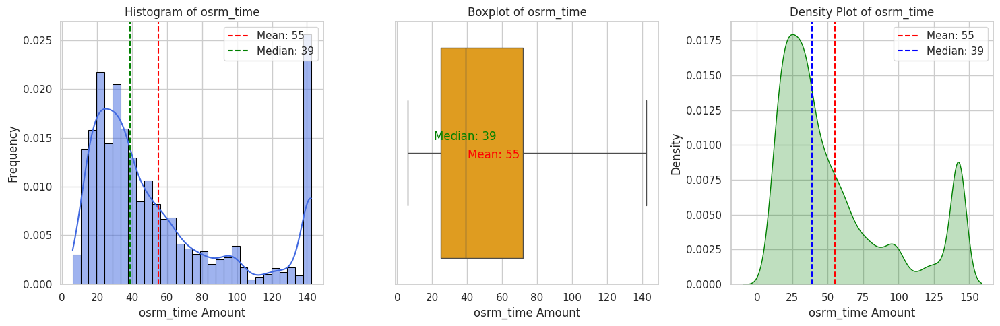

Statistics for segment_actual_time_sum:
  Mean   : 124.87
  Median : 83.00
  Std Dev: 101.30
  Min    : 9.00
  Max    : 340.00


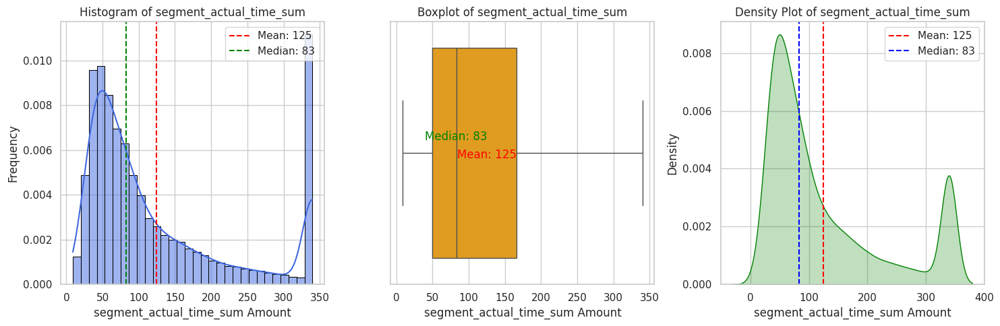

Statistics for segment_osrm_time_sum:
  Mean   : 60.38
  Median : 42.00
  Std Dev: 47.49
  Min    : 6.00
  Max    : 160.00


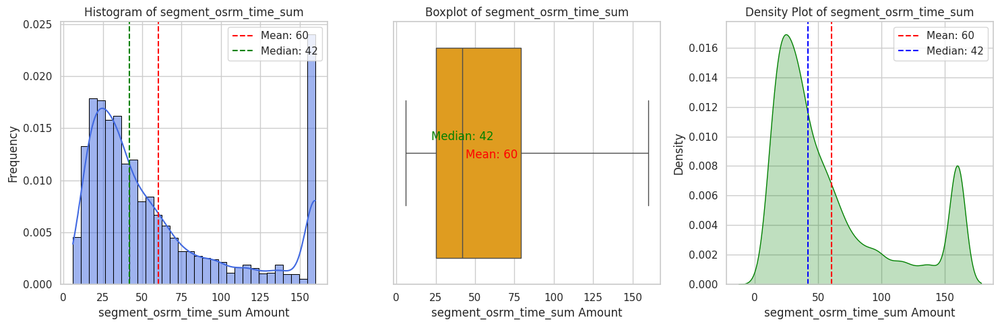

Statistics for segment_osrm_distance_sum:
  Mean   : 69.08
  Median : 45.94
  Std Dev: 55.29
  Min    : 9.07
  Max    : 185.67


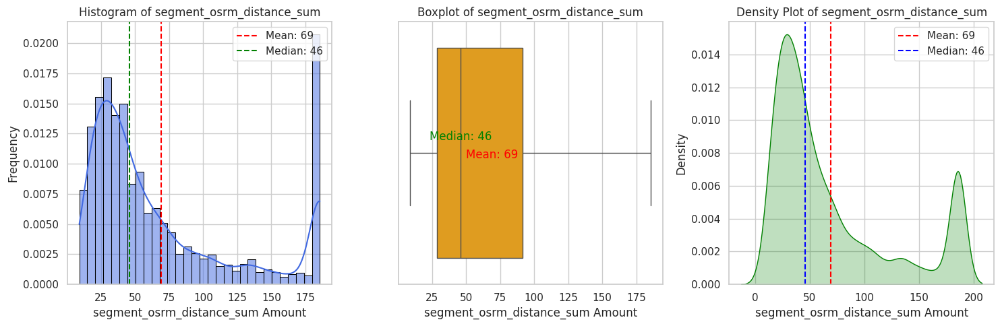

Statistics for od_time_diff_hour:
  Mean   : 3.81
  Median : 2.54
  Std Dev: 3.09
  Min    : 0.35
  Max    : 10.52


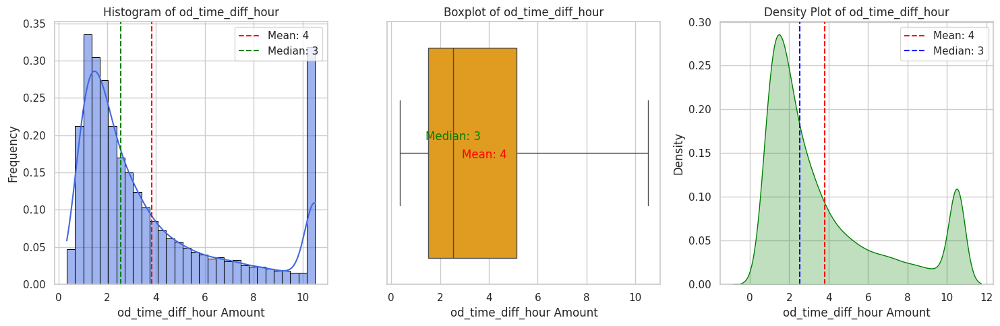

In [93]:
numerical_columns_distribution_with_stats(df_segment_iqr_clipped[columns_plot])

Statistics for start_scan_to_end_scan:
  Mean   : 453.40
  Median : 280.00
  Std Dev: 409.88
  Min    : 23.00
  Max    : 1369.00


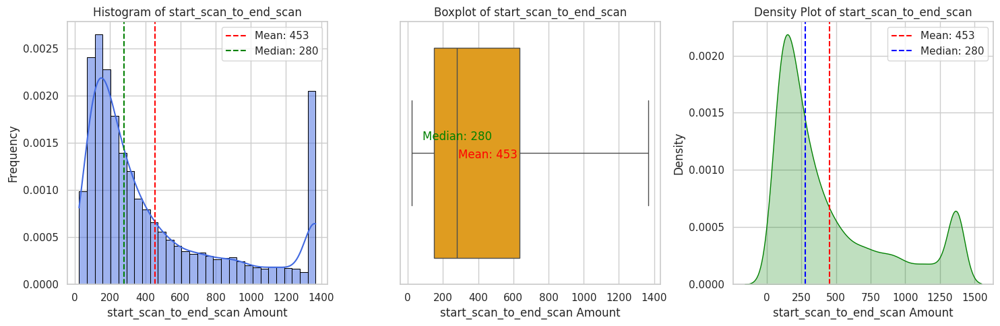

Statistics for actual_distance_to_destination:
  Mean   : 109.27
  Median : 48.50
  Std Dev: 117.57
  Min    : 9.00
  Max    : 377.84


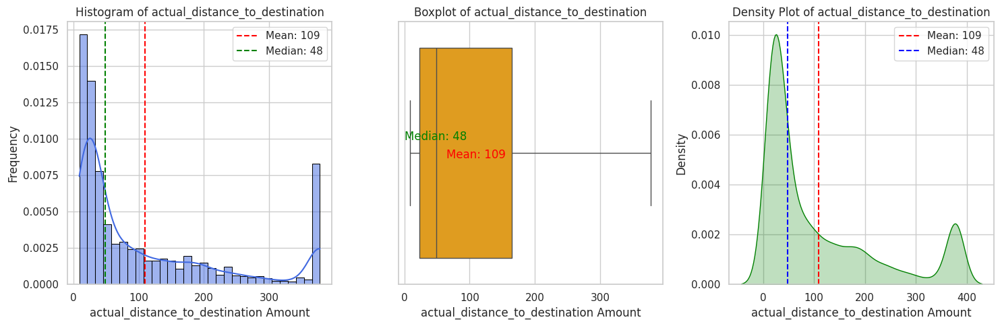

Statistics for actual_time:
  Mean   : 263.85
  Median : 149.00
  Std Dev: 260.94
  Min    : 9.00
  Max    : 824.50


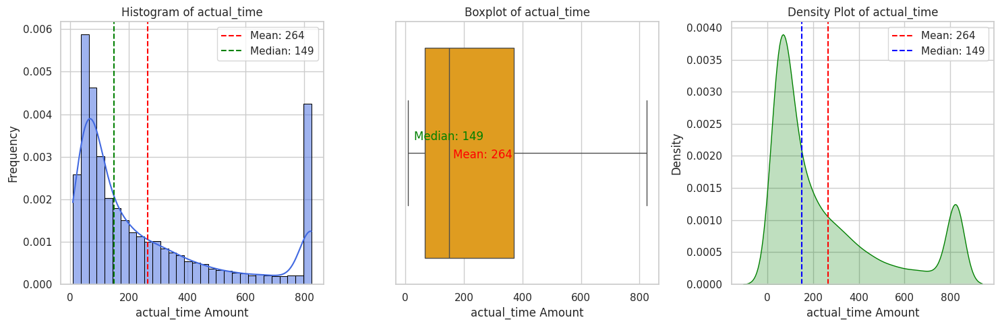

Statistics for osrm_time:
  Mean   : 114.88
  Median : 60.00
  Std Dev: 116.31
  Min    : 6.00
  Max    : 376.50


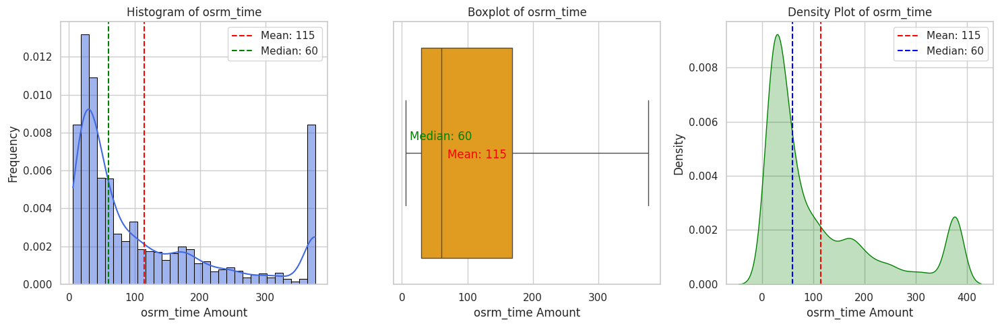

Statistics for segment_actual_time_sum:
  Mean   : 261.57
  Median : 147.00
  Std Dev: 259.13
  Min    : 9.00
  Max    : 818.50


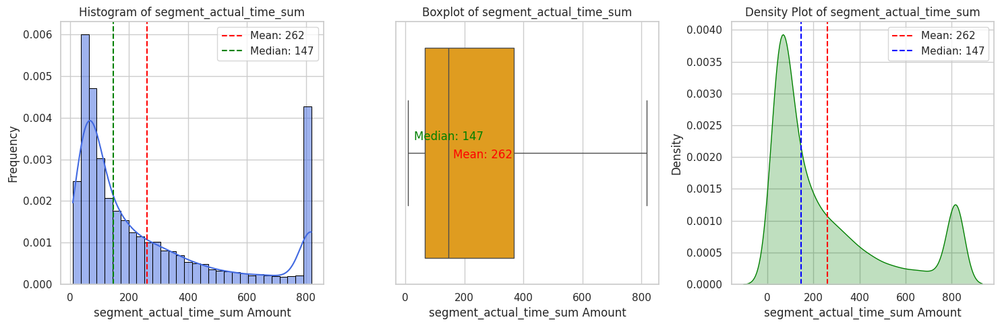

Statistics for segment_osrm_time_sum:
  Mean   : 126.12
  Median : 65.00
  Std Dev: 128.45
  Min    : 6.00
  Max    : 416.00


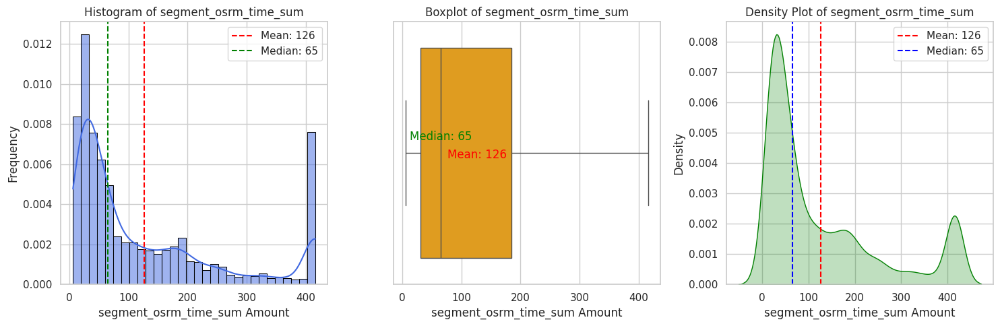

Statistics for segment_osrm_distance_sum:
  Mean   : 146.94
  Median : 70.15
  Std Dev: 155.19
  Min    : 9.07
  Max    : 498.02


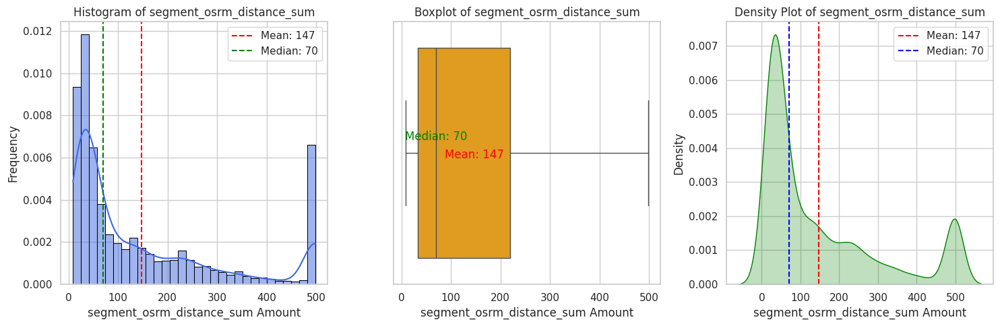

Statistics for od_time_diff_hour:
  Mean   : 7.57
  Median : 4.68
  Std Dev: 6.84
  Min    : 0.39
  Max    : 22.84


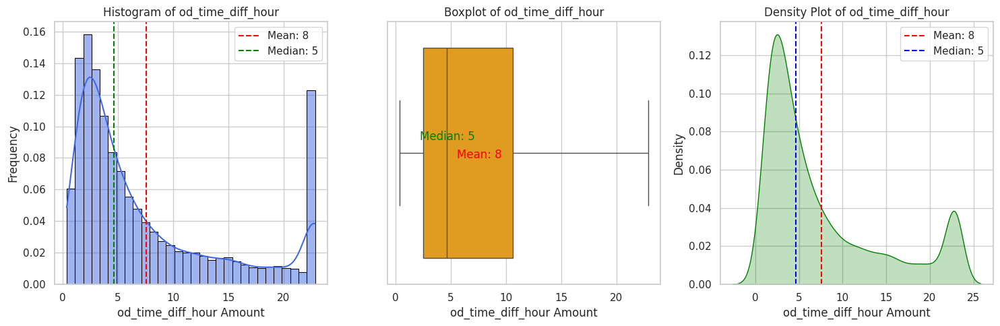

In [94]:
numerical_columns_distribution_with_stats(df_trip_iqr_clipped[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 0


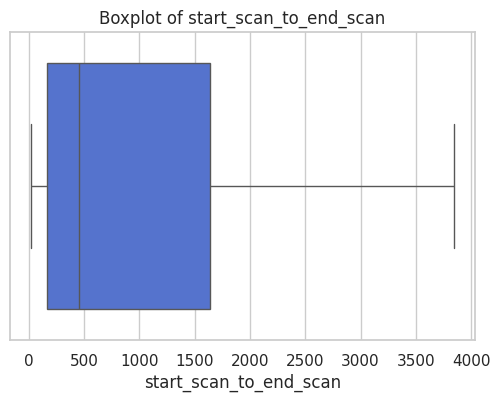


Column: actual_distance_to_destination
Number of outliers (IQR method): 0


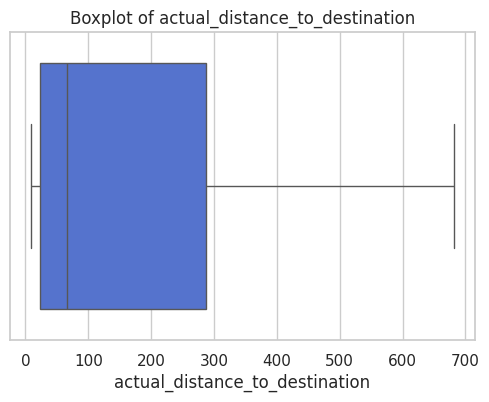


Column: actual_time
Number of outliers (IQR method): 0


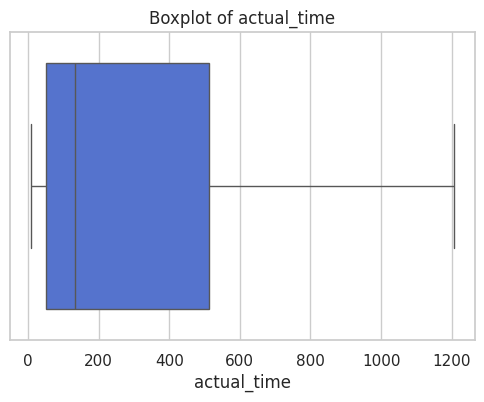


Column: osrm_time
Number of outliers (IQR method): 0


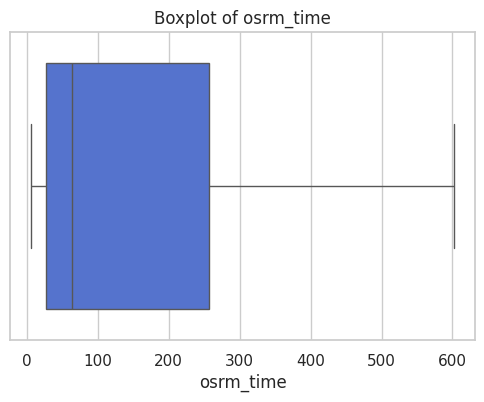


Column: segment_actual_time_sum
Number of outliers (IQR method): 0


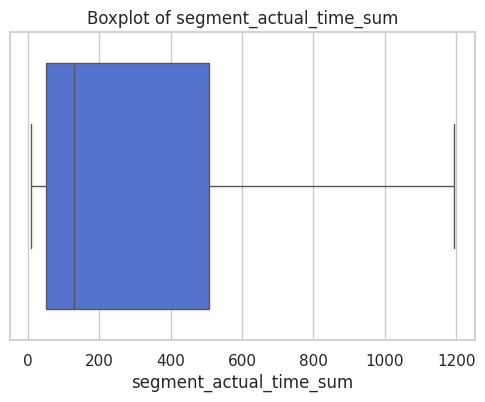


Column: segment_osrm_time_sum
Number of outliers (IQR method): 0


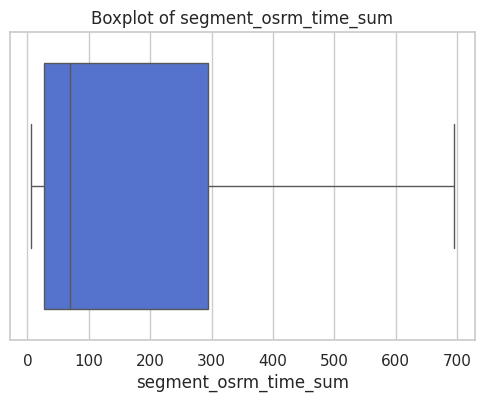


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 0


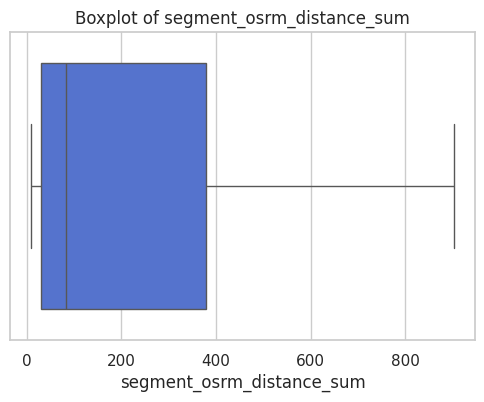


Column: od_time_diff_hour
Number of outliers (IQR method): 0


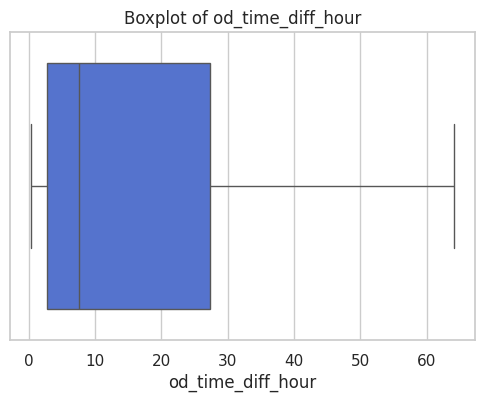

In [95]:
iqr_outliers_boxplot(df_iqr_clipped[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 0


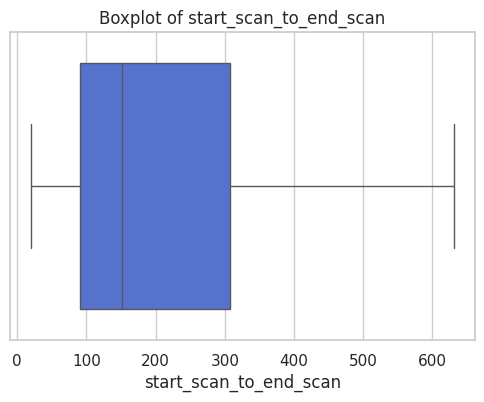


Column: actual_distance_to_destination
Number of outliers (IQR method): 0


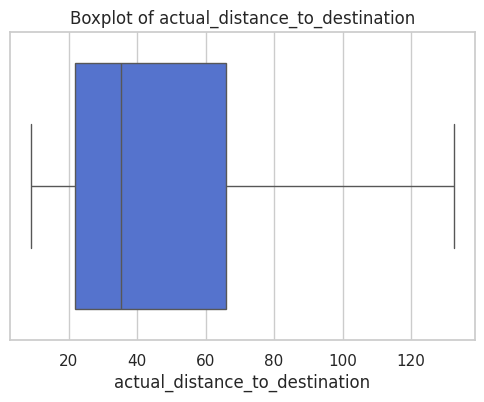


Column: actual_time
Number of outliers (IQR method): 0


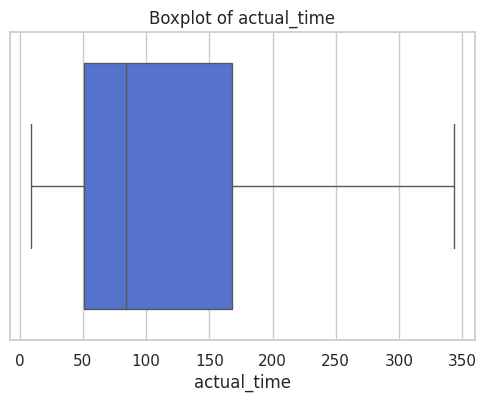


Column: osrm_time
Number of outliers (IQR method): 0


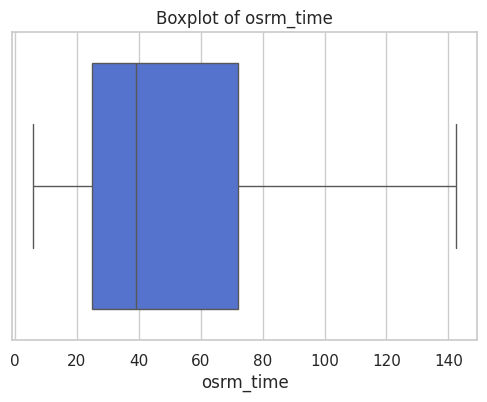


Column: segment_actual_time_sum
Number of outliers (IQR method): 0


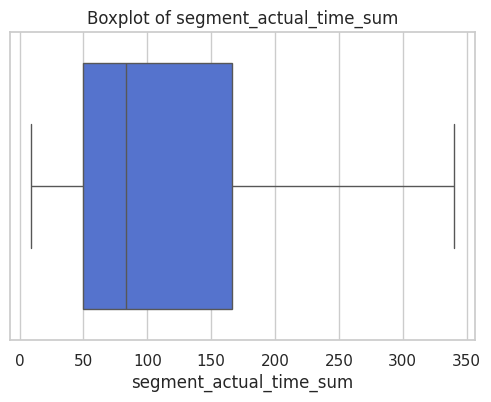


Column: segment_osrm_time_sum
Number of outliers (IQR method): 0


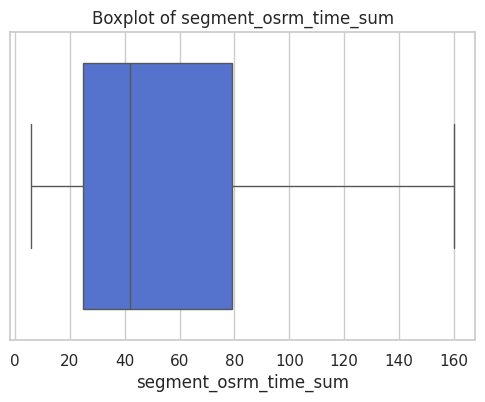


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 0


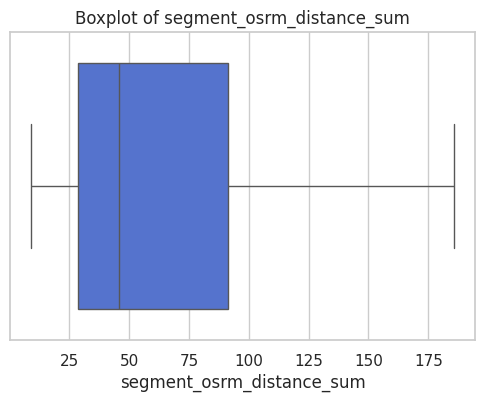


Column: od_time_diff_hour
Number of outliers (IQR method): 0


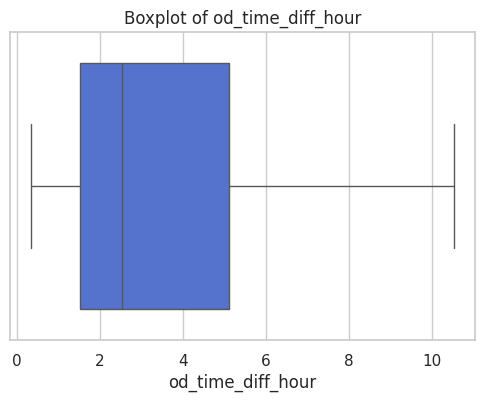

In [96]:
iqr_outliers_boxplot(df_segment_iqr_clipped[columns_plot])


Column: start_scan_to_end_scan
Number of outliers (IQR method): 0


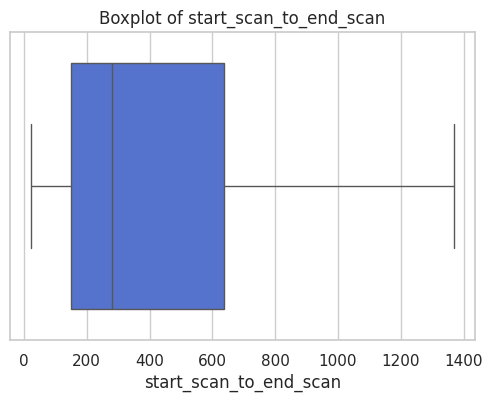


Column: actual_distance_to_destination
Number of outliers (IQR method): 0


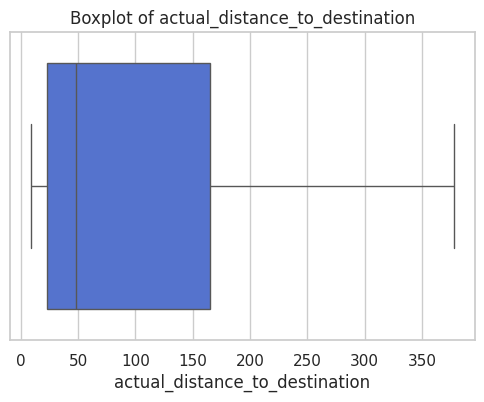


Column: actual_time
Number of outliers (IQR method): 0


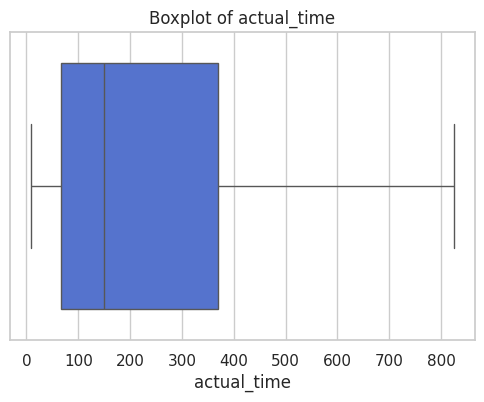


Column: osrm_time
Number of outliers (IQR method): 0


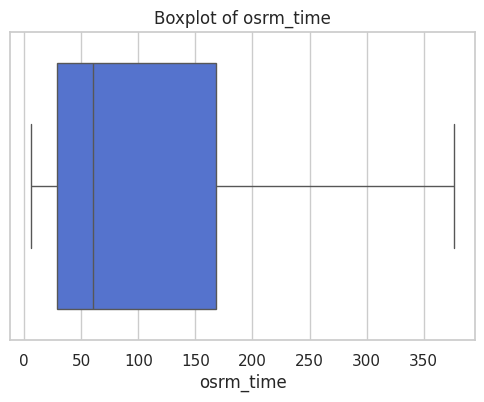


Column: segment_actual_time_sum
Number of outliers (IQR method): 0


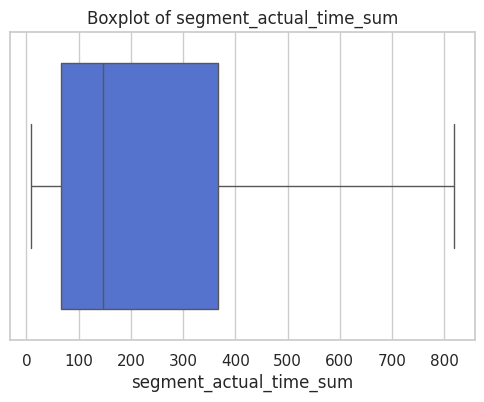


Column: segment_osrm_time_sum
Number of outliers (IQR method): 0


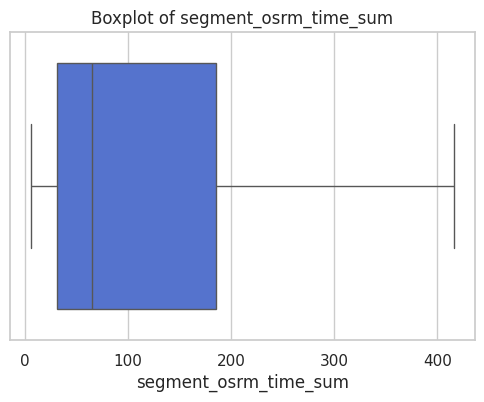


Column: segment_osrm_distance_sum
Number of outliers (IQR method): 0


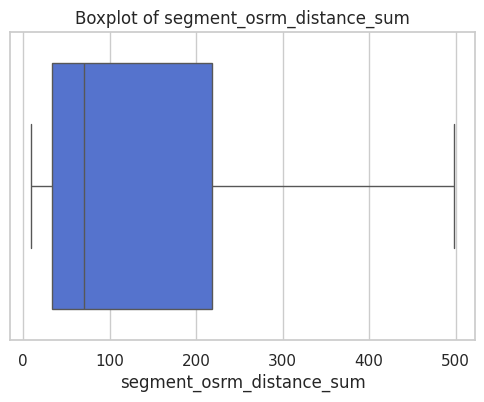


Column: od_time_diff_hour
Number of outliers (IQR method): 0


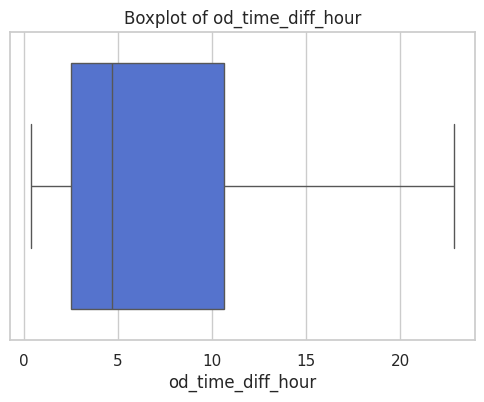

In [97]:
iqr_outliers_boxplot(df_trip_iqr_clipped[columns_plot])

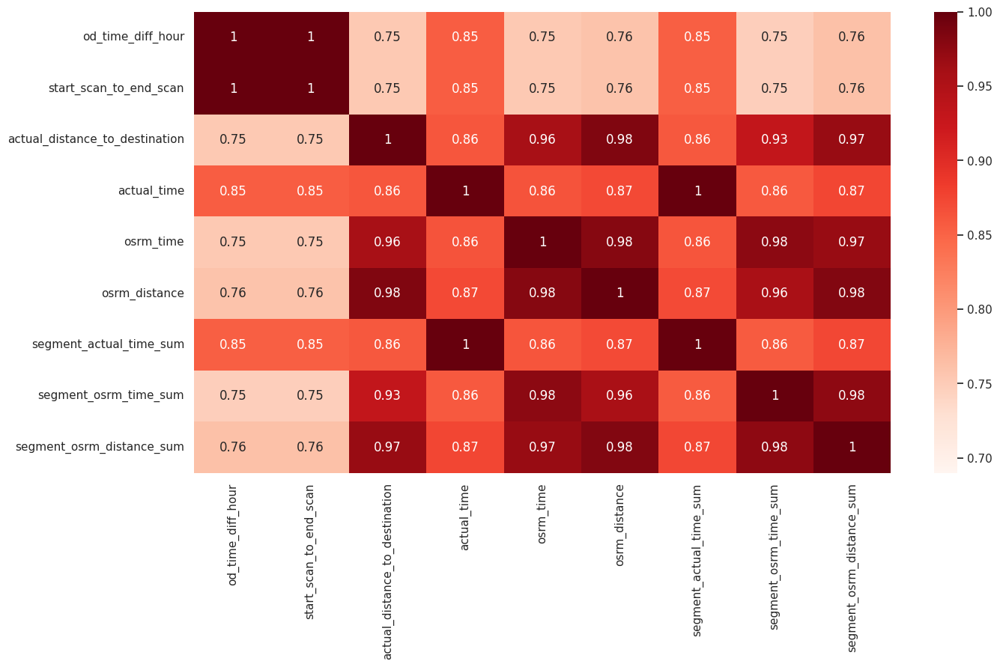

In [98]:
plt.figure(figsize = (15,8))
sns.heatmap(data = df_segment_iqr_clipped[df_segment_iqr_clipped.select_dtypes(include=['number']).columns[:-5]].corr(),vmin=0.69, annot = True, cmap='Reds')
plt.show()

#Hypothesis Testing

##1. Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

As data are skewed we will log transform so that the assumptions are met and get reasonable p-value.

In [99]:
log_actual_time = np.log(df_trip_iqr_clipped['actual_time'])
log_osrm_time = np.log(df_trip_iqr_clipped['osrm_time'])

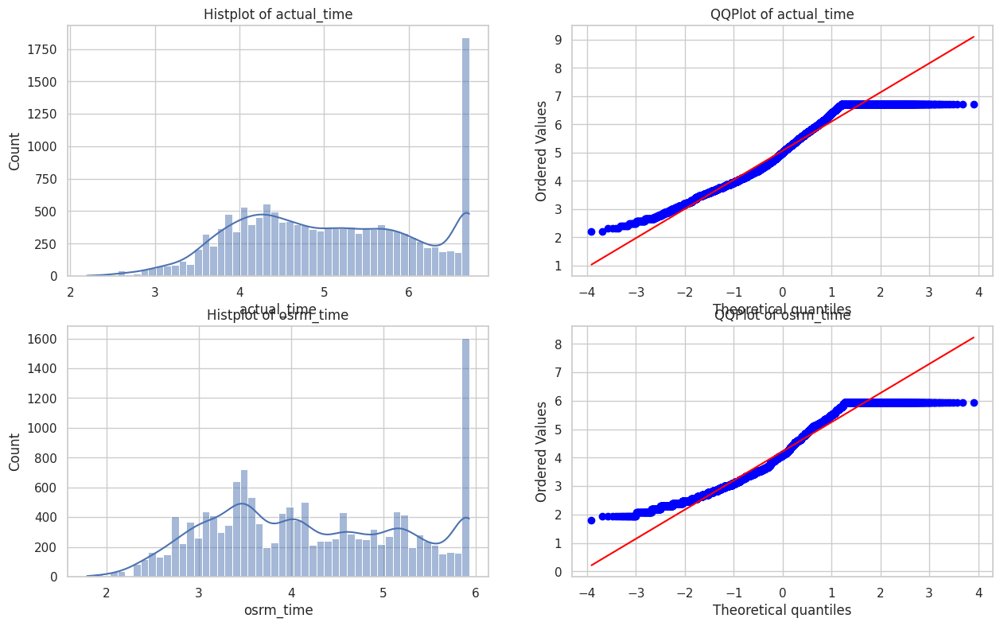

In [100]:
from scipy import stats

fig = plt.figure(figsize=(15,9))
ax = fig.add_subplot(2,2,1)
sns.histplot(log_actual_time, bins=50, kde=True)
plt.title('Histplot of actual_time')

ax = fig.add_subplot(2,2,2)
stats.probplot(log_actual_time, dist='norm', plot=plt)
plt.title('QQPlot of actual_time')

ax = fig.add_subplot(2,2,3)
sns.histplot(log_osrm_time, bins=50, kde=True)
plt.title('Histplot of osrm_time')

ax = fig.add_subplot(2,2,4)
stats.probplot(log_osrm_time, dist='norm', plot=plt)
plt.title('QQPlot of osrm_time')
plt.show()

Ho: actual_time and osrm_time have the same mean.
<br>
Ha: actual_time and osrm_time does not have the same mean.

From the plots both data actual_time and osrm_time is not normally distributed

In [101]:
from scipy.stats import shapiro, levene, anderson, ttest_ind

In [102]:
anderson(log_actual_time, dist='norm'), anderson(log_osrm_time, dist='norm')

(AndersonResult(statistic=np.float64(150.67992457257606), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(5.061728180071428), scale=np.float64(1.053306247651692))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'),
 AndersonResult(statistic=np.float64(186.4359407655429), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(4.221224000468138), scale=np.float64(1.049430201953855))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'))

In [103]:
levene(log_actual_time, log_osrm_time)

LeveneResult(statistic=np.float64(0.00845530308459799), pvalue=np.float64(0.9267362243502617))

actual_time and osrm_time are not normally distributed but they have equal variance.

Here we can use ttest_ind with equal_var=True

In [104]:
ttest_ind(log_actual_time, log_osrm_time, equal_var=True)

TtestResult(statistic=np.float64(68.80966363245456), pvalue=np.float64(0.0), df=np.float64(29632.0))

###Result

As p< 0.05, Ho is rejected i.e. It is confirmed that There is a significant difference in the Mean values of Aggregated actual_time and Aggregated osrm_time

##2. Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [105]:
log_actual_time = np.log(df_trip_iqr_clipped['actual_time'])
log_segment_actual_time = np.log(df_trip_iqr_clipped['segment_actual_time_sum'])

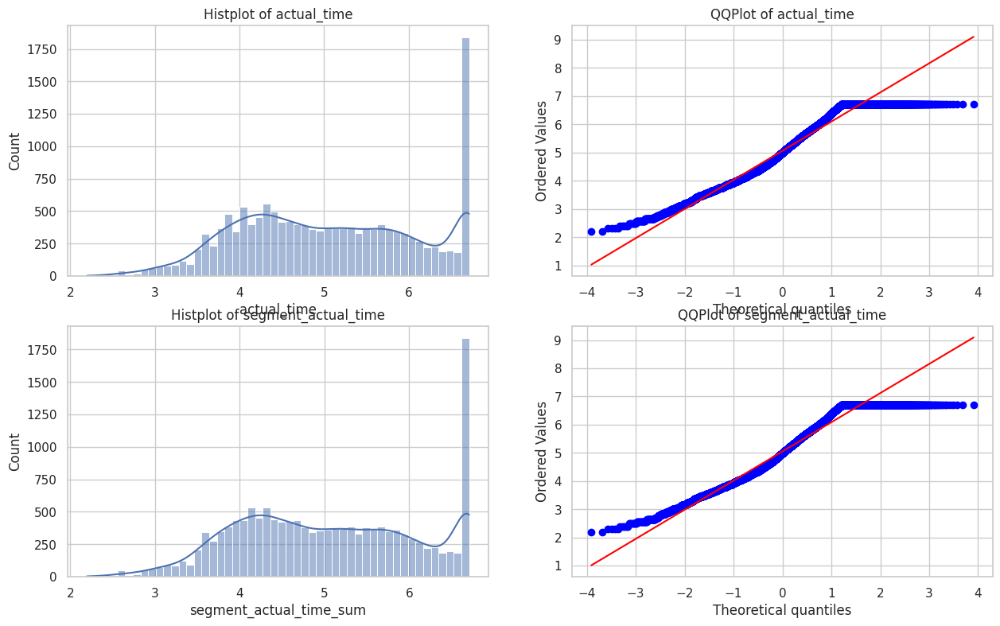

In [106]:
fig = plt.figure(figsize=(15,9))
ax = fig.add_subplot(2,2,1)
sns.histplot(log_actual_time, bins=50, kde=True)
plt.title('Histplot of actual_time')

ax = fig.add_subplot(2,2,2)
stats.probplot(log_actual_time, dist='norm', plot=plt)
plt.title('QQPlot of actual_time')

ax = fig.add_subplot(2,2,3)
sns.histplot(log_segment_actual_time, bins=50, kde=True)
plt.title('Histplot of segment_actual_time')

ax = fig.add_subplot(2,2,4)
stats.probplot(log_segment_actual_time, dist='norm', plot=plt)
plt.title('QQPlot of segment_actual_time')
plt.show()

Ho: actual_time and segment_actual_time have the same mean.
<br>
Ha: actual_time and segment_actual_time does not have the same mean.

From the plots both data actual_time and segment_actual_time is not normally distributed

In [107]:
from scipy.stats import shapiro, levene, anderson, ttest_ind

In [108]:
anderson(log_actual_time, dist='norm'), anderson(log_segment_actual_time, dist='norm')

(AndersonResult(statistic=np.float64(150.67992457257606), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(5.061728180071428), scale=np.float64(1.053306247651692))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'),
 AndersonResult(statistic=np.float64(151.69149139311958), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(5.051312024281349), scale=np.float64(1.055034342403818))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'))

In [109]:
levene(log_actual_time, log_segment_actual_time)

LeveneResult(statistic=np.float64(0.07157258495740498), pvalue=np.float64(0.7890625722526636))

actual_time and segment_actual_time are not normally distributed but they have equal variance.

Here we can use ttest_ind with equal_var=True

In [110]:
ttest_ind(log_actual_time, log_segment_actual_time, equal_var=True)

TtestResult(statistic=np.float64(0.8504752690393445), pvalue=np.float64(0.39506777629015366), df=np.float64(29632.0))

###Result

As p> 0.05, fail to reject Ho i.e. It is confirmed that There is a no significant difference in the Mean values of Aggregated actual_time and Aggregated segment_actual_time

##3. Do hypothesis testing/ visual analysis between osrm distance aggregated value and segment osrm distance aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [111]:
osrm_distance = np.log(df_trip_iqr_clipped['osrm_distance'])
segment_osrm_distance = np.log(df_trip_iqr_clipped['segment_osrm_distance_sum'])

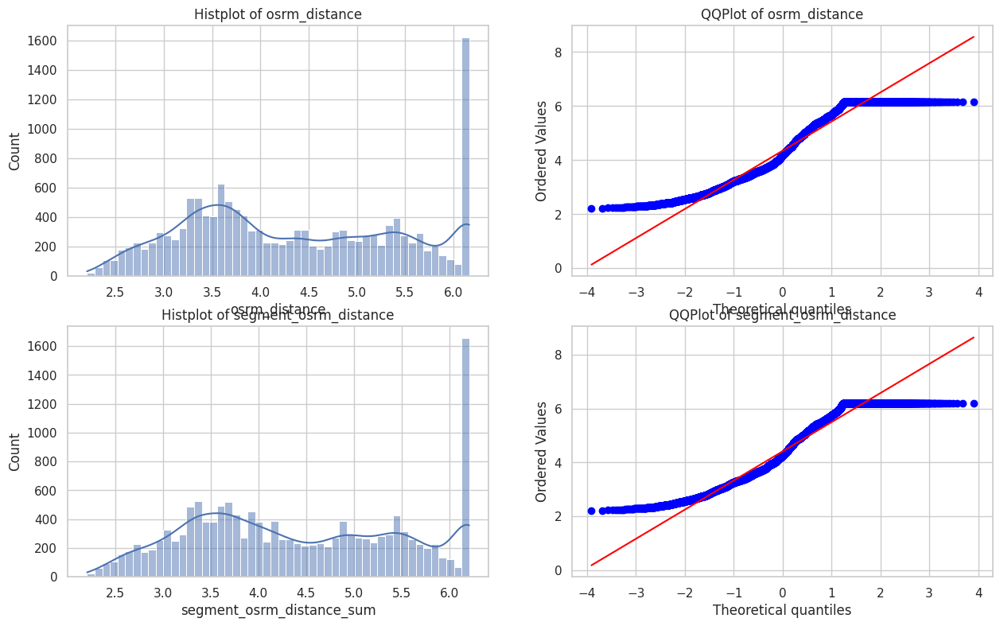

In [112]:
fig = plt.figure(figsize=(15,9))
ax = fig.add_subplot(2,2,1)
sns.histplot(osrm_distance, bins=50, kde=True)
plt.title('Histplot of osrm_distance')

ax = fig.add_subplot(2,2,2)
stats.probplot(osrm_distance, dist='norm', plot=plt)
plt.title('QQPlot of osrm_distance')

ax = fig.add_subplot(2,2,3)
sns.histplot(segment_osrm_distance, bins=50, kde=True)
plt.title('Histplot of segment_osrm_distance')

ax = fig.add_subplot(2,2,4)
stats.probplot(segment_osrm_distance, dist='norm', plot=plt)
plt.title('QQPlot of segment_osrm_distance')
plt.show()

Ho: osrm_distance and segment_osrm_distance have the same mean.
<br>
Ha: osrm_distance and segment_osrm_distance does not have the same mean.

From the plots both data osrm_distance and segment_osrm_distance is not normally distributed

In [113]:
from scipy.stats import shapiro, levene, anderson, ttest_ind, brunnermunzel

In [114]:
anderson(osrm_distance, dist='norm'), anderson(segment_osrm_distance, dist='norm')

(AndersonResult(statistic=np.float64(237.98391813442322), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(4.346276435476486), scale=np.float64(1.109863772369794))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'),
 AndersonResult(statistic=np.float64(209.53732657927503), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(4.409340686198638), scale=np.float64(1.1124067004254166))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'))

In [115]:
levene(osrm_distance, segment_osrm_distance)

LeveneResult(statistic=np.float64(0.0008596984817840855), pvalue=np.float64(0.9766090828234208))

osrm_distance and segment_osrm_distance are not normally distributed but they have equal variance.

Here we can use ttest_ind with equal_var=True

In [116]:
ttest_ind(osrm_distance, segment_osrm_distance, equal_var=True)

TtestResult(statistic=np.float64(-4.88518683720085), pvalue=np.float64(1.0386941340728736e-06), df=np.float64(29632.0))

###Result

As p < 0.05, reject Ho i.e. It is confirmed that There is significant difference in the Mean values of Aggregated osrm_distance and Aggregated segment_osrm_distance

## 4. Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid)

In [117]:
osrm_time = np.log(df_trip_iqr_clipped['osrm_time'])
segment_osrm_time = np.log(df_trip_iqr_clipped['segment_osrm_time_sum'])

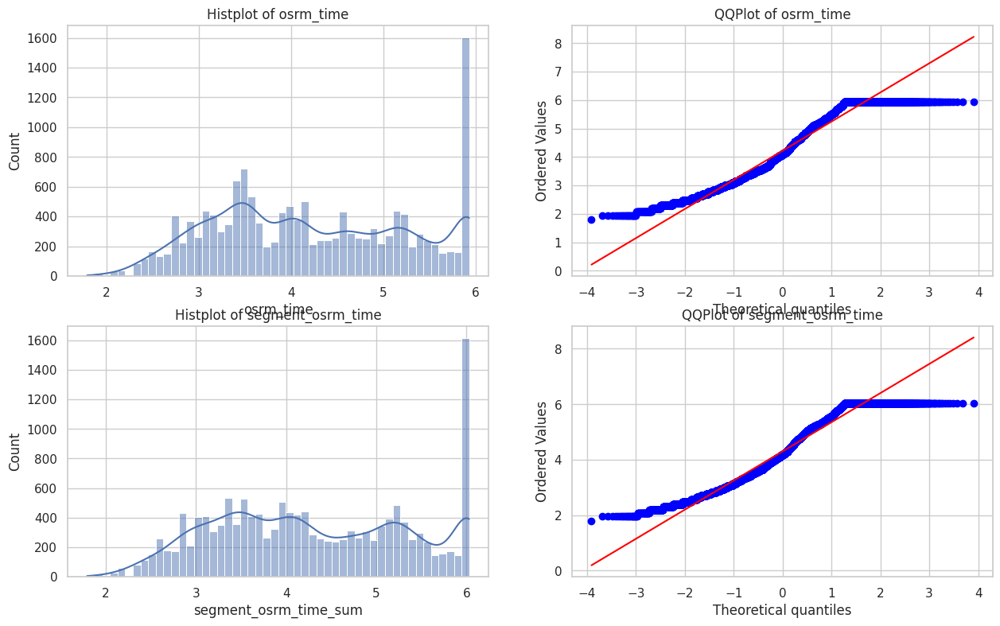

In [118]:
fig = plt.figure(figsize=(15,9))
ax = fig.add_subplot(2,2,1)
sns.histplot(osrm_time, bins=50, kde=True)
plt.title('Histplot of osrm_time')

ax = fig.add_subplot(2,2,2)
stats.probplot(osrm_time, dist='norm', plot=plt)
plt.title('QQPlot of osrm_time')

ax = fig.add_subplot(2,2,3)
sns.histplot(segment_osrm_time, bins=50, kde=True)
plt.title('Histplot of segment_osrm_time')

ax = fig.add_subplot(2,2,4)
stats.probplot(segment_osrm_time, dist='norm', plot=plt)
plt.title('QQPlot of segment_osrm_time')
plt.show()

Ho: osrm_time and segment_osrm_time have the same mean.
<br>
Ha: osrm_time and segment_osrm_time does not have the same mean.

From the plots both data osrm_time and segment_osrm_time is not normally distributed

In [119]:
from scipy.stats import shapiro, levene, anderson, ttest_ind

In [120]:
anderson(osrm_time, dist='norm'), anderson(segment_osrm_time, dist='norm')

(AndersonResult(statistic=np.float64(186.4359407655429), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(4.221224000468138), scale=np.float64(1.049430201953855))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'),
 AndersonResult(statistic=np.float64(171.04137099973923), critical_values=array([0.576, 0.656, 0.787, 0.918, 1.092]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=np.float64(4.29737454796529), scale=np.float64(1.0754230282968742))
  success: True
  message: '`anderson` successfully fit the distribution to the data.'))

In [121]:
levene(osrm_time, segment_osrm_time)

LeveneResult(statistic=np.float64(12.664311836843295), pvalue=np.float64(0.0003732840508603409))

osrm_distance and segment_osrm_distance are not normally distributed and also don't have equal variance.

Here we can use Brunner-Munzel Test

In [122]:
brunnermunzel(osrm_time, segment_osrm_time)

BrunnerMunzelResult(statistic=np.float64(7.139311539121746), pvalue=np.float64(9.596862191754218e-13))

###Result

As p < 0.05, reject Ho i.e. It is confirmed that There is significant difference in the Mean values of Aggregated osrm_time and Aggregated segment_osrm_time

#Encoding Cat col


In [123]:
from sklearn.preprocessing import OneHotEncoder

# Initialize encoder
ohe = OneHotEncoder(sparse_output=False, drop=None, handle_unknown='ignore')

# Transform only the 'route_type' column
encoded = ohe.fit_transform(df_iqr_clipped[['route_type']])

# Create DataFrame with new encoded column names
encoded_df = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(['route_type']))

# Concatenate back to original df (and optionally drop the original column)
df_encoded = pd.concat([df_iqr_clipped.drop(columns=['route_type']).reset_index(drop=True), encoded_df], axis=1)


In [124]:
encoded = ohe.fit_transform(df_segment_iqr_clipped[['route_type']])

# Create DataFrame with new encoded column names
encoded_df = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(['route_type']))

# Concatenate back to original df (and optionally drop the original column)
df_segment_encoded = pd.concat([df_segment_iqr_clipped.drop(columns=['route_type']).reset_index(drop=True), encoded_df], axis=1)

In [125]:
encoded = ohe.fit_transform(df_trip_iqr_clipped[['route_type']])

# Create DataFrame with new encoded column names
encoded_df = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(['route_type']))

# Concatenate back to original df (and optionally drop the original column)
df_trip_encoded = pd.concat([df_trip_iqr_clipped.drop(columns=['route_type']).reset_index(drop=True), encoded_df], axis=1)

#Scaling Features

In [126]:
from sklearn.preprocessing import MinMaxScaler

In [128]:
min_max_scaler = MinMaxScaler()

min_max_scaled_numerical = min_max_scaler.fit_transform(df_encoded[columns_plot])

df_scaled = pd.DataFrame(min_max_scaled_numerical, columns=columns_plot)

df_scaled.sample(10)

,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_time_diff_hour
125556,0.005754,0.019864,0.018379,0.025168,0.018573,0.021786,0.016026,0.005702
114078,0.734406,0.183463,0.175439,0.206376,0.174757,0.203341,0.185869,0.734046
69452,0.652805,0.182856,0.137845,0.159396,0.136767,0.136529,0.151367,0.652583
8905,0.040277,0.016613,0.062657,0.040268,0.063318,0.034858,0.022815,0.040309
49329,0.289002,0.052057,0.087719,0.058725,0.087801,0.052288,0.058037,0.288844
78996,0.019092,0.029300,0.060150,0.040268,0.060785,0.034858,0.037600,0.018928
127221,0.041846,0.054170,0.068505,0.080537,0.067539,0.098765,0.072773,0.041903
91977,0.017523,0.003180,0.020886,0.026846,0.020262,0.018882,0.007463,0.017531
36284,0.395449,0.086762,0.072682,0.100671,0.072604,0.091503,0.099941,0.395358
112861,0.175494,0.084819,0.132832,0.124161,0.132545,0.106028,0.096239,0.175298


In [129]:
min_max_scaled_numerical = min_max_scaler.fit_transform(df_segment_encoded[columns_plot])

df_segment_scaled = pd.DataFrame(min_max_scaled_numerical, columns=columns_plot)

df_segment_scaled.sample(10)

,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_time_diff_hour
25452,0.243863,0.156617,0.185351,0.190476,0.184290,0.227273,0.142426,0.244417
18557,0.129296,0.045797,0.152466,0.095238,0.151057,0.084416,0.058087,0.129177
19718,0.270049,0.095575,0.385650,0.124542,0.386707,0.123377,0.121848,0.269663
12966,0.265139,0.202158,0.215247,0.219780,0.211480,0.272727,0.234623,0.264758
10535,0.191489,0.296017,0.212257,0.380952,0.214502,0.344156,0.287548,0.191699
23071,0.180033,0.433955,0.278027,0.483516,0.280967,0.480519,0.393584,0.179414
21063,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
6148,0.252046,0.179143,0.484305,0.293040,0.486405,0.272727,0.180216,0.251458
23716,0.202946,0.530670,0.400598,0.432234,0.398792,0.376623,0.408482,0.202761
17485,0.263502,0.524477,0.206278,0.710623,0.202417,0.629870,0.574089,0.263487


In [130]:
min_max_scaled_numerical = min_max_scaler.fit_transform(df_trip_encoded[columns_plot])

df_trip_scaled = pd.DataFrame(min_max_scaled_numerical, columns=columns_plot)

df_trip_scaled.sample(10)

,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,segment_actual_time_sum,segment_osrm_time_sum,segment_osrm_distance_sum,od_time_diff_hour
6860,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
312,0.049777,0.025628,0.028204,0.064777,0.027177,0.063415,0.041360,0.050075
3401,0.043834,0.010223,0.039240,0.035088,0.039531,0.031707,0.030421,0.043784
10445,0.041605,0.022807,0.057633,0.024291,0.056825,0.019512,0.022166,0.041245
777,0.144131,0.074582,0.132434,0.070175,0.132180,0.058537,0.068434,0.144171
12273,0.257801,0.318305,0.257511,0.296896,0.256949,0.278049,0.328317,0.258328
6563,0.263001,0.148813,0.302882,0.191633,0.300185,0.256098,0.188763,0.262919
11863,0.049034,0.002126,0.031882,0.021592,0.032119,0.019512,0.013448,0.049323
2289,0.222140,0.294392,0.323728,0.261808,0.319951,0.224390,0.267462,0.222503
1463,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# ***Key Data Observations***

- Data scope: 144,867 records covering ~22 days (Sep 12–Oct 3, 2018). After dropping 5 unused fields (is_cutoff, cutoff_factor, etc.), the cleaned dataset has 19 columns and no nulls in numeric fields. There were 293 missing source names and 261 missing destination names, which were filled with the center ID to eliminate all NAs.

- Trips and segments: There are ~14,817 unique trips (identified by trip_uuid) and 26,368 unique segments (combining trip ID + source + dest). This implies an average of ~9.8 segments per trip (144,867 rows ÷ 14,817 trips).

- Route types: 68.8% of trips use FTL (Full Truck Load) and 31.2% use Carting, i.e. FTL dominates volume. In raw counts, there are 99,660 FTL and 45,207 Carting records.

- Centers: The busiest source is Gurgaon_Bilaspur_HB (Haryana) with 23,347 trips (≈16.1% of all records). Other top sources include Bangalore_Nelmngla_HB (Karnataka, ~9,975 trips) and Bhiwandi_Mankoli_HB (Maharashtra, ~9,088 trips). As destinations, the same hubs appear (e.g. Gurgaon 15,321 trips, Bangalore ~11,105) – indicating Haryana and Karnataka dominate the network.



# ***Operational Insights (volume, routing, delays, distance, time)***

- Volume: Roughly 6.6k segments per day (144,867/22) indicate sustained workload. FTL drives most of this volume.

- Distance: Avg delivery distance ≈234 km, but half of deliveries are short: 50% ≤66.1 km, 75% ≤286.7 km. The max distance is ~1,927 km, highlighting a long-tail of very long hauls.

- Time: Avg actual delivery time ≈417 min (~7 hrs), median 132 min, 75% ≤513 min. OSRM-estimated (routing) time is much lower (mean ~214 min, median 64 min).

- Delay ratio: Actual times are on average 2.12× the OSRM estimate (mean factor=2.120, median 1.857). In other words, deliveries take roughly double the naïve routing time on average, due to stops, waits, or other delays. (Similarly, segment-level delays show mean factor ~2.22.)

- Variation & outliers: The data is highly skewed – e.g. 25% of trips take ≤51 min, but the longest trip took 4,532 min (≈75 hours). A few multi-day deliveries (and high factors up to 77×) drive up the mean. About 25% of trips take less than 1 hr (25% quantile=51 min) and 25% of distances less than 23.4 km.

- Multi-stop impact: Many trips have multiple legs. Each segment’s actual time (mean ~36.2 min) is about twice its OSRM time (~18.5 min), echoing the overall delay factor.


# ***Corridor and State-Level Findings***

- Busiest corridors: Top source–dest corridors (by trip count) are intra-Karnataka runs around Bangalore. The busiest segment corridor is Bangalore_Nelmngla_H → Bengaluru_KGAirprt_HB with 151 segments, followed by Bangalore_Nelmngla_H → Bengaluru_Bomsndra_HB (127 segments), and Bengaluru_Bomsndra_HB → Bengaluru_KGAirprt_HB (121). The top trip corridors mirror this (e.g. Bangalore_Nelmngla → Bengaluru_KGAirprt with 151 trips).

- Top origin/dest states: Haryana (Gurgaon area) and Karnataka (Bengaluru area) dominate activity. Gurgaon_Bilaspur_HB alone accounts for ~16% of all trips. Key destination centers include the same hubs plus large Maharashtra DCPs. Maharashtra and Karnataka handle large volumes. West Bengal and UP have negligible shares in this sample period.

- Concentration: The top 5 source centers account for ~37% of all trips (Gurgaon 16.1%, Bangalore_Nelmngla 6.9%, Bhiwandi 6.3%, Pune_Tathawde 2.8%, Hyderabad_Shamshabad 2.3%). This suggests a concentrated set of corridors driving most volume.



# ***Business Recommendations (actionable insights)***

- Focus on top corridors: Given the concentration of volume, prioritize resources (trucks, scheduling) on the busiest corridors. For example, the Bangalore inner-city routes (Nelmngla↔Bomsndra↔Airport) and the Gurgaon-Haryana hub are critical – scheduling more frequent shuttles or allocating larger vehicles there could improve efficiency.

- Improve ETA accuracy: The actual vs OSRM gap (~2×) is large. Route planning and customer SLAs should incorporate this factor. Investigate why times are so inflated (e.g. traffic, loading delays, multi-stops) and adjust OSRM or routing parameters accordingly. For instance, add typical dwell times per stop or use historical data to better predict trip duration.

- Optimize multi-stop scheduling: Since ~80% of trips are multi-segment, optimizing the sequence of stops (or considering dynamic re-routing) could cut down on cumulative delays. If certain intermediate centers cause heavy delays, consider direct runs or cross-docking alternatives.

- Address data issues: Fix the anomalous data collection (negative and extremely high times) to avoid skewed analytics. This may involve calibrating scanners timestamps or removing obviously bad records from KPIs. Accurate timing is crucial for on-time performance metrics.

- State-level strategy: Haryana (especially the Gurgaon hub) accounts for ~16% of trips. Investing in that region (e.g. additional hub capacity or local delivery fleet) could yield outsized benefits. Likewise, build capacity around Karnataka (Bengaluru) to handle its large share.